In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
from brainbox.behavior.training import compute_performance 
from brainbox.io.one import SessionLoader 
# import iblphotometry.kcenia as kcenia
import ibldsp.utils
import scipy.signal
from iblutil.numerical import rcoeff
from functions import *
import sys
sys.path.insert(0, "/home/kceniabougrova/Documents/GitHub/ibl-photometry/src")

from one.api import ONE #always after the imports
# one = ONE(cache_dir="/mnt/h0/kb/data/one") 
one = ONE() 


# table_path = '/home/kceniabougrova/Downloads/NewSessions_Aug2025_New.csv' 
table_path = '/home/kceniabougrova/Downloads/new_sessions_Aug2025 - all_together.csv'
sessions_list = pd.read_csv(table_path)


# i = 1000 #select the session here #DA
# i = 1224
i = 1627 
# i = 736

eid, subject, date, region, nph_file_path, nph_bnc_path = select_one_session(
    sessions_list, row=i)


old_prefix = '/mnt/h0/kb/'
new_prefix = '/media/kceniabougrova/Seagate Basic/IBL_server_PC_20250529/kb/'

nph_file_path = nph_file_path.replace(old_prefix, new_prefix)
nph_bnc_path = nph_bnc_path.replace(old_prefix, new_prefix)

# Load the CSVs
df_nph = pd.read_csv(nph_file_path)
df_bnc = pd.read_csv(nph_bnc_path)

# Load the behavior
df_trials, subject, session_date = load_trials_updated(eid)

try:
    df_trials, subject, session_date = load_trials_updated(eid)
    if df_trials is None or df_trials.empty:
        raise ValueError("df_trials is empty")
    print("✅ df_trials created successfully with load_trials_updated")
except Exception as e:
    print(f"⚠️ load_trials_updated failed: {e}")
    print("👉 Trying load_trials_updated_for_sessions_with_task00...")
    df_trials, subject, session_date = load_trials_updated_for_sessions_with_task00(eid)

print(f"Final df_trials shape: {df_trials.shape if df_trials is not None else None}")

f00f4182-58b3-4a66-a18b-e1b199de03c6
{'subject': 'ZFM-06275', 'date': datetime.date(2023, 10, 6), 'sequence': 1}
ZFM-06275 2023-10-06 f00f4182-58b3-4a66-a18b-e1b199de03c6


ALFMultipleCollectionsFound: "alf", "alf/task_00" 
 The matching object/file(s) belong to more than one collection.  ALF names have the pattern collection/(_namespace_)object.attribute(_timescale).extension, e.g. for the file "alf/probe01/spikes.times.npy" the collection is "alf/probe01" 

In [25]:
eid

'f00f4182-58b3-4a66-a18b-e1b199de03c6'

In [26]:
trials = one.load_object(eid, 'trials', collection='alf')

ref = one.eid2ref(eid)
subject = ref.subject
session_date = str(ref.date) 
if len(trials['intervals'].shape) == 2: 
    trials['intervals_0'] = trials['intervals'][:, 0]
    trials['intervals_1'] = trials['intervals'][:, 1]
    del trials['intervals']  # Remove original nested array 
df_trials = pd.DataFrame(trials) 
df_trials.columns

Index(['repNum', 'stimOffTrigger_times', 'quiescencePeriod', 'stimOff_times',
       'goCueTrigger_times', 'stimOnTrigger_times', 'goCue_times',
       'response_times', 'choice', 'stimOn_times', 'contrastLeft',
       'contrastRight', 'feedback_times', 'feedbackType', 'rewardVolume',
       'probabilityLeft', 'firstMovement_times', 'intervals_0', 'intervals_1'],
      dtype='object')

In [19]:
df_trials.columns

Index(['stimOnTrigger_times', 'goCueTrigger_times', 'allContrasts',
       'allSContrasts', 'stimOff_times', 'stimOffTrigger_times', 'included',
       'quiescencePeriod', 'goCue_times', 'response_times', 'choice',
       'stimOn_times', 'contrastLeft', 'contrastRight', 'feedback_times',
       'feedbackType', 'rewardVolume', 'probabilityLeft',
       'firstMovement_times', 'intervals_0', 'intervals_1', 'subject', 'date',
       'eid', 'reactionTime', 'responseTime', 'quiescenceTime', 'trialTime',
       'probL', 'trialNumber'],
      dtype='object')

In [14]:
print(subject, date, region)


df_nph["mouse"] = subject
df_nph["date"] = session_date
df_nph["region"] = region
df_nph["eid"] = eid 

# Remove 'Value.' prefix from columns
df_bnc.columns = [col.replace("Value.", "") for col in df_bnc.columns]
df_bnc = df_bnc[df_bnc["Value"] == True].reset_index(drop=True)

tph = df_bnc["Timestamp"].values

ZFM-05236 2023-06-20 Region4G


In [179]:
len(tph)

670

In [180]:
i

1244

In [181]:
sessions_list[955:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
955,570.0,ZFM-04533,2022-12-30,NE,1b3db3e1-9777-4ad5-80e9-703c87550ad2,probe17,Region3G,3,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-045...,NaN,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
956,571.0,ZFM-04534,2022-12-30,NE,51678022-d298-475a-a740-3e46a2159424,probe18,Region4G,3,0,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-045...,NaN,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
957,572.0,ZFM-05235,2022-12-30,5HT,ab725a59-2e6a-4fb3-b5ca-d13272a61143,probe20,Region4G,4,0,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-052...,/mnt/h0/kb/data/external_drive/2022-12-30/raw_...,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
958,574.0,ZFM-05245,2022-12-30,5HT,c50eb87e-93e6-4467-bba2-3b6dd9d7ff66,probe22,Region3G,4,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-052...,NaN,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
959,NaN,ZFM-04392,2022-12-30,5HT,017b9cc4-b718-402a-8406-8194b1e911a4,probe14,Region3G,1,0,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
960,NaN,ZFM-03448,2022-12-30,DA,bb1ff018-9b24-46aa-9ef2-91995a321cac,probe07,Region3G,2,0,HCW free wheel,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
961,NaN,ZFM-03447,2022-12-30,DA,ffa02c42-fc37-4701-9b3e-310498872526,probe06,Region4G,2,1,HCW free wheel,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
962,NaN,ZFM-03447,2022-12-30,DA,ffa02c42-fc37-4701-9b3e-310498872526,probe06,Region3G,7,0,ephys passiveephys passiveInd KB TTL = valve a...,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
963,NaN,ZFM-03448,2022-12-30,DA,bb1ff018-9b24-46aa-9ef2-91995a321cac,probe07,Region3G,8,0,ephys passiveInd KB TTL = valve and sound (all...,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
964,NaN,ZFM-03448,2023-01-04,DA,746d1803-9230-4c38-b17f-799fea5cbb3d,probe07,Region3G,0,0,Passive with valve ON (before it was off),/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN


In [182]:
sessions_list[995:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
995,NaN,ZFM-04019,2023-01-17,DA,NaN,probe11,Region3G,1,1,3x waterflush,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
996,597.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe09,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
997,598.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe08,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
998,599.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe12,Region3G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
999,600.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe13,Region4G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
1000,601.0,ZFM-04019,2023-01-19,DA,382c9380-a2f7-411f-949d-a6df6c00747f,probe11,Region3G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-040...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1001,602.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe12,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1002,603.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe13,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1003,NaN,ZFM-04392,2023-01-19,5HT,4240a193-39b6-4d1a-8adf-2ddb43a966f3,probe14,Region4G,1,0,check which nph file,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
1004,604.0,ZFM-04022,2023-01-24,DA,3fa057d6-8f25-462e-b728-e3b2df0e9365,probe12,Region3G,1,0,new TTL ITI,/mnt/h0/kb/data/external_drive/2023-01-24/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-24/bons...,NaN,NaN,NaN


In [183]:
sessions_list["ttl nph"][i] = len(tph)

<ipython-input-183-c21f2e248251>:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sessions_list["ttl nph"][i] = len(tph)
<ipython-input-183-c21f2e248251>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

In [184]:
sessions_list[995:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
995,NaN,ZFM-04019,2023-01-17,DA,NaN,probe11,Region3G,1,1,3x waterflush,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
996,597.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe09,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
997,598.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe08,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
998,599.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe12,Region3G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
999,600.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe13,Region4G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
1000,601.0,ZFM-04019,2023-01-19,DA,382c9380-a2f7-411f-949d-a6df6c00747f,probe11,Region3G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-040...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1001,602.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe12,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1002,603.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe13,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1003,NaN,ZFM-04392,2023-01-19,5HT,4240a193-39b6-4d1a-8adf-2ddb43a966f3,probe14,Region4G,1,0,check which nph file,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
1004,604.0,ZFM-04022,2023-01-24,DA,3fa057d6-8f25-462e-b728-e3b2df0e9365,probe12,Region3G,1,0,new TTL ITI,/mnt/h0/kb/data/external_drive/2023-01-24/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-24/bons...,NaN,NaN,NaN


==== Matching _times columns ====
stimOnTrigger_times: corr = 1.000, len ratio = 1.00
goCueTrigger_times: corr = 1.000, len ratio = 1.00
goCue_times: corr = 1.000, len ratio = 1.00
stimOn_times: corr = 0.305, len ratio = 1.01
firstMovement_times: corr = 0.278, len ratio = 1.01
stimOffTrigger_times: corr = 0.185, len ratio = 1.00
stimOff_times: corr = 0.185, len ratio = 1.00
response_times: corr = 0.183, len ratio = 1.00
feedback_times: corr = 0.183, len ratio = 1.00
✅ Multiple likely matches: ['stimOnTrigger_times', 'goCueTrigger_times', 'goCue_times']


<ipython-input-185-c5c48022f1fa>:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sessions_list["ttl behav"][i] = len(tbpod)
<ipython-input-185-c5c48022f1fa>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a

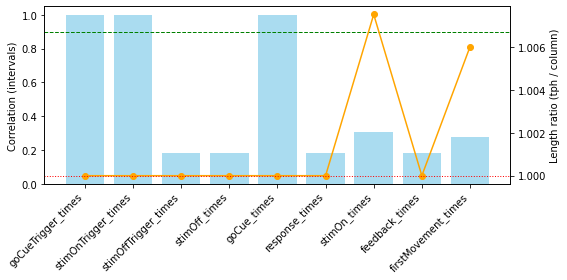

In [185]:
tbpod = df_trials['stimOnTrigger_times'].values #bpod TTL times
sessions_list["ttl behav"][i] = len(tbpod)

best_cols, match_scores = find_matching_trials_column(df_trials, tph)

In [186]:
len(tbpod)

670

In [187]:
sessions_list[955:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
955,570.0,ZFM-04533,2022-12-30,NE,1b3db3e1-9777-4ad5-80e9-703c87550ad2,probe17,Region3G,3,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-045...,NaN,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
956,571.0,ZFM-04534,2022-12-30,NE,51678022-d298-475a-a740-3e46a2159424,probe18,Region4G,3,0,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-045...,NaN,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
957,572.0,ZFM-05235,2022-12-30,5HT,ab725a59-2e6a-4fb3-b5ca-d13272a61143,probe20,Region4G,4,0,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-052...,/mnt/h0/kb/data/external_drive/2022-12-30/raw_...,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
958,574.0,ZFM-05245,2022-12-30,5HT,c50eb87e-93e6-4467-bba2-3b6dd9d7ff66,probe22,Region3G,4,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-052...,NaN,/mnt/h0/kb/data/external_drive/2022-12-30/bons...,NaN,NaN,NaN
959,NaN,ZFM-04392,2022-12-30,5HT,017b9cc4-b718-402a-8406-8194b1e911a4,probe14,Region3G,1,0,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
960,NaN,ZFM-03448,2022-12-30,DA,bb1ff018-9b24-46aa-9ef2-91995a321cac,probe07,Region3G,2,0,HCW free wheel,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
961,NaN,ZFM-03447,2022-12-30,DA,ffa02c42-fc37-4701-9b3e-310498872526,probe06,Region4G,2,1,HCW free wheel,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
962,NaN,ZFM-03447,2022-12-30,DA,ffa02c42-fc37-4701-9b3e-310498872526,probe06,Region3G,7,0,ephys passiveephys passiveInd KB TTL = valve a...,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
963,NaN,ZFM-03448,2022-12-30,DA,bb1ff018-9b24-46aa-9ef2-91995a321cac,probe07,Region3G,8,0,ephys passiveInd KB TTL = valve and sound (all...,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
964,NaN,ZFM-03448,2023-01-04,DA,746d1803-9230-4c38-b17f-799fea5cbb3d,probe07,Region3G,0,0,Passive with valve ON (before it was off),/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN


In [188]:
sessions_list[995:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
995,NaN,ZFM-04019,2023-01-17,DA,NaN,probe11,Region3G,1,1,3x waterflush,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
996,597.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe09,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
997,598.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe08,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
998,599.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe12,Region3G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
999,600.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe13,Region4G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
1000,601.0,ZFM-04019,2023-01-19,DA,382c9380-a2f7-411f-949d-a6df6c00747f,probe11,Region3G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-040...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1001,602.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe12,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1002,603.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe13,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1003,NaN,ZFM-04392,2023-01-19,5HT,4240a193-39b6-4d1a-8adf-2ddb43a966f3,probe14,Region4G,1,0,check which nph file,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
1004,604.0,ZFM-04022,2023-01-24,DA,3fa057d6-8f25-462e-b728-e3b2df0e9365,probe12,Region3G,1,0,new TTL ITI,/mnt/h0/kb/data/external_drive/2023-01-24/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-24/bons...,NaN,NaN,NaN


In [189]:
sessions_list["ttl behav"][i] = (len(tbpod))

<ipython-input-189-c0bdf499a78d>:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sessions_list["ttl behav"][i] = (len(tbpod))
<ipython-input-189-c0bdf499a78d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

In [190]:
sessions_list["ttl behav"][i] = int(len(tbpod))

<ipython-input-190-de7951e4be3d>:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  sessions_list["ttl behav"][i] = int(len(tbpod))
<ipython-input-190-de7951e4be3d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

In [191]:
sessions_list.loc[i, "ttl behav"] = int(len(tbpod))

In [192]:
sessions_list[995:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
995,NaN,ZFM-04019,2023-01-17,DA,NaN,probe11,Region3G,1,1,3x waterflush,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
996,597.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe09,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
997,598.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe08,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
998,599.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe12,Region3G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
999,600.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe13,Region4G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
1000,601.0,ZFM-04019,2023-01-19,DA,382c9380-a2f7-411f-949d-a6df6c00747f,probe11,Region3G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-040...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1001,602.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe12,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1002,603.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe13,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1003,NaN,ZFM-04392,2023-01-19,5HT,4240a193-39b6-4d1a-8adf-2ddb43a966f3,probe14,Region4G,1,0,check which nph file,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
1004,604.0,ZFM-04022,2023-01-24,DA,3fa057d6-8f25-462e-b728-e3b2df0e9365,probe12,Region3G,1,0,new TTL ITI,/mnt/h0/kb/data/external_drive/2023-01-24/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-24/bons...,NaN,NaN,NaN


In [193]:
sessions_list.loc[i, "ttl behav"] = int(len(tbpod))

In [194]:
sessions_list[995:1005]

,Unnamed: 0,subject,date,NM,eid,fiber,region,nph_file,nph_bnc,comment,photometry_path_a,photometry_path_b,digital_inputs_path,comment2,ttl nph,ttl behav
995,NaN,ZFM-04019,2023-01-17,DA,NaN,probe11,Region3G,1,1,3x waterflush,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
996,597.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe09,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
997,598.0,ZFM-03450,2023-01-18,DA,29726dbf-c61c-49ab-a006-d279e480a31f,probe08,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
998,599.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe12,Region3G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
999,600.0,ZFM-04022,2023-01-18,DA,f0eb3ff8-873e-4bce-8082-7c8e28b47edb,probe13,Region4G,1,0,new,/mnt/h0/kb/data/external_drive/2023-01-18/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-18/bons...,NaN,NaN,NaN
1000,601.0,ZFM-04019,2023-01-19,DA,382c9380-a2f7-411f-949d-a6df6c00747f,probe11,Region3G,1,1,NaN,/mnt/h0/kb/data/one/mainenlab/Subjects/ZFM-040...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1001,602.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe12,Region3G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1002,603.0,ZFM-04022,2023-01-19,DA,195af50b-9118-4ecd-a254-78f903f788bb,probe13,Region4G,0,0,new,/mnt/h0/kb/data/external_drive/2023-01-19/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-19/bons...,NaN,NaN,NaN
1003,NaN,ZFM-04392,2023-01-19,5HT,4240a193-39b6-4d1a-8adf-2ddb43a966f3,probe14,Region4G,1,0,check which nph file,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,/media/kceniabougrova/Seagate Basic/IBL_server...,NaN,NaN,NaN
1004,604.0,ZFM-04022,2023-01-24,DA,3fa057d6-8f25-462e-b728-e3b2df0e9365,probe12,Region3G,1,0,new TTL ITI,/mnt/h0/kb/data/external_drive/2023-01-24/raw_...,NaN,/mnt/h0/kb/data/external_drive/2023-01-24/bons...,NaN,NaN,NaN


In [195]:
int(len(tbpod))

670

==== Matching _times columns ====
stimOnTrigger_times: corr = 1.000, len ratio = 1.00
goCueTrigger_times: corr = 1.000, len ratio = 1.00
goCue_times: corr = 1.000, len ratio = 1.00
stimOn_times: corr = 0.305, len ratio = 1.01
firstMovement_times: corr = 0.278, len ratio = 1.01
stimOffTrigger_times: corr = 0.185, len ratio = 1.00
stimOff_times: corr = 0.185, len ratio = 1.00
response_times: corr = 0.183, len ratio = 1.00
feedback_times: corr = 0.183, len ratio = 1.00
✅ Multiple likely matches: ['stimOnTrigger_times', 'goCueTrigger_times', 'goCue_times']


/home/kceniabougrova/Documents/NM_project_fromIBLserver/NM_project2/functions.py:107: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(cols_plot, rotation=45, ha='right')


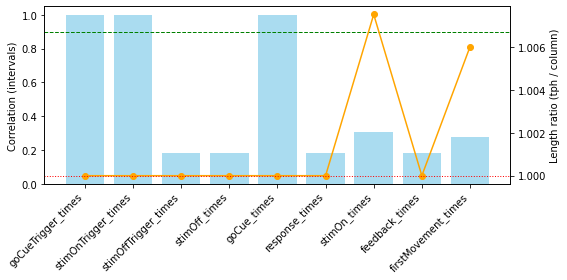

0          675.181600
1          675.198240
2          675.214912
3          675.231552
4          675.248224
             ...     
298734    5653.919328
298735    5653.936000
298736    5653.952672
298737    5653.969344
298738    5653.986016
Name: Timestamp, Length: 298739, dtype: float64

In [196]:
tbpod = df_trials['stimOnTrigger_times'].values #bpod TTL times
sessions_list.loc[i, "ttl behav"] = int(len(tbpod))


best_cols, match_scores = find_matching_trials_column(df_trials, tph)




"""
CHANGE INPUT AUTOMATICALLY 
"""
# iup = ibldsp.utils.rises(df_nph[f'Input{df_bnc}'].values) #idx nph TTL times 
# tph = (df_nph['Timestamp'].values[iup] + df_nph['Timestamp'].values[iup - 1]) / 2 #nph TTL times computed for the midvalue 
#KB commented two previous and added the next line 

fcn_nph_to_bpod_times, drift_ppm = ibldsp.utils.sync_timestamps(tph, tbpod, linear=True) #interpolation 
if len(tph)/len(tbpod) < .9: 
    print("mismatch in sync, will try to add ITI duration to the sync")
    tbpod = np.sort(np.r_[
        df_trials['intervals_0'].values,
        df_trials['intervals_1'].values - 1,  # here is the trick
        df_trials.loc[df_trials['feedbackType'] == 1, 'feedback_times'].values]
    )
    fcn_nph_to_bpod_times, drift_ppm = ibldsp.utils.sync_timestamps(tph, tbpod, linear=True)
    if len(tph)/len(tbpod) > .9:
        print("still mismatch, maybe this is an old session")
        tbpod = np.sort(np.r_[df_trials['stimOnTrigger_times'].values])
        fcn_nph_to_bpod_times, drift_ppm, iph, ibpod = ibldsp.utils.sync_timestamps(tph, tbpod, linear=True, return_indices=True) 
        assert len(iph)/len(tbpod) > .9
        print("recovered from sync mismatch, continuing #2")
assert abs(drift_ppm) < 100, "drift is more than 100 ppm"

df_nph["bpod_frame_times"] = fcn_nph_to_bpod_times(df_nph["Timestamp"]) 

fcn_nph_to_bpod_times(df_nph["Timestamp"])

df_nph["Timestamp"]

In [197]:
# df_trials = df_trials[0:len(df_trials)-1] #to avoid the last trial not having photometry data 
session_start = df_trials.intervals_0.values[0] - 10  # Start time, 100 seconds before the first tph value
session_end = df_trials.intervals_1.values[-1] + 10   # End time, 100 seconds after the last tph value

# Select data within the specified time range
selected_data = df_nph[
    (df_nph['bpod_frame_times'] >= session_start) &
    (df_nph['bpod_frame_times'] <= session_end)
] 
df_nph = selected_data.reset_index(drop=True) 




print("Len TTL: ", len(tph), "Len tbpod: ", len(tbpod), "Len trials: ", len(df_trials))

Len TTL:  670 Len tbpod:  670 Len trials:  670


Option 1: same length :)
470 =  136155  415 =  136155


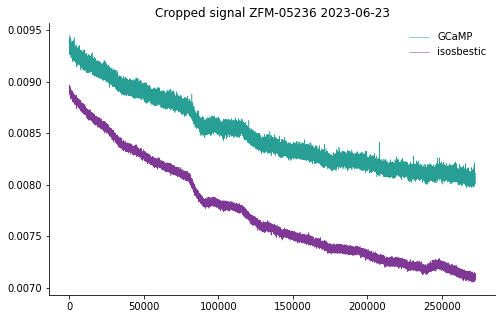

In [198]:
#===========================================================================
#      4. FUNCTIONS TO LOAD DATA AND ADD SOME VARIABLES (BEHAVIOR)
#===========================================================================
df_nph = LedState_or_Flags(df_nph)

""" 4.1.2 Check for LedState/previous Flags bugs """ 
""" 4.1.2.1 Length """
# Verify the length of the data of the 2 different LEDs
df_470, df_415 = verify_length(df_nph)
""" 4.1.2.2 Verify if there are repeated flags """ 
verify_repetitions(df_nph["LedState"])
""" 4.1.3 Remove "weird" data (flag swap, huge signal) """ 
# session_day=rec.date
# plot_outliers(df_470,df_415,region,mouse,session_day) 

df_ph_1 = df_nph

# Pick the right column name automatically
colname = "LedState" if "LedState" in df_ph_1.columns else "Flags"

"""
##TO LEAD WITH REPEATED FLAGS 
# index where the swap happens
swap_idx = 9546  

# Make a copy so we don’t overwrite original
df_fixed = df_ph_1.copy()

# Flip flags from swap_idx onward
df_fixed.loc[swap_idx:, colname] = df_fixed.loc[swap_idx:, colname].map({1: 2, 2: 1})

df_ph_1 = df_fixed

"""

# Remove rows with col == 1 at both ends
if df_ph_1[colname].iloc[0] == 1 and df_ph_1[colname].iloc[-1] == 1:
    df_ph_1 = df_ph_1.iloc[1:]

# Remove rows with col == 2 at both ends
if df_ph_1[colname].iloc[0] == 2 and df_ph_1[colname].iloc[-1] == 2:
    df_ph_1 = df_ph_1.iloc[:-2]

# Filter data for LedState 2 (470nm)
df_470 = df_ph_1[df_ph_1[colname] == 2]

# Filter data for LedState 1 (415nm)
df_415 = df_ph_1[df_ph_1[colname] == 1]

# Check if the lengths of df_470 and df_415 are equal
assert len(df_470) == len(df_415), "Sync arrays are of different lengths"

# Plot the data
plt.rcParams["figure.figsize"] = (8, 5)
plt.plot(df_470[region], c='#279F95', linewidth=0.5)
plt.plot(df_415[region], c='#803896', linewidth=0.5)
plt.title("Cropped signal "+subject+' '+str(session_date))
plt.legend(["GCaMP", "isosbestic"], frameon=False)
sns.despine(left=False, bottom=False)
plt.show(block=False)
plt.close()

470 = 136155  415 = 136155


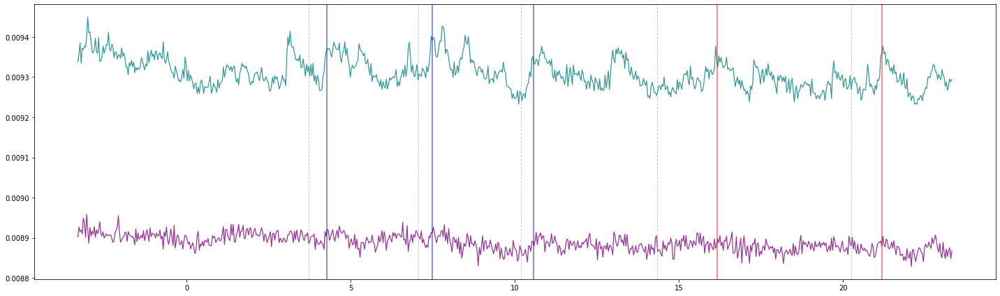

In [199]:
# Print counts
print("470 =", df_470['LedState'].count(), " 415 =", df_415['LedState'].count())

df_nph = df_ph_1.reset_index(drop=True)  
df_470 = df_nph[df_nph.LedState==2] 
df_470 = df_470.reset_index(drop=True)
df_415 = df_nph[df_nph.LedState==1] 
df_415 = df_415.reset_index(drop=True) 
#================================================
""" 4.1.4 FRAME RATE """ 
time_diffs = (df_470["Timestamp"]).diff().dropna() 
fs = 1 / time_diffs.median() 

raw_reference = df_415[region] #isosbestic 
raw_signal = df_470[region] #GCaMP signal 
raw_timestamps_bpod = df_470["bpod_frame_times"]
raw_timestamps_nph_470 = df_470["Timestamp"]
raw_timestamps_nph_415 = df_415["Timestamp"]
raw_TTL_bpod = tbpod
raw_TTL_nph = tph

# my_array = np.c_[raw_timestamps_bpod, raw_reference, raw_signal]
my_array = np.column_stack((raw_timestamps_bpod, raw_reference, raw_signal))

df_nph = pd.DataFrame(my_array, columns=['times', 'raw_isosbestic', 'raw_calcium']) #IMPORTANT DF


plt.figure(figsize=(20, 6))

# Plot calcium and isosbestic signals
plt.plot(df_nph['times'][200:1000], df_nph['raw_calcium'][200:1000], linewidth=1.25, alpha=0.8, color='teal') 
plt.plot(df_nph['times'][200:1000], df_nph['raw_isosbestic'][200:1000], linewidth=1.25, alpha=0.8, color='purple') 

# Vertical lines at stimulus onset
for t in df_trials['stimOnTrigger_times'].dropna():
    if df_nph['times'].iloc[200] <= t <= df_nph['times'].iloc[999]:
        plt.axvline(t, color='gray', linestyle='--', alpha=0.4, linewidth=1)

# Vertical lines at feedback times, color-coded by feedbackType
for t, fb_type in zip(df_trials['feedback_times'], df_trials['feedbackType']):
    if pd.notna(t) and df_nph['times'].iloc[200] <= t <= df_nph['times'].iloc[999]:
        color = 'blue' if fb_type == 1 else 'red' if fb_type == -1 else 'gray'
        plt.axvline(t, color=color, linestyle='-', alpha=0.6, linewidth=1.5)

plt.tight_layout()
plt.show()

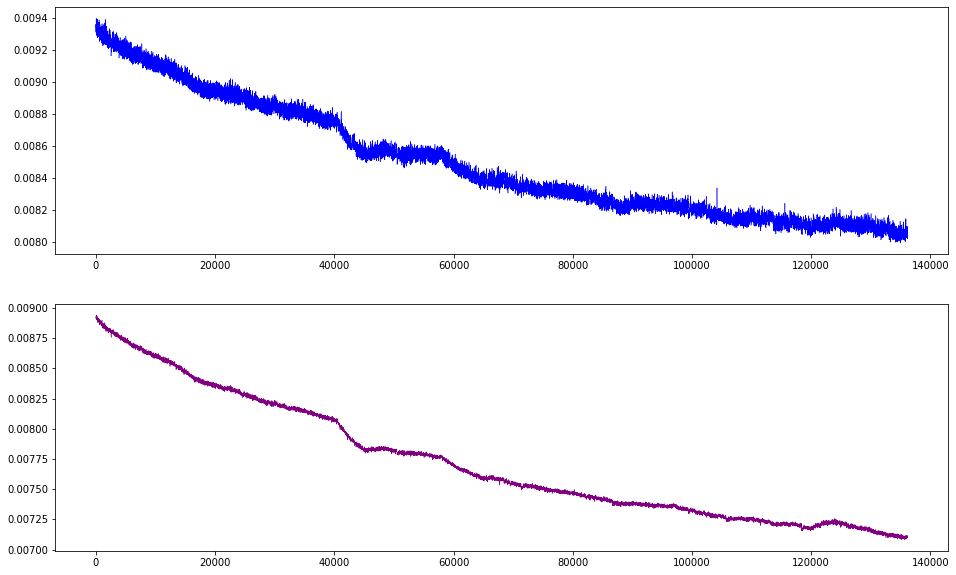

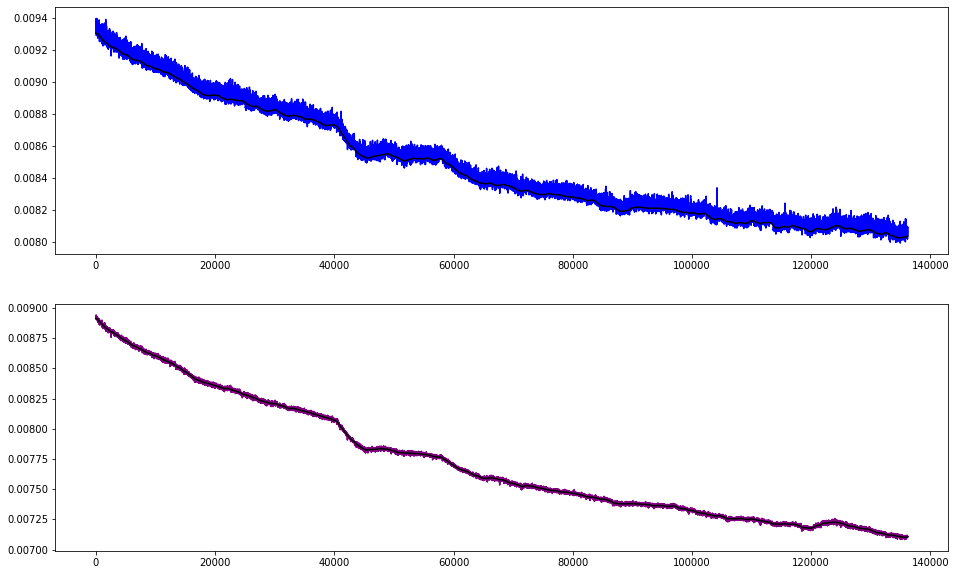

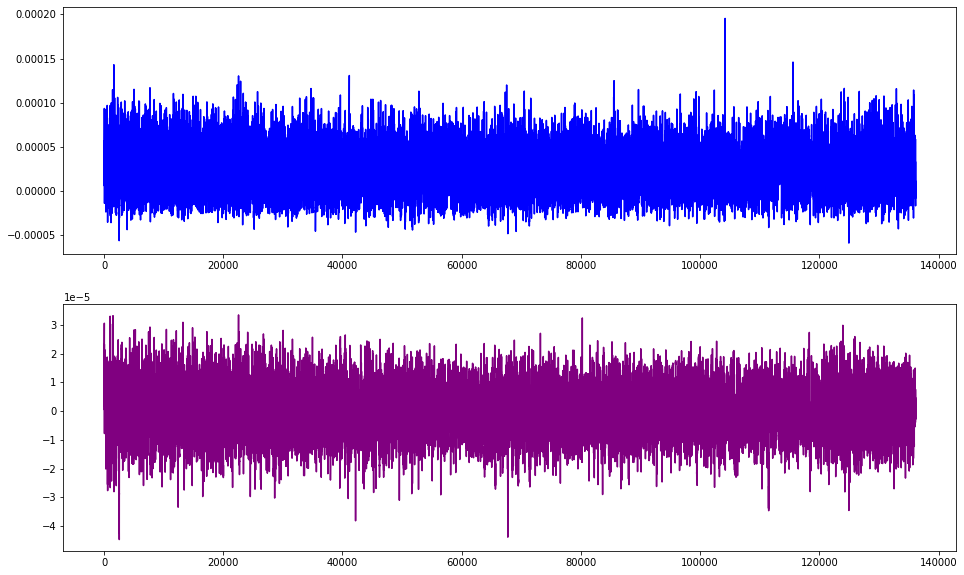

In [200]:
##############################################################################################################################


raw_reference = df_nph['raw_isosbestic'][0:]
raw_signal = df_nph['raw_calcium'][0:]

smooth_win = 10
smooth_reference = smooth_signal(raw_reference, smooth_win)
smooth_signal = smooth_signal(raw_signal, smooth_win) 

fig = plt.figure(figsize=(16, 10))
ax1 = fig.add_subplot(211)
ax1.plot(smooth_signal,'blue',linewidth=0.5)
ax2 = fig.add_subplot(212)
ax2.plot(smooth_reference,'purple',linewidth=0.5)



lambd = 5e4 # Adjust lambda to get the best fit
porder = 1
itermax = 50
r_base=airPLS(smooth_reference.T,lambda_=lambd,porder=porder,itermax=itermax)
s_base=airPLS(smooth_signal,lambda_=lambd,porder=porder,itermax=itermax)

fig = plt.figure(figsize=(16, 10))
ax1 = fig.add_subplot(211)
ax1.plot(smooth_signal,'blue',linewidth=1.5)
ax1.plot(s_base,'black',linewidth=1.5)
ax2 = fig.add_subplot(212)
ax2.plot(smooth_reference,'purple',linewidth=1.5)
ax2.plot(r_base,'black',linewidth=1.5)





remove=0
reference = (smooth_reference[remove:] - r_base[remove:])
signal = (smooth_signal[remove:] - s_base[remove:])  

fig = plt.figure(figsize=(16, 10))
ax1 = fig.add_subplot(211)
ax1.plot(signal,'blue',linewidth=1.5)
ax2 = fig.add_subplot(212)
ax2.plot(reference,'purple',linewidth=1.5)

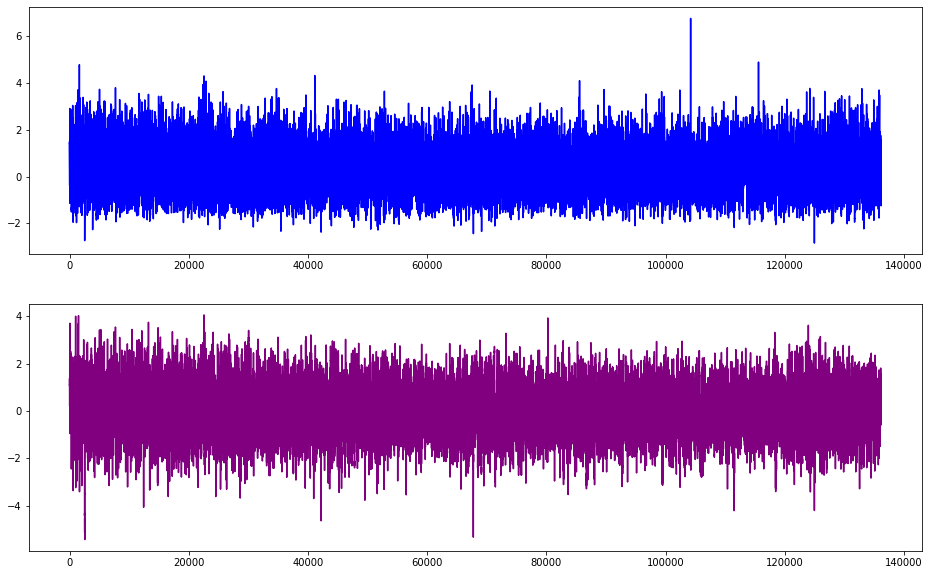

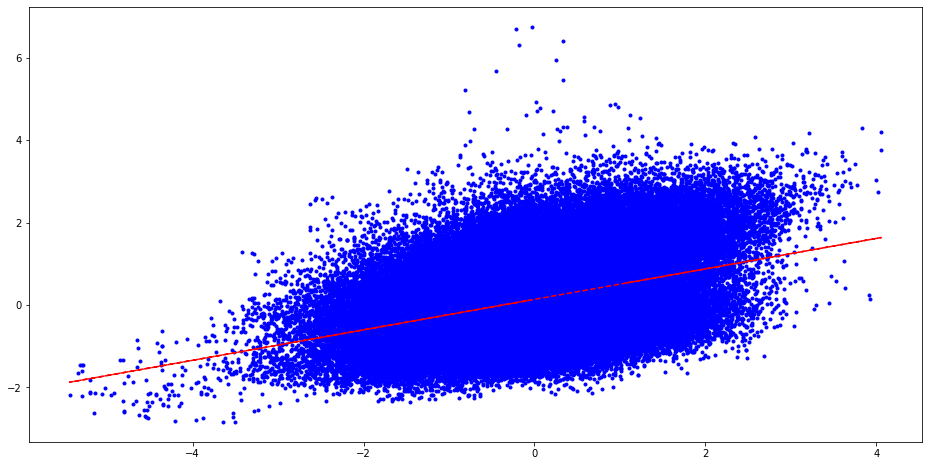

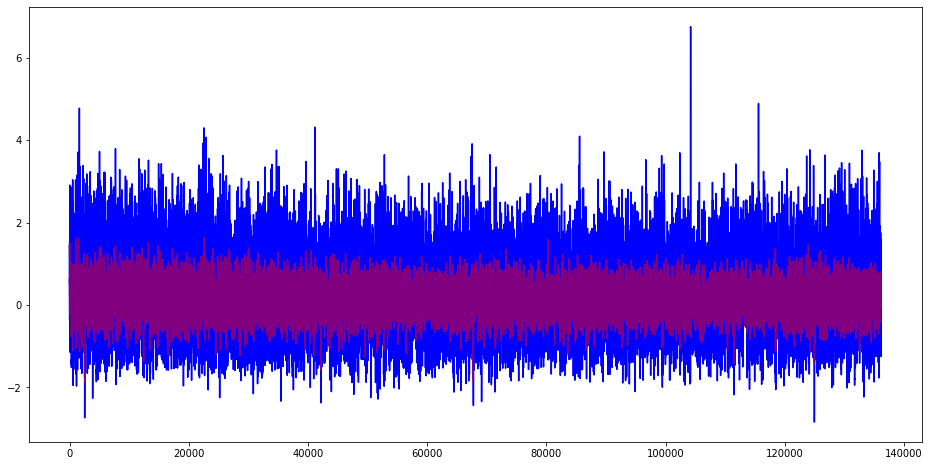

In [201]:
z_reference = (reference - np.median(reference)) / np.std(reference)
z_signal = (signal - np.median(signal)) / np.std(signal)

fig = plt.figure(figsize=(16, 10))
ax1 = fig.add_subplot(211)
ax1.plot(z_signal,'blue',linewidth=1.5)
ax2 = fig.add_subplot(212)
ax2.plot(z_reference,'purple',linewidth=1.5)



from sklearn.linear_model import Lasso
lin = Lasso(alpha=0.0001,precompute=True,max_iter=1000,
            positive=True, random_state=9999, selection='random')
n = len(z_reference)
lin.fit(z_reference.reshape(n,1), z_signal.reshape(n,1))

z_reference_fitted = lin.predict(z_reference.reshape(n,1)).reshape(n,)

fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(111)
ax1.plot(z_reference,z_signal,'b.')
ax1.plot(z_reference,z_reference_fitted, 'r--',linewidth=1.5)




fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(111)
ax1.plot(z_signal,'blue')
ax1.plot(z_reference_fitted,'purple')

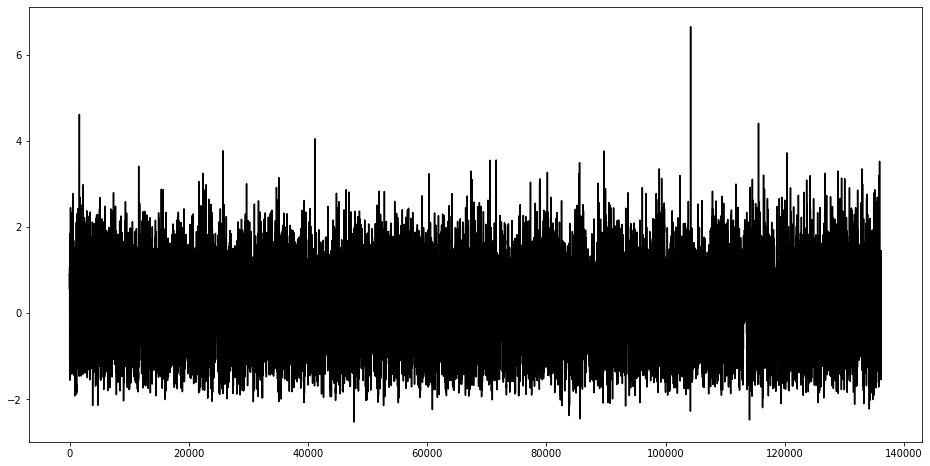

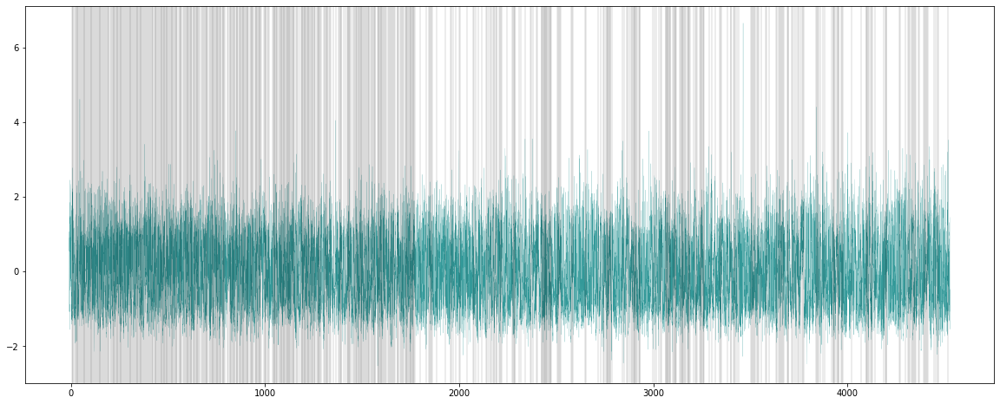

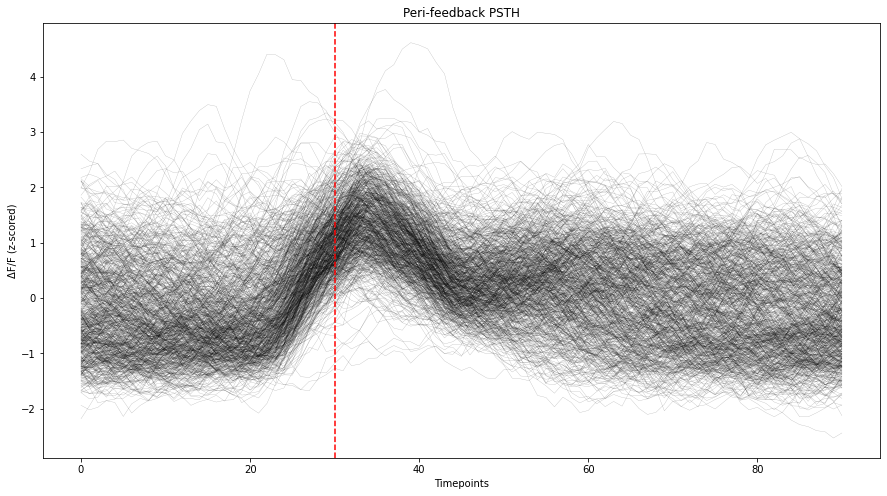

Text(0.5, 0, 'Time (s)')

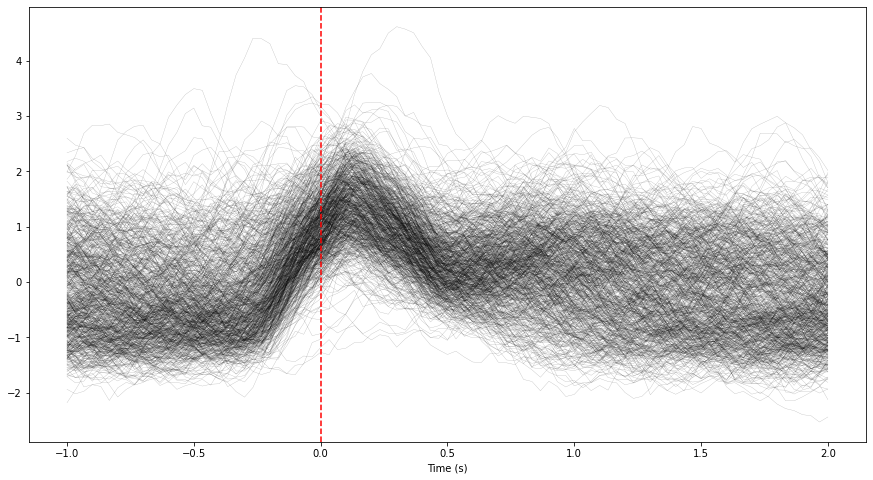

In [202]:
zdFF = (z_signal - z_reference_fitted)



fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(111)
ax1.plot(zdFF,'black')


df_nph['zdFF'] = zdFF
nph = df_nph

fs = 1 / np.median(np.diff(nph.times.values))
fs



plt.figure(figsize=(20, 8))
plt.plot(nph.times, nph.zdFF, c='teal', alpha=0.8, linewidth=0.15)
for i in df_trials.feedback_times: 
    plt.axvline(x=i, linewidth=0.2, color='black', alpha=0.75) 
plt.show() 





behav = df_trials
photometry_feedback, idx_psth = psth(
    calcium=nph.zdFF.values,
    times=nph.times.values,
    t_events=behav["feedback_times"].values,
    fs=fs,
    peri_event_window=[-1, 2]
)



plt.figure(figsize=(15, 8))
plt.plot(photometry_feedback, color='black', linewidth=0.3, alpha=0.3)
plt.axvline(x=photometry_feedback.shape[0] // 3, color='red', linestyle='--')  # Event at t=0
plt.xlabel("Timepoints")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH")
plt.show()


PERIEVENT_WINDOW = [-1, 2]

# time_axis = np.arange(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], 1/fs)
n_timepoints = photometry_feedback.shape[0]
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], n_timepoints)

plt.figure(figsize=(15, 8))
plt.plot(time_axis, photometry_feedback, color='black', linewidth=0.3, alpha=0.3)
plt.axvline(x=0, color='red', linestyle='--')  # Event at 0s
plt.xlabel("Time (s)")

In [203]:
""" SELECT THE EVENT AND WHAT INTERVAL TO PLOT IN THE PSTH """ 
EVENT = "stimOnTrigger_times" 
time_bef = -1
time_aft = 2
PERIEVENT_WINDOW = [time_bef,time_aft]
SAMPLING_RATE = int(1/np.mean(np.diff(df_nph.times))) 

array_timestamps = np.array(df_nph.times) #pick the nph timestamps transformed to bpod clock 
event_test = np.array(df_trials.intervals_0) #pick the intervals_0 timestamps 
idx_event = np.searchsorted(array_timestamps, event_test) #check idx where they would be included, in a sorted way 
""" create a column with the trial number in the nph df """
df_nph["trial_number"] = 0 #create a new column for the trial_number 
df_nph.loc[idx_event,"trial_number"]=1
df_nph["trial_number"] = df_nph.trial_number.cumsum() #sum the [i-1] to i in order to get the trial number 

sample_window = np.arange(PERIEVENT_WINDOW[0] * SAMPLING_RATE, PERIEVENT_WINDOW[1] * SAMPLING_RATE + 1)
n_trials = df_trials.shape[0]

psth_idx = np.tile(sample_window[:,np.newaxis], (1, n_trials)) 

event_times = np.array(df_trials[EVENT]) #pick the feedback timestamps 

event_idx = np.searchsorted(array_timestamps, event_times) #check idx where they would be included, in a sorted way 

psth_idx += event_idx

In [204]:
""" SELECT THE EVENT AND WHAT INTERVAL TO PLOT IN THE PSTH """ 
EVENT = "stimOnTrigger_times" 
time_bef = -1
time_aft = 2
PERIEVENT_WINDOW = [time_bef,time_aft]
SAMPLING_RATE = int(1/np.mean(np.diff(df_nph.times))) 

array_timestamps = np.array(df_nph.times) #pick the nph timestamps transformed to bpod clock 
event_test = np.array(df_trials.intervals_0) #pick the intervals_0 timestamps 
idx_event = np.searchsorted(array_timestamps, event_test) #check idx where they would be included, in a sorted way 
""" create a column with the trial number in the nph df """
df_nph["trial_number"] = 0 #create a new column for the trial_number 
df_nph.loc[idx_event,"trial_number"]=1
df_nph["trial_number"] = df_nph.trial_number.cumsum() #sum the [i-1] to i in order to get the trial number 

sample_window = np.arange(PERIEVENT_WINDOW[0] * SAMPLING_RATE, PERIEVENT_WINDOW[1] * SAMPLING_RATE + 1)
n_trials = df_trials.shape[0]

psth_idx = np.tile(sample_window[:,np.newaxis], (1, n_trials)) 

event_times = np.array(df_trials[EVENT]) #pick the feedback timestamps 

event_idx = np.searchsorted(array_timestamps, event_times) #check idx where they would be included, in a sorted way 

psth_idx += event_idx

plt.figure(figsize=(15, 8))

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

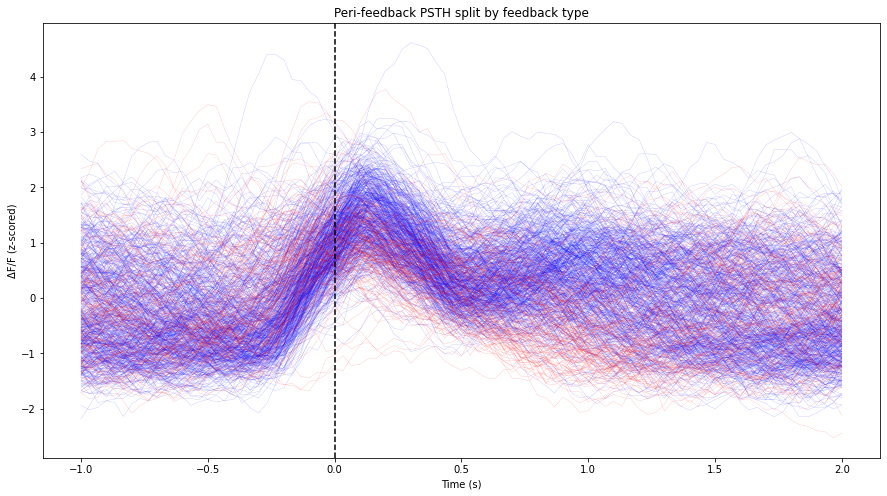

In [205]:
""" SELECT THE EVENT AND WHAT INTERVAL TO PLOT IN THE PSTH """ 
EVENT = "stimOnTrigger_times" 
time_bef = -1
time_aft = 2
PERIEVENT_WINDOW = [time_bef,time_aft]
SAMPLING_RATE = int(1/np.mean(np.diff(df_nph.times))) 

array_timestamps = np.array(df_nph.times) #pick the nph timestamps transformed to bpod clock 
event_test = np.array(df_trials.intervals_0) #pick the intervals_0 timestamps 
idx_event = np.searchsorted(array_timestamps, event_test) #check idx where they would be included, in a sorted way 
""" create a column with the trial number in the nph df """
df_nph["trial_number"] = 0 #create a new column for the trial_number 
df_nph.loc[idx_event,"trial_number"]=1
df_nph["trial_number"] = df_nph.trial_number.cumsum() #sum the [i-1] to i in order to get the trial number 

sample_window = np.arange(PERIEVENT_WINDOW[0] * SAMPLING_RATE, PERIEVENT_WINDOW[1] * SAMPLING_RATE + 1)
n_trials = df_trials.shape[0]

psth_idx = np.tile(sample_window[:,np.newaxis], (1, n_trials)) 

event_times = np.array(df_trials[EVENT]) #pick the feedback timestamps 

event_idx = np.searchsorted(array_timestamps, event_times) #check idx where they would be included, in a sorted way 

psth_idx += event_idx

plt.figure(figsize=(15, 8))

# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='blue', linewidth=0.3, alpha=0.3)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='red', linewidth=0.3, alpha=0.3)

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.show()

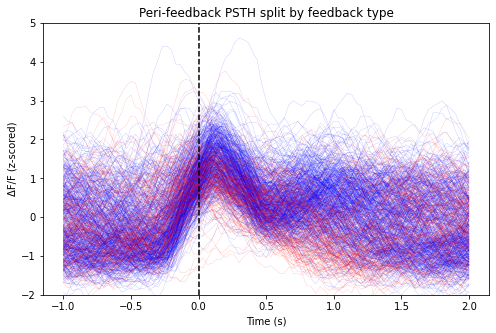

In [206]:
# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='blue', linewidth=0.3, alpha=0.3)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='red', linewidth=0.3, alpha=0.3)

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.ylim(-2,5)
plt.show()

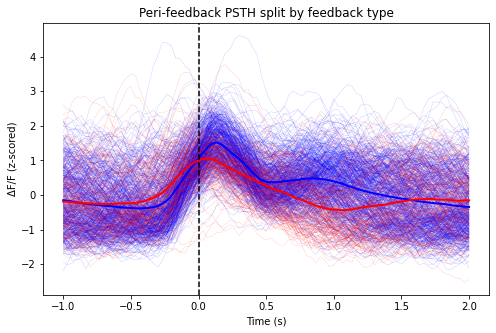

In [207]:
# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='blue', linewidth=0.3, alpha=0.3)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='red', linewidth=0.3, alpha=0.3) 

# --- Mean traces on top ---
mean_correct = np.nanmean(photometry_feedback[:, mask_correct], axis=1)
mean_incorrect = np.nanmean(photometry_feedback[:, mask_incorrect], axis=1)

plt.plot(time_axis, mean_correct, color='blue', linewidth=2, label="Correct (mean)")
plt.plot(time_axis, mean_incorrect, color='red', linewidth=2, label="Incorrect (mean)")

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.show()

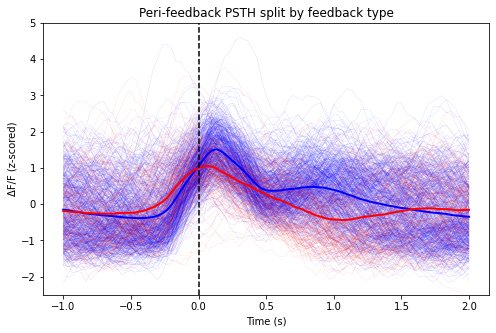

In [208]:
# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='blue', linewidth=0.3, alpha=0.2)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='red', linewidth=0.3, alpha=0.2) 

# --- Mean traces on top ---
mean_correct = np.nanmean(photometry_feedback[:, mask_correct], axis=1)
mean_incorrect = np.nanmean(photometry_feedback[:, mask_incorrect], axis=1)

plt.plot(time_axis, mean_correct, color='blue', linewidth=2, label="Correct (mean)")
plt.plot(time_axis, mean_incorrect, color='red', linewidth=2, label="Incorrect (mean)")

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.ylim(-2.5,5)
plt.show()

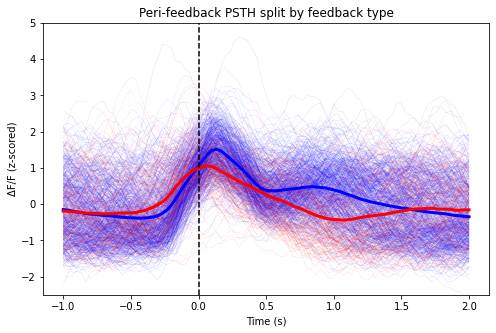

In [209]:
# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='blue', linewidth=0.3, alpha=0.2)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='red', linewidth=0.3, alpha=0.2) 

# --- Mean traces on top ---
mean_correct = np.nanmean(photometry_feedback[:, mask_correct], axis=1)
mean_incorrect = np.nanmean(photometry_feedback[:, mask_incorrect], axis=1)

plt.plot(time_axis, mean_correct, color='blue', linewidth=3, label="Correct (mean)")
plt.plot(time_axis, mean_incorrect, color='red', linewidth=3, label="Incorrect (mean)")

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.ylim(-2.5,5)
plt.show()

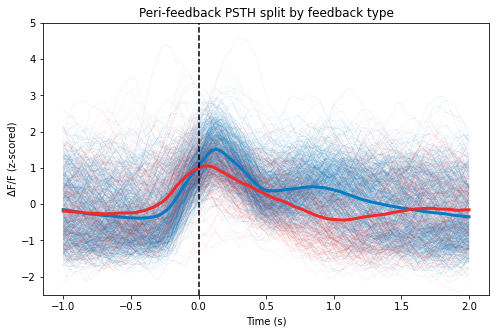

In [210]:
# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='#067bc2', linewidth=0.3, alpha=0.2)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='#ef2b2b', linewidth=0.3, alpha=0.2) 

# --- Mean traces on top ---
mean_correct = np.nanmean(photometry_feedback[:, mask_correct], axis=1)
mean_incorrect = np.nanmean(photometry_feedback[:, mask_incorrect], axis=1)

plt.plot(time_axis, mean_correct, color='#067bc2', linewidth=3, label="Correct (mean)")
plt.plot(time_axis, mean_incorrect, color='#ef2b2b', linewidth=3, label="Incorrect (mean)")

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.ylim(-2.5,5)
plt.show()

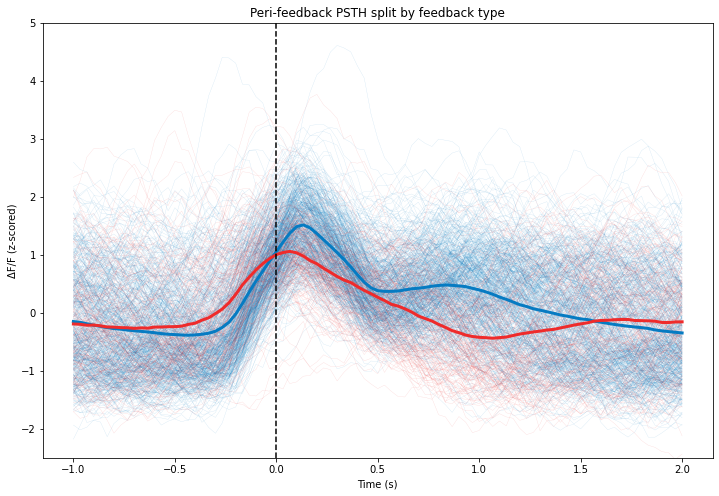

In [211]:
plt.figure(figsize=(12, 8))

# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='#067bc2', linewidth=0.3, alpha=0.2)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='#ef2b2b', linewidth=0.3, alpha=0.2) 

# --- Mean traces on top ---
mean_correct = np.nanmean(photometry_feedback[:, mask_correct], axis=1)
mean_incorrect = np.nanmean(photometry_feedback[:, mask_incorrect], axis=1)

plt.plot(time_axis, mean_correct, color='#067bc2', linewidth=3, label="Correct (mean)")
plt.plot(time_axis, mean_incorrect, color='#ef2b2b', linewidth=3, label="Incorrect (mean)")

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.ylim(-2.5,5)
plt.show()

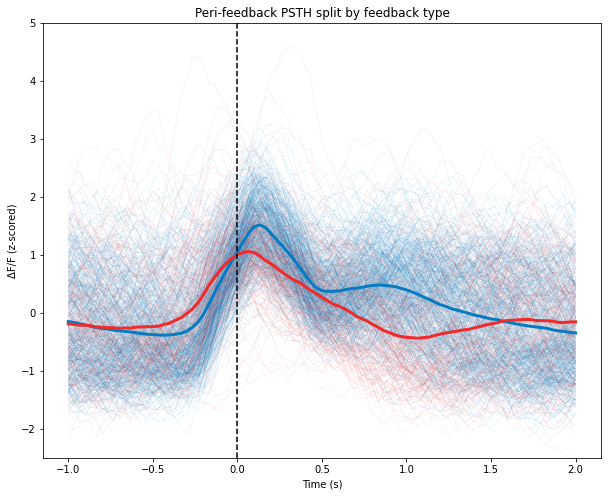

In [212]:
plt.figure(figsize=(10, 8))

# Mask for correct vs incorrect/other
mask_correct = df_trials.feedbackType.values == 1
mask_incorrect = ~mask_correct

# Plot trials separately
plt.plot(time_axis, photometry_feedback[:, mask_correct], color='#067bc2', linewidth=0.3, alpha=0.2)
plt.plot(time_axis, photometry_feedback[:, mask_incorrect], color='#ef2b2b', linewidth=0.3, alpha=0.2) 

# --- Mean traces on top ---
mean_correct = np.nanmean(photometry_feedback[:, mask_correct], axis=1)
mean_incorrect = np.nanmean(photometry_feedback[:, mask_incorrect], axis=1)

plt.plot(time_axis, mean_correct, color='#067bc2', linewidth=3, label="Correct (mean)")
plt.plot(time_axis, mean_incorrect, color='#ef2b2b', linewidth=3, label="Incorrect (mean)")

# Event marker
plt.axvline(x=0, color='black', linestyle='--')

plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Peri-feedback PSTH split by feedback type")
plt.ylim(-2.5,5)
plt.show()

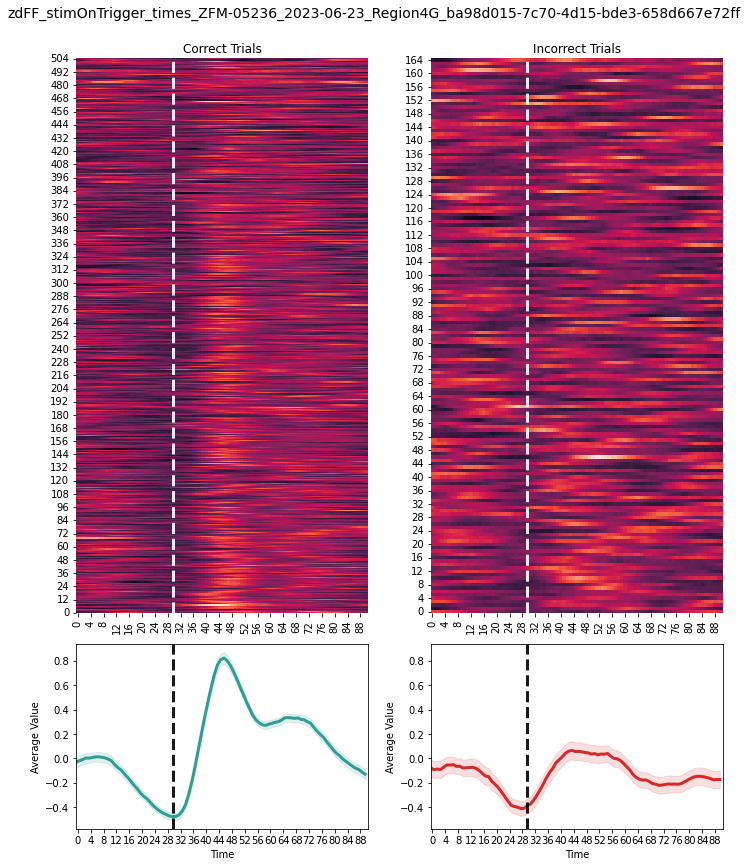

ZFM-05236 2023-06-23 Region4G
ba98d015-7c70-4d15-bde3-658d667e72ff
Len TTL:  670 Len tbpod:  670 Len trials:  670


In [213]:
def plot_heatmap_psth(preprocessingtype=df_nph.zdFF): 
    psth_good = preprocessingtype.values[psth_idx[:,(df_trials.feedbackType == 1)]]
    psth_error = preprocessingtype.values[psth_idx[:,(df_trials.feedbackType == -1)]]
    # Calculate averages and SEM
    psth_good_avg = psth_good.mean(axis=1)
    sem_good = psth_good.std(axis=1) / np.sqrt(psth_good.shape[1])
    psth_error_avg = psth_error.mean(axis=1)
    sem_error = psth_error.std(axis=1) / np.sqrt(psth_error.shape[1])

    # Create the figure and gridspec
    fig = plt.figure(figsize=(10, 12))
    gs = fig.add_gridspec(2, 2, height_ratios=[3, 1])

    # Plot the heatmap and line plot for correct trials
    ax1 = fig.add_subplot(gs[0, 0])
    sns.heatmap(psth_good.T, cbar=False, ax=ax1) #, center = 0.0)
    ax1.invert_yaxis()
    ax1.axvline(x=30, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax1.set_title('Correct Trials')

    ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
    ax2.plot(psth_good_avg, color='#2f9c95', linewidth=3) 
    # ax2.plot(psth_good, color='#2f9c95', linewidth=0.1, alpha=0.2)
    ax2.fill_between(range(len(psth_good_avg)), psth_good_avg - sem_good, psth_good_avg + sem_good, color='#2f9c95', alpha=0.15)
    ax2.axvline(x=30, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax2.set_ylabel('Average Value')
    ax2.set_xlabel('Time')

    # Plot the heatmap and line plot for incorrect trials
    ax3 = fig.add_subplot(gs[0, 1], sharex=ax1)
    sns.heatmap(psth_error.T, cbar=False, ax=ax3) #, center = 0.0)
    ax3.invert_yaxis()
    ax3.axvline(x=30, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax3.set_title('Incorrect Trials')

    ax4 = fig.add_subplot(gs[1, 1], sharex=ax3, sharey=ax2)
    ax4.plot(psth_error_avg, color='#d62828', linewidth=3)
    ax4.fill_between(range(len(psth_error_avg)), psth_error_avg - sem_error, psth_error_avg + sem_error, color='#d62828', alpha=0.15)
    ax4.axvline(x=30, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax4.set_ylabel('Average Value')
    ax4.set_xlabel('Time')

    fig.suptitle(f'zdFF_{EVENT}_{subject}_{session_date}_{region}_{eid}', y=1, fontsize=14)
    plt.tight_layout()
    # plt.savefig(f'/mnt/h0/kb/data/psth_npy/Fig02_{EVENT}_{mouse}_{date}_{region}_{eid}.png')
    plt.show() 

plot_heatmap_psth(df_nph.zdFF)


print(subject, date, region)
print(eid)
print("Len TTL: ", len(tph), "Len tbpod: ", len(tbpod), "Len trials: ", len(df_trials))

In [214]:
""" 
to sort by: reactionTimes 
""" 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def plot_heatmap_psth_sorted_by_rt(preprocessingtype=df_nph.zdFF):
    # Boolean masks
    mask_correct = df_trials.feedbackType == 1
    mask_incorrect = df_trials.feedbackType == -1

    # PSTHs (n_timepoints × n_trials)
    psth_good = preprocessingtype.values[psth_idx[:, mask_correct]]
    psth_error = preprocessingtype.values[psth_idx[:, mask_incorrect]]

    # Reaction times and sort indices
    reaction_times_correct = df_trials.loc[mask_correct, 'reactionTime'].values
    sort_idx_correct = np.argsort(reaction_times_correct)
    psth_good_sorted = psth_good.T[sort_idx_correct]  # transpose → trials × time
    reaction_times_correct_sorted = reaction_times_correct[sort_idx_correct]

    reaction_times_incorrect = df_trials.loc[mask_incorrect, 'reactionTime'].values
    sort_idx_incorrect = np.argsort(reaction_times_incorrect)
    psth_error_sorted = psth_error.T[sort_idx_incorrect]
    reaction_times_incorrect_sorted = reaction_times_incorrect[sort_idx_incorrect]

    # Round for tick display
    rt_correct_rounded = np.round(reaction_times_correct_sorted, 2)
    rt_incorrect_rounded = np.round(reaction_times_incorrect_sorted, 2)

    # Average and SEM
    psth_good_avg = psth_good.mean(axis=1)
    sem_good = psth_good.std(axis=1) / np.sqrt(psth_good.shape[1])
    psth_error_avg = psth_error.mean(axis=1)
    sem_error = psth_error.std(axis=1) / np.sqrt(psth_error.shape[1])

    # Plot
    fig = plt.figure(figsize=(10, 12))
    gs = fig.add_gridspec(2, 2, height_ratios=[3, 1])

    # === Correct trials heatmap ===
    ax1 = fig.add_subplot(gs[0, 0])
    sns.heatmap(psth_good_sorted, cbar=False, ax=ax1)
    ax1.invert_yaxis()
    ax1.axvline(x=30, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax1.set_title('Correct Trials (sorted by RT)')

    # Set y-ticks with RT labels
    step = 5  # label every 5th trial
    tick_locs = np.arange(0, len(rt_correct_rounded), step)
    ax1.set_yticks(tick_locs + 0.5)
    ax1.set_yticklabels(rt_correct_rounded[tick_locs])
    ax1.set_ylabel("Reaction time (s)")

    # === Correct average plot ===
    ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
    ax2.plot(psth_good_avg, color='#2f9c95', linewidth=3)
    ax2.fill_between(range(len(psth_good_avg)), psth_good_avg - sem_good, psth_good_avg + sem_good, color='#2f9c95', alpha=0.15)
    ax2.axvline(x=30, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax2.set_ylabel('Average Value')
    ax2.set_xlabel('Time')

    # === Incorrect trials heatmap ===
    ax3 = fig.add_subplot(gs[0, 1], sharex=ax1)
    sns.heatmap(psth_error_sorted, cbar=False, ax=ax3)
    ax3.invert_yaxis()
    ax3.axvline(x=30, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax3.set_title('Incorrect Trials (sorted by RT)')

    tick_locs_err = np.arange(0, len(rt_incorrect_rounded), step)
    ax3.set_yticks(tick_locs_err + 0.5)
    ax3.set_yticklabels(rt_incorrect_rounded[tick_locs_err])
    ax3.set_ylabel("Reaction time (s)")

    # === Incorrect average plot ===
    ax4 = fig.add_subplot(gs[1, 1], sharex=ax3, sharey=ax2)
    ax4.plot(psth_error_avg, color='#d62828', linewidth=3)
    ax4.fill_between(range(len(psth_error_avg)), psth_error_avg - sem_error, psth_error_avg + sem_error, color='#d62828', alpha=0.15)
    ax4.axvline(x=30, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax4.set_ylabel('Average Value')
    ax4.set_xlabel('Time')

    fig.suptitle(f'zdFF_sortedByRT_{EVENT}_{subject}_{session_date}_{region}_{eid}', y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()

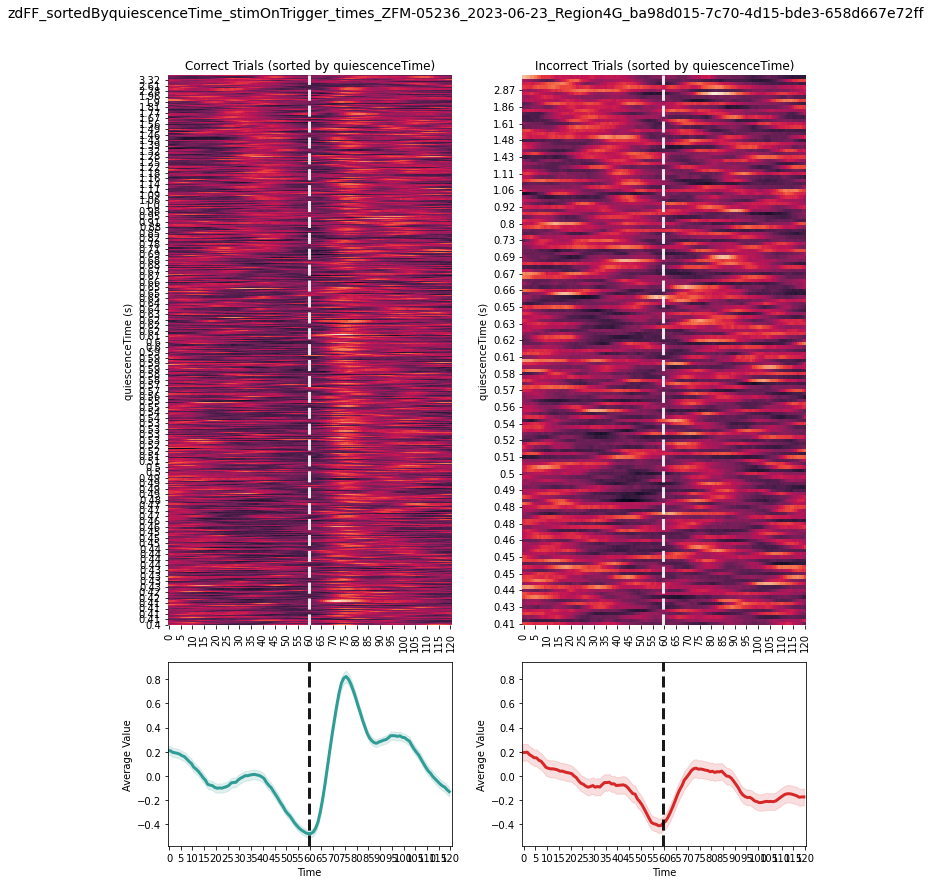

In [215]:
"""
Plot the same, but all the code to choose the event and plot the heatmap 
to change: 
EVENT
responseTime
""" 
""" SELECT THE EVENT AND WHAT INTERVAL TO PLOT IN THE PSTH """ 
EVENT = "stimOnTrigger_times" 
time_bef = -2
time_aft = 2
PERIEVENT_WINDOW = [time_bef,time_aft]
SAMPLING_RATE = int(1/np.mean(np.diff(df_nph.times))) 

array_timestamps = np.array(df_nph.times) #pick the nph timestamps transformed to bpod clock 
event_test = np.array(df_trials.intervals_0) #pick the intervals_0 timestamps 
idx_event = np.searchsorted(array_timestamps, event_test) #check idx where they would be included, in a sorted way 
""" create a column with the trial number in the nph df """
df_nph["trial_number"] = 0 #create a new column for the trial_number 
df_nph.loc[idx_event,"trial_number"]=1
df_nph["trial_number"] = df_nph.trial_number.cumsum() #sum the [i-1] to i in order to get the trial number 

sample_window = np.arange(PERIEVENT_WINDOW[0] * SAMPLING_RATE, PERIEVENT_WINDOW[1] * SAMPLING_RATE + 1)
n_trials = df_trials.shape[0]

psth_idx = np.tile(sample_window[:,np.newaxis], (1, n_trials)) 

event_times = np.array(df_trials[EVENT]) #pick the feedback timestamps 

event_idx = np.searchsorted(array_timestamps, event_times) #check idx where they would be included, in a sorted way 

psth_idx += event_idx


import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def plot_heatmap_psth_sorted_by_rt(preprocessingtype=df_nph.zdFF, column_sort='reactionTime'):
    # Boolean masks
    mask_correct = df_trials.feedbackType == 1
    mask_incorrect = df_trials.feedbackType == -1

    # PSTHs (n_timepoints × n_trials)
    psth_good = preprocessingtype.values[psth_idx[:, mask_correct]]
    psth_error = preprocessingtype.values[psth_idx[:, mask_incorrect]]

    # Reaction times and sort indices
    reaction_times_correct = df_trials.loc[mask_correct, column_sort].values
    sort_idx_correct = np.argsort(reaction_times_correct)
    psth_good_sorted = psth_good.T[sort_idx_correct]  # transpose → trials × time
    reaction_times_correct_sorted = reaction_times_correct[sort_idx_correct]

    reaction_times_incorrect = df_trials.loc[mask_incorrect, column_sort].values
    sort_idx_incorrect = np.argsort(reaction_times_incorrect)
    psth_error_sorted = psth_error.T[sort_idx_incorrect]
    reaction_times_incorrect_sorted = reaction_times_incorrect[sort_idx_incorrect]

    # Round for tick display
    rt_correct_rounded = np.round(reaction_times_correct_sorted, 2)
    rt_incorrect_rounded = np.round(reaction_times_incorrect_sorted, 2)

    # Average and SEM
    psth_good_avg = psth_good.mean(axis=1)
    sem_good = psth_good.std(axis=1) / np.sqrt(psth_good.shape[1])
    psth_error_avg = psth_error.mean(axis=1)
    sem_error = psth_error.std(axis=1) / np.sqrt(psth_error.shape[1])

    # Plot
    fig = plt.figure(figsize=(10, 12))
    gs = fig.add_gridspec(2, 2, height_ratios=[3, 1])

    # === Correct trials heatmap ===
    ax1 = fig.add_subplot(gs[0, 0])
    sns.heatmap(psth_good_sorted, cbar=False, ax=ax1)
    ax1.invert_yaxis()
    ax1.axvline(x=60, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax1.set_title(f'Correct Trials (sorted by {column_sort})')

    # Set y-ticks with RT labels
    step = 5  # label every 5th trial
    tick_locs = np.arange(0, len(rt_correct_rounded), step)
    ax1.set_yticks(tick_locs + 0.5)
    ax1.set_yticklabels(rt_correct_rounded[tick_locs])
    ax1.set_ylabel(f"{column_sort} (s)")

    # === Correct average plot ===
    ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
    ax2.plot(psth_good_avg, color='#2f9c95', linewidth=3)
    ax2.fill_between(range(len(psth_good_avg)), psth_good_avg - sem_good, psth_good_avg + sem_good, color='#2f9c95', alpha=0.15)
    ax2.axvline(x=60, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax2.set_ylabel('Average Value')
    ax2.set_xlabel('Time')

    # === Incorrect trials heatmap ===
    ax3 = fig.add_subplot(gs[0, 1], sharex=ax1)
    sns.heatmap(psth_error_sorted, cbar=False, ax=ax3)
    ax3.invert_yaxis()
    ax3.axvline(x=60, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax3.set_title(f'Incorrect Trials (sorted by {column_sort})')

    tick_locs_err = np.arange(0, len(rt_incorrect_rounded), step)
    ax3.set_yticks(tick_locs_err + 0.5)
    ax3.set_yticklabels(rt_incorrect_rounded[tick_locs_err])
    ax3.set_ylabel(f"{column_sort} (s)")

    # === Incorrect average plot ===
    ax4 = fig.add_subplot(gs[1, 1], sharex=ax3, sharey=ax2)
    ax4.plot(psth_error_avg, color='#d62828', linewidth=3)
    ax4.fill_between(range(len(psth_error_avg)), psth_error_avg - sem_error, psth_error_avg + sem_error, color='#d62828', alpha=0.15)
    ax4.axvline(x=60, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax4.set_ylabel('Average Value')
    ax4.set_xlabel('Time')

    fig.suptitle(f'zdFF_sortedBy{column_sort}_{EVENT}_{subject}_{session_date}_{region}_{eid}', y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()

plot_heatmap_psth_sorted_by_rt(df_nph.zdFF, column_sort='quiescenceTime')

Model coefficients:
 quiescenceTime         0.132613
consecutive_correct   -0.036347
reactionTime           0.030142
prev_trialTime         0.020629
prev_quiescenceTime   -0.016233
correct               -0.007360
dtype: float64


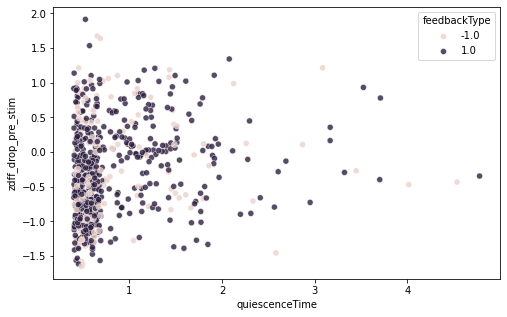

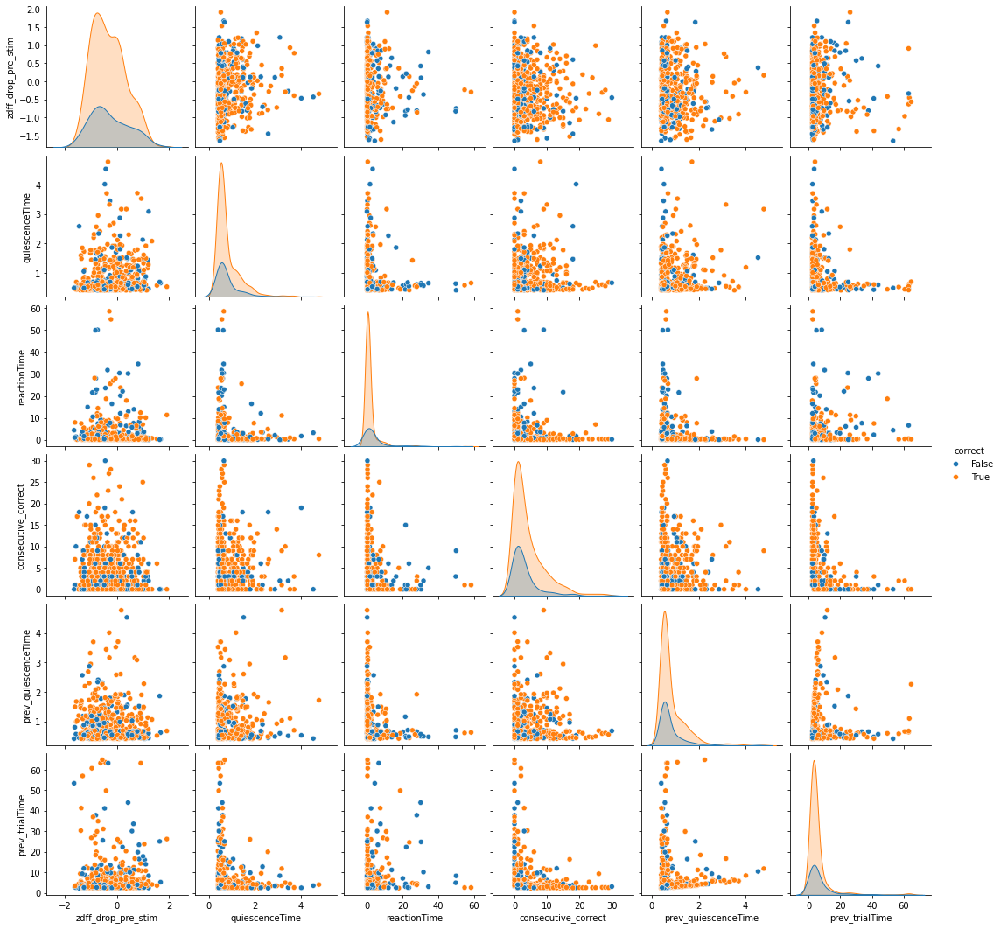

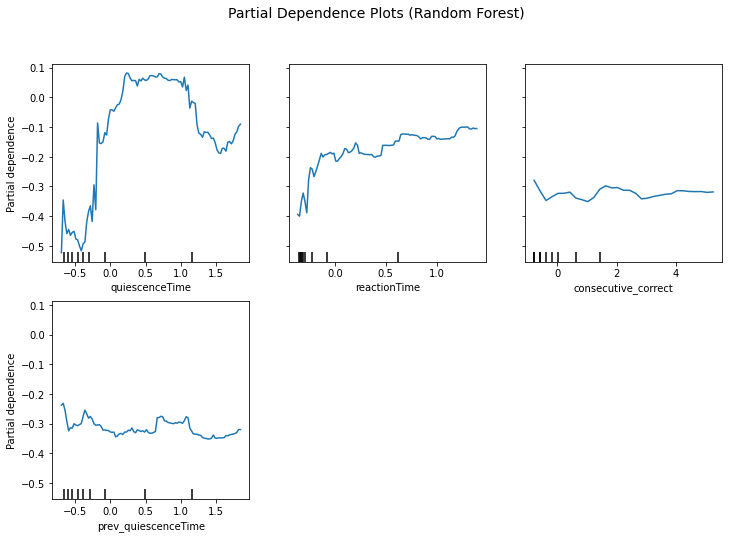

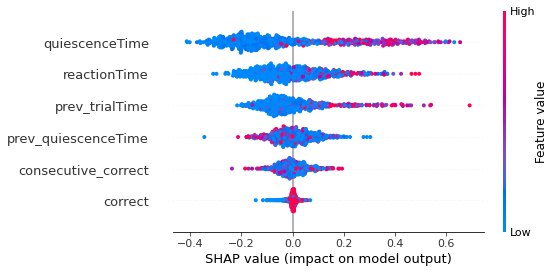

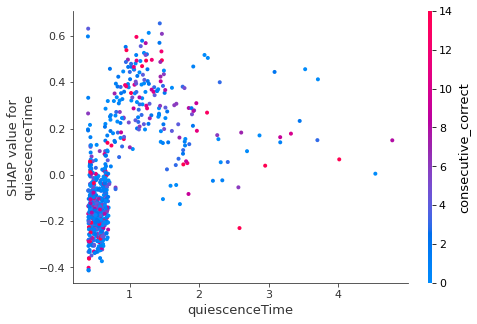

In [216]:
"""
prediction for the vars that would better explain the drop in the 5-HT activity before the stimOnTrigger_times 
"""
# Define window before stim (e.g., -0.5s to 0s)
pre_window = [-0.5, 0]  # in seconds

# Create empty list for signal drops
zdff_drops = []

for _, trial in df_trials.iterrows():
   stim_time = trial['stimOnTrigger_times']
  
   # Define time window for this trial
   start = stim_time + pre_window[0]
   end = stim_time + pre_window[1]

   # Mask for that time window
   mask = (df_nph['times'] >= start) & (df_nph['times'] < end)

   # Extract zdFF segment
   segment = df_nph.loc[mask, 'zdFF']

   # Measure "drop" — e.g., min value or average
   drop = segment.mean() if not segment.empty else np.nan
   zdff_drops.append(drop)

# Add to df_trials
df_trials['zdff_drop_pre_stim'] = zdff_drops

df_trials['correct'] = df_trials['feedbackType'] == 1
# df_trials['consecutive_correct'] = df_trials['correct'].astype(int).rolling(window=2).sum().fillna(0)

# Counter for consecutive corrects before current trial
consec = []
count = 0
for c in df_trials['correct']:
    consec.append(count)  # store count BEFORE updating
    if c:
        count += 1
    else:
        count = 0

df_trials['consecutive_correct'] = consec

# Add previous trial's quiescence time
df_trials['prev_quiescenceTime'] = df_trials['quiescenceTime'].shift(1)

# Add previous trial's full trial time
df_trials['prev_trialTime'] = df_trials['trialTime'].shift(1)

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Choose predictors
X = df_trials[['quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime']]
X = X.fillna(0)  # handle NaNs

# Add correctness as binary
X['correct'] = (df_trials['feedbackType'] == 1).astype(int)

# Target
y = df_trials['zdff_drop_pre_stim']

# Drop NaNs
mask = y.notna()
X = X[mask]
y = y[mask]

# Scale X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit model
model = LinearRegression()
model.fit(X_scaled, y)

# Print coefficients
coeffs = pd.Series(model.coef_, index=X.columns)
print("Model coefficients:\n", coeffs.sort_values(key=abs, ascending=False))

import seaborn as sns
sns.scatterplot(data=df_trials, x='quiescenceTime', y='zdff_drop_pre_stim', hue='feedbackType', alpha=0.8)

sns.pairplot(df_trials, vars=['zdff_drop_pre_stim', 'quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime'], hue='correct')


from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Fit Random Forest again
rf = RandomForestRegressor(random_state=42, n_estimators=300)
rf.fit(X_scaled, y)

# Plot PDP for all features
fig, ax = plt.subplots(figsize=(12, 8))
PartialDependenceDisplay.from_estimator(rf, X_scaled, [0, 1, 2, 3],
                                        feature_names=X.columns, ax=ax)
plt.suptitle("Partial Dependence Plots (Random Forest)", fontsize=14)
plt.show()


import shap

# Create SHAP explainer
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_scaled)

# Summary plot (global importance + direction of effect)
shap.summary_plot(shap_values, X, feature_names=X.columns)

# Dependence plot (feature vs its SHAP value)
shap.dependence_plot("quiescenceTime", shap_values, X, feature_names=X.columns)

In [217]:
# """
# 20August2025
# more features 
# """ 
# # %%
# """
# Pipeline to predict zdFF drop before stimOnTrigger_times
# with multiple models and extended feature set (A–D).
# """

# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

# from sklearn.model_selection import train_test_split, cross_val_score
# from sklearn.preprocessing import StandardScaler
# from sklearn.linear_model import LinearRegression, LassoCV, ElasticNetCV
# from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
# from sklearn.svm import SVR
# from sklearn.metrics import mean_squared_error, r2_score

# # ==========================================================
# # 1. FEATURE ENGINEERING
# # ==========================================================

# # ---- Current trial (A)
# df_trials['quiescencePeriod'] = df_trials['quiescencePeriod']
# df_trials['quiescenceTime']   = df_trials['quiescenceTime']
# df_trials['trialTime']        = df_trials['trialTime']

# # ---- Previous trial (B)
# shift_cols = [
#     'quiescenceTime', 'trialTime', 'feedbackType', 'choice',
#     'allContrasts', 'allSContrasts', 'reactionTime',
#     'probabilityLeft', 'responseTime', 'zdff_drop_pre_stim'
# ]
# for col in shift_cols:
#     df_trials[f'prev_{col}'] = df_trials[col].shift(1)

# # ---- Sequential (C)
# df_trials['correct'] = (df_trials['feedbackType'] == 1).astype(int)

# # Consecutive correct
# consec_corr, count = [], 0
# for c in df_trials['correct']:
#     consec_corr.append(count)
#     count = count + 1 if c else 0
# df_trials['consecutive_correct'] = consec_corr

# # Consecutive incorrect
# consec_inc, count = [], 0
# for c in df_trials['correct']:
#     consec_inc.append(count)
#     count = count + 1 if not c else 0
# df_trials['consecutive_incorrect'] = consec_inc

# # ---- Interactions (D)
# df_trials['interaction_quiescence_correct'] = df_trials['quiescenceTime'] * df_trials['correct']
# df_trials['interaction_reaction_correct'] = df_trials['reactionTime'] * df_trials['correct']
# df_trials['interaction_prev_trialTime_quiescenceTime'] = df_trials['prev_trialTime'] * df_trials['quiescenceTime']
# df_trials['interaction_prev_feedbackType_quiescenceTime'] = df_trials['prev_feedbackType'] * df_trials['quiescenceTime']

# # ==========================================================
# # 2. DEFINE PREDICTORS + TARGET
# # ==========================================================

# # Collect all engineered features (exclude target + IDs)
# exclude_cols = ['zdff_drop_pre_stim', 'stimOnTrigger_times', 'subject', 'date','eid']
# feature_cols = [c for c in df_trials.columns if c not in exclude_cols]

# X = df_trials[feature_cols].fillna(0)
# y = df_trials['zdff_drop_pre_stim']

# # Drop NaNs in target
# mask = y.notna()
# X = X[mask]
# y = y[mask]

# # Train-test split
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Standardize for models that need scaling
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# # ==========================================================
# # 3. TRAIN MULTIPLE MODELS
# # ==========================================================

# models = {
#     "LinearRegression": LinearRegression(),
#     "LassoCV": LassoCV(cv=5, random_state=42),
#     "ElasticNetCV": ElasticNetCV(cv=5, random_state=42),
#     "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42),
#     "GradientBoosting": GradientBoostingRegressor(n_estimators=300, random_state=42),
#     "SVR": SVR(kernel='rbf', C=1.0, epsilon=0.1)
# }

# results = {}

# for name, model in models.items():
#     if name in ["LinearRegression", "LassoCV", "ElasticNetCV", "SVR"]:
#         model.fit(X_train_scaled, y_train)
#         y_pred = model.predict(X_test_scaled)
#     else:
#         model.fit(X_train, y_train)
#         y_pred = model.predict(X_test)
    
#     r2 = r2_score(y_test, y_pred)
#     rmse = mean_squared_error(y_test, y_pred, squared=False)
#     results[name] = {"R2": r2, "RMSE": rmse}
#     print(f"=== {name} ===")
#     print(f"R²: {r2:.3f} | RMSE: {rmse:.3f}")
#     print()

# # ==========================================================
# # 4. FEATURE IMPORTANCES / COEFFICIENTS
# # ==========================================================

# # Linear models: coefficients
# for name in ["LinearRegression", "LassoCV", "ElasticNetCV"]:
#     model = models[name]
#     if hasattr(model, "coef_"):
#         coeffs = pd.Series(model.coef_, index=X.columns)
#         print(f"\n{name} coefficients (top 10):")
#         print(coeffs.reindex(coeffs.abs().sort_values(ascending=False).index)[:10])

# # Tree models: feature importances
# for name in ["RandomForest", "GradientBoosting"]:
#     model = models[name]
#     importances = pd.Series(model.feature_importances_, index=X.columns)
#     importances = importances.sort_values(ascending=False)[:15]
#     plt.figure(figsize=(8,6))
#     importances.plot(kind='barh')
#     plt.title(f"{name} - Top 15 Feature Importances")
#     plt.gca().invert_yaxis()
#     plt.show()

In [218]:
"""
20-August-2025
""" 

'\n20-August-2025\n'


==================== Target: Mean ====================
=== LinearRegression ===
R²: -0.110 | RMSE: 0.6963 | MAE: 0.5568

=== LassoCV ===
R²: -0.046 | RMSE: 0.6757 | MAE: 0.5414

=== ElasticNetCV ===
R²: -0.044 | RMSE: 0.6752 | MAE: 0.5413

=== SVR ===
R²: -0.031 | RMSE: 0.6708 | MAE: 0.5336



/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.309e-02, tolerance: 2.030e-02
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.022e-01, tolerance: 2.030e-02
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increas

=== RandomForest ===
R²: 0.097 | RMSE: 0.6279 | MAE: 0.5040



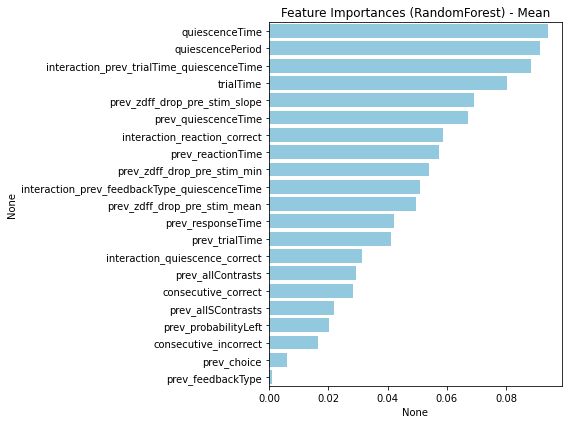

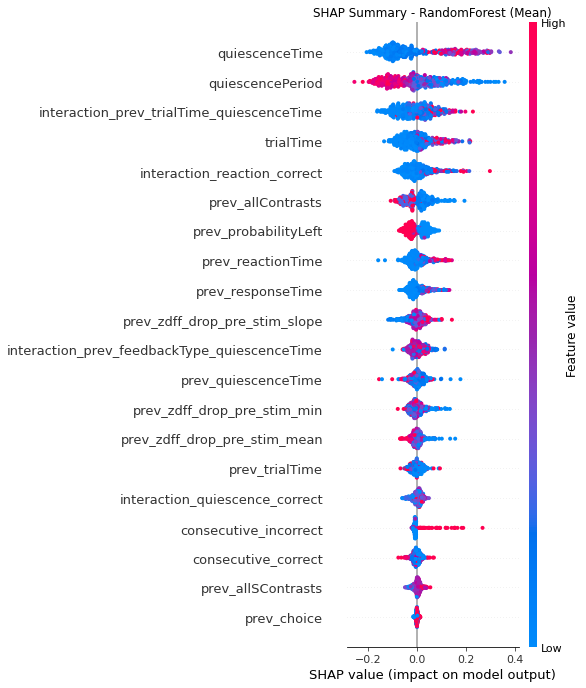

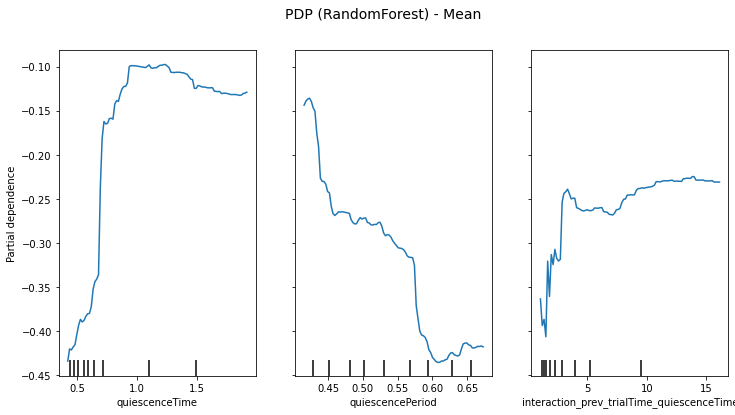

=== GradientBoosting ===
R²: 0.035 | RMSE: 0.6492 | MAE: 0.5175



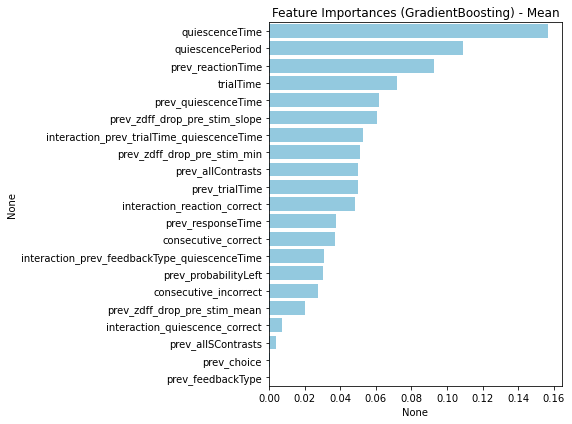

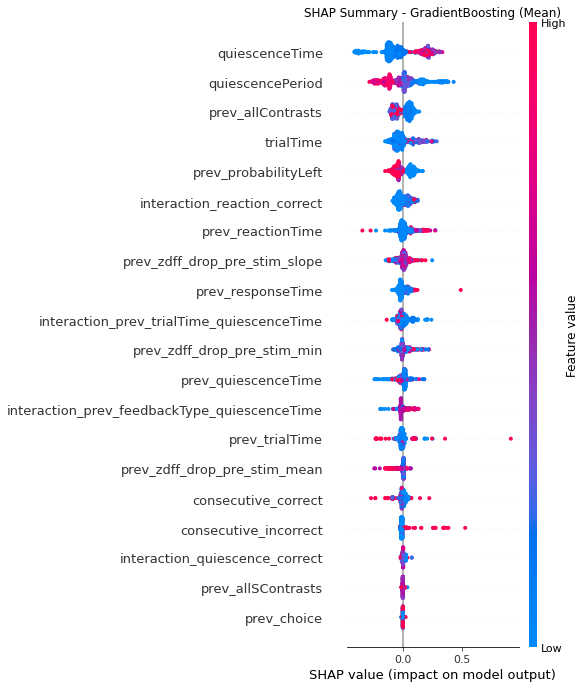

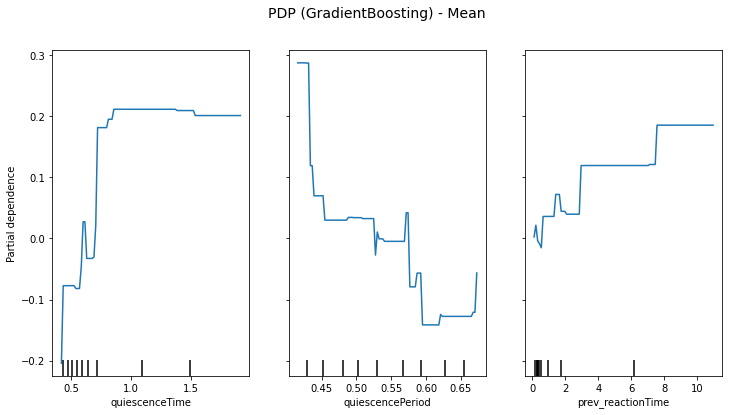

=== XGBoost ===
R²: -0.030 | RMSE: 0.6706 | MAE: 0.5323



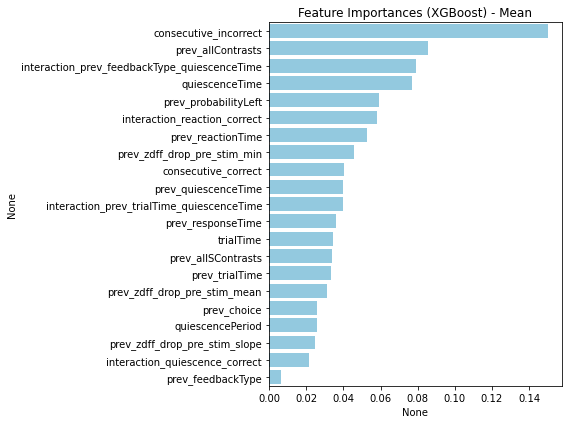

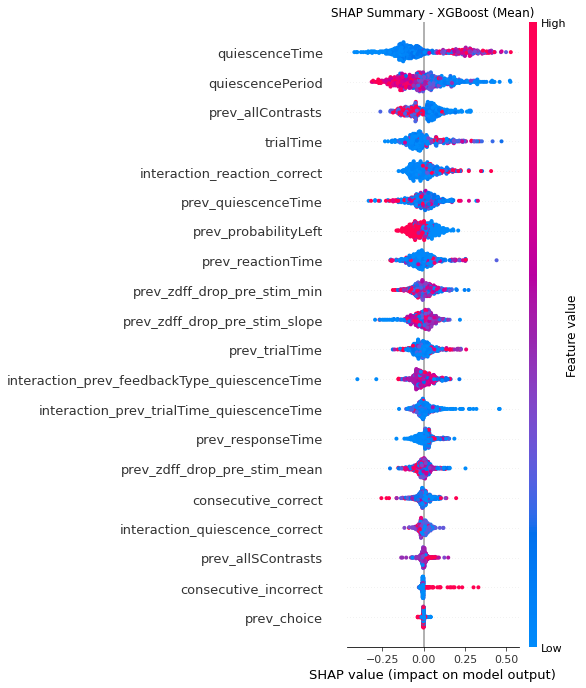

/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 16 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


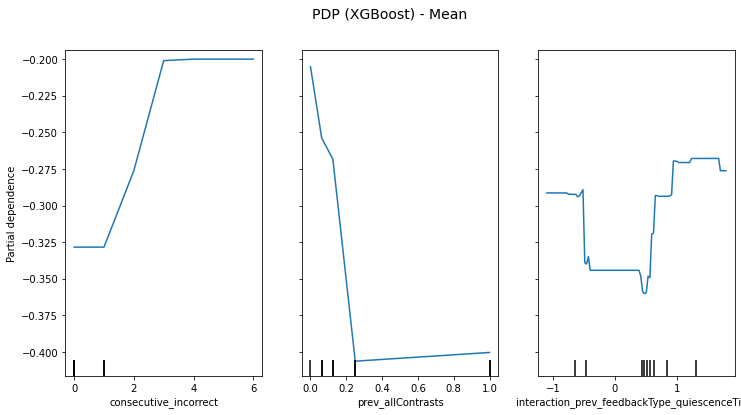

=== NeuralNet ===
R²: -0.561 | RMSE: 0.8254 | MAE: 0.6620


==================== Target: Min ====================
=== LinearRegression ===
R²: -0.117 | RMSE: 0.6089 | MAE: 0.4804

=== LassoCV ===
R²: -0.040 | RMSE: 0.5875 | MAE: 0.4635

=== ElasticNetCV ===
R²: -0.039 | RMSE: 0.5872 | MAE: 0.4632

=== SVR ===
R²: -0.107 | RMSE: 0.6062 | MAE: 0.4809



/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.905e-02, tolerance: 1.745e-02
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.712e-02, tolerance: 1.745e-02
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increas

=== RandomForest ===
R²: 0.045 | RMSE: 0.5628 | MAE: 0.4531



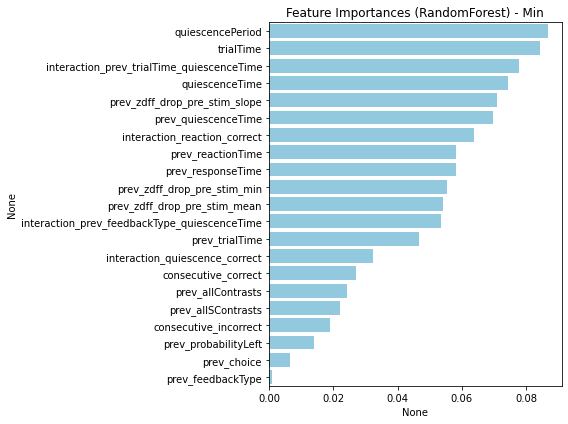

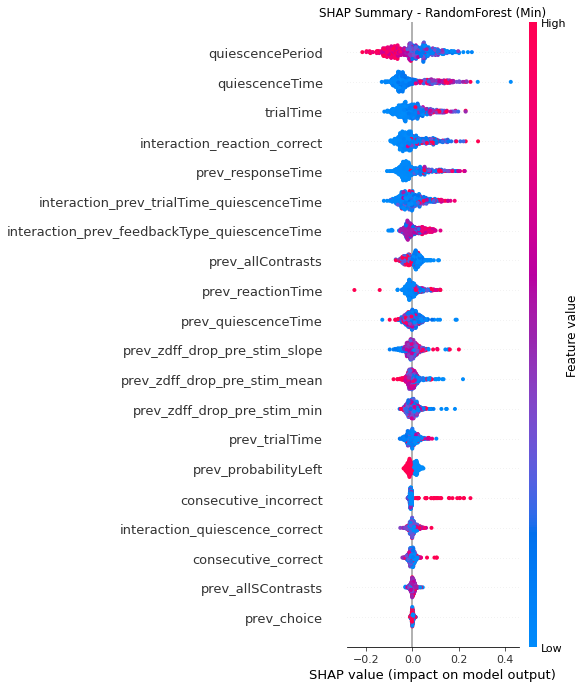

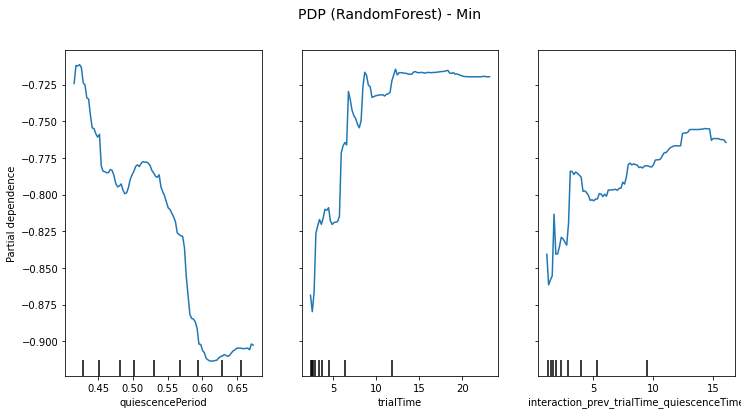

=== GradientBoosting ===
R²: -0.111 | RMSE: 0.6073 | MAE: 0.4919



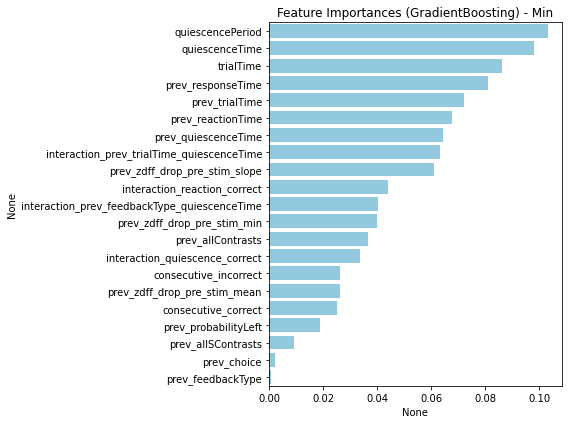

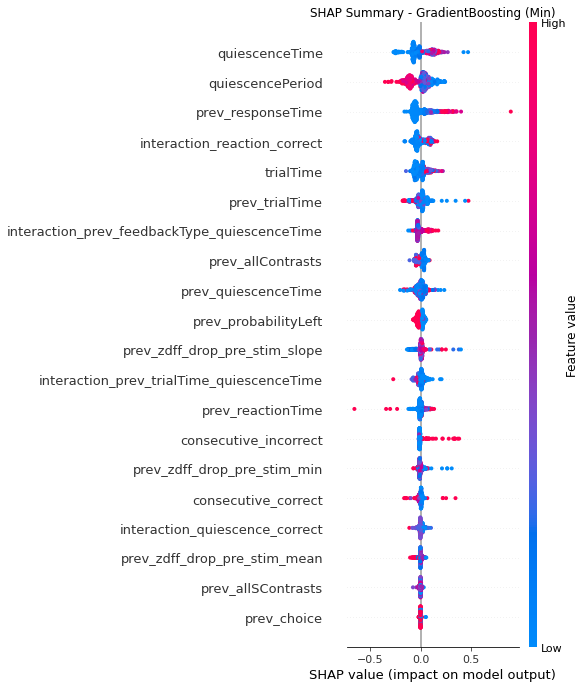

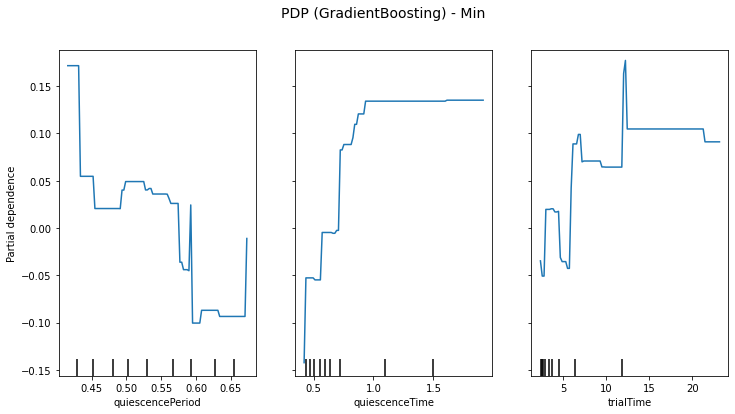

=== XGBoost ===
R²: -0.256 | RMSE: 0.6456 | MAE: 0.5251



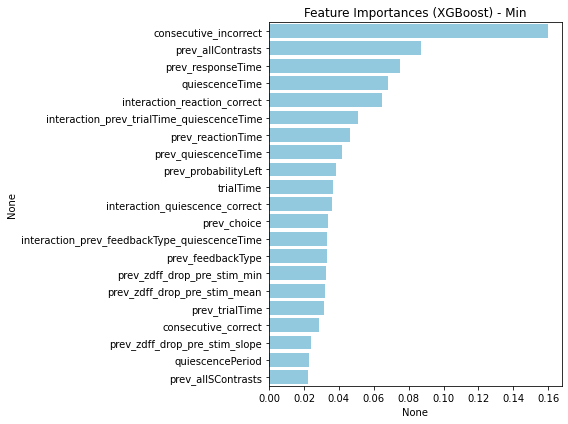

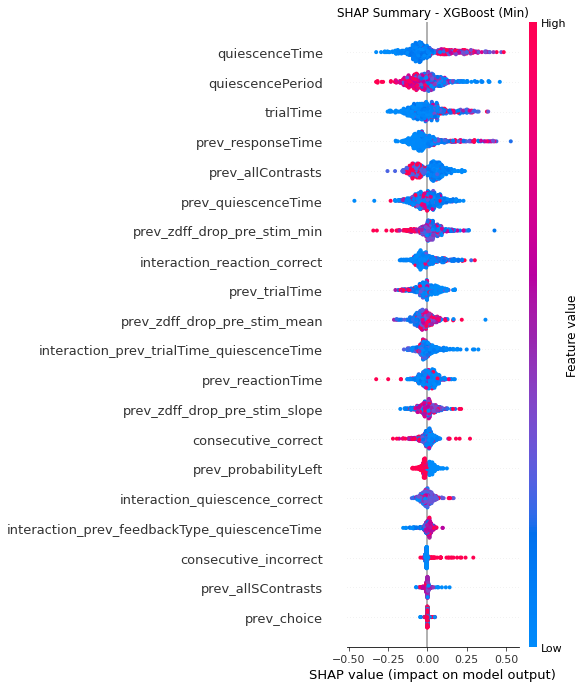

/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 16 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


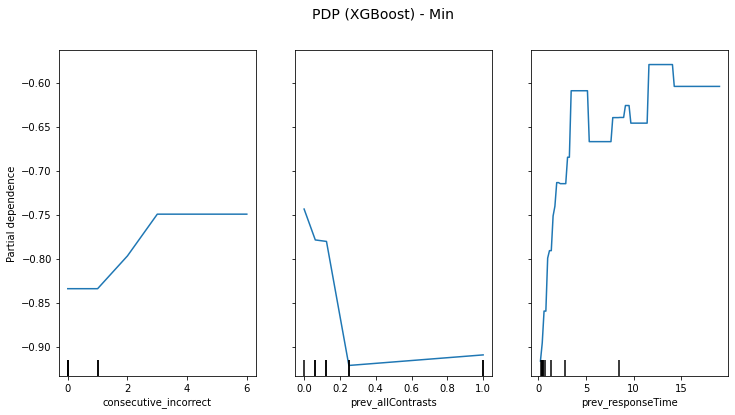

=== NeuralNet ===
R²: -1.004 | RMSE: 0.8154 | MAE: 0.6363


==================== Target: Slope ====================
=== LinearRegression ===
R²: -0.046 | RMSE: 2.7214 | MAE: 2.0718

=== LassoCV ===
R²: 0.002 | RMSE: 2.6578 | MAE: 2.0368



/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.870e-01, tolerance: 2.123e-01
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.180e+00, tolerance: 2.123e-01
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increas

=== ElasticNetCV ===
R²: 0.001 | RMSE: 2.6594 | MAE: 2.0427

=== SVR ===
R²: 0.016 | RMSE: 2.6391 | MAE: 1.9849

=== RandomForest ===
R²: 0.098 | RMSE: 2.5278 | MAE: 1.8526



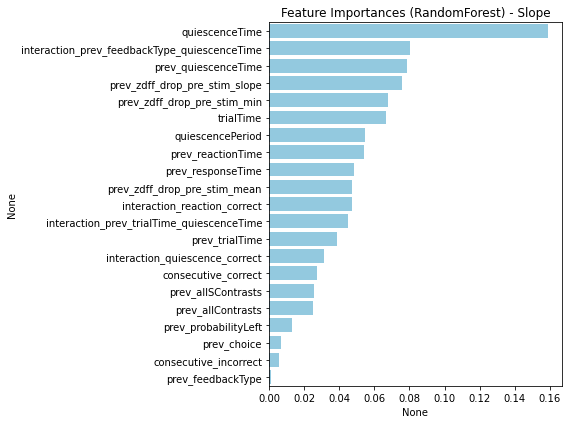

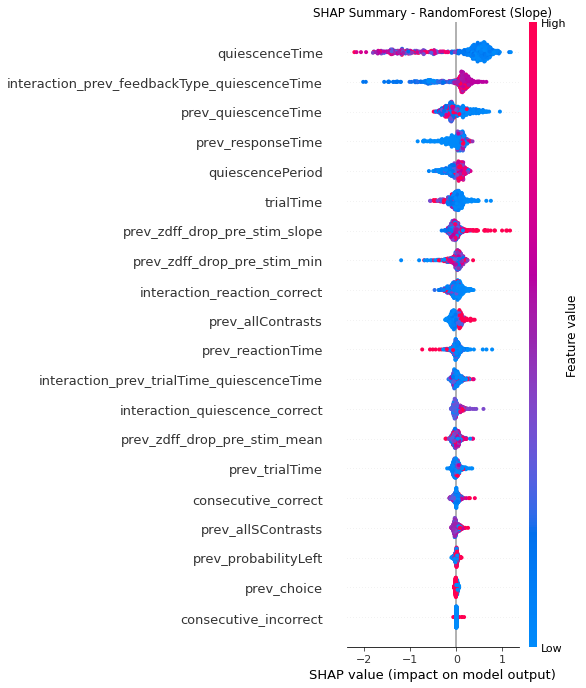

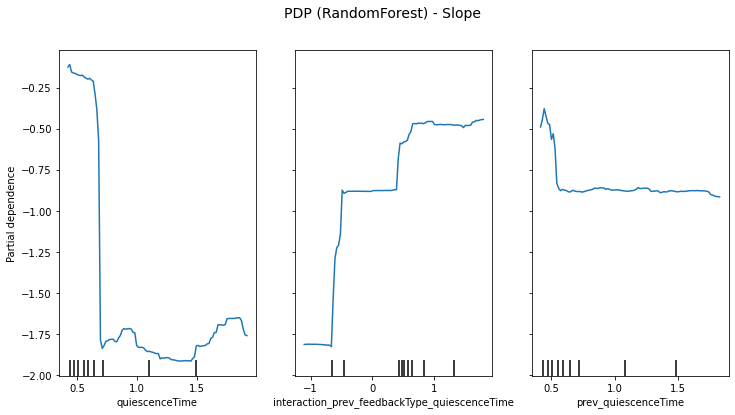

=== GradientBoosting ===
R²: 0.056 | RMSE: 2.5855 | MAE: 1.9372



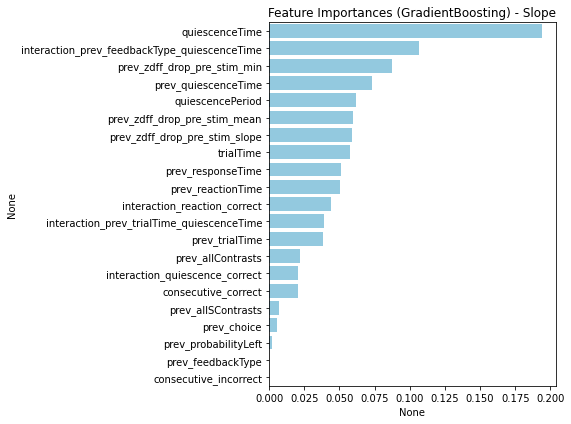

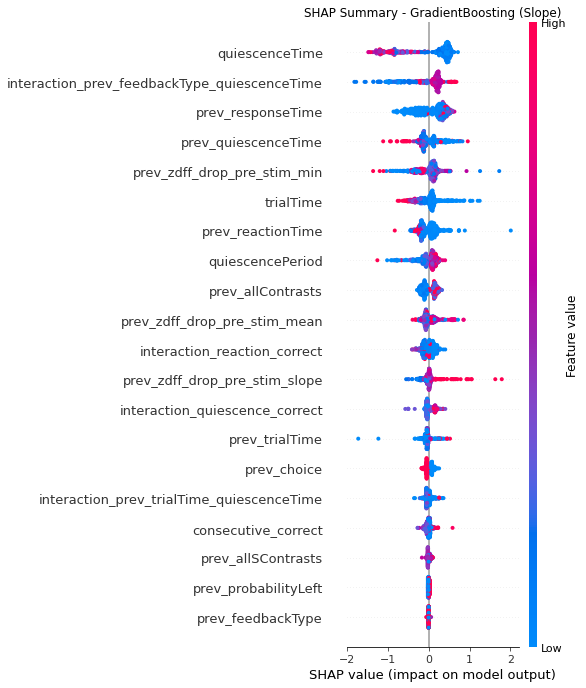

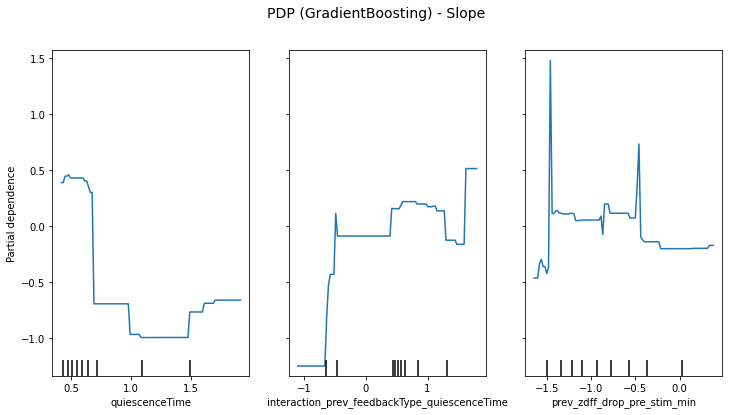

=== XGBoost ===
R²: 0.081 | RMSE: 2.5515 | MAE: 1.8992



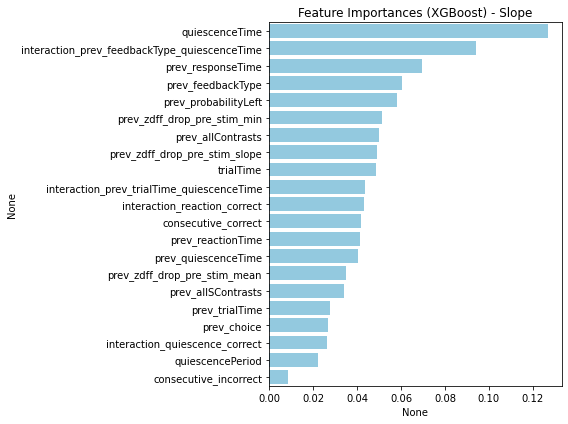

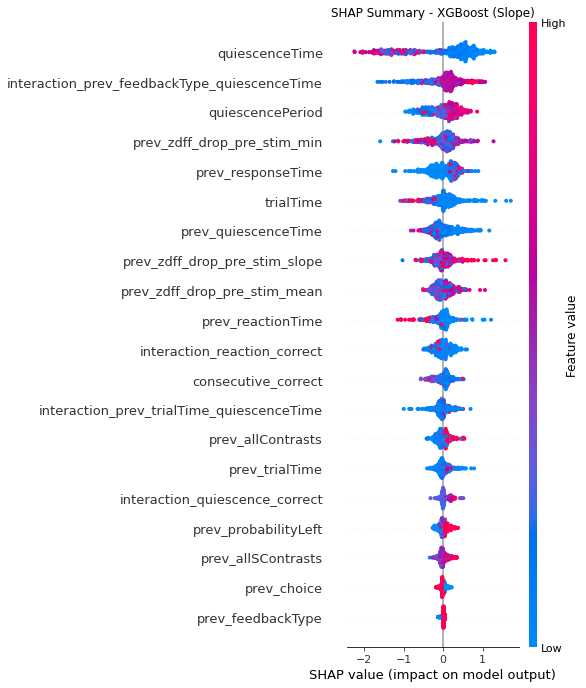

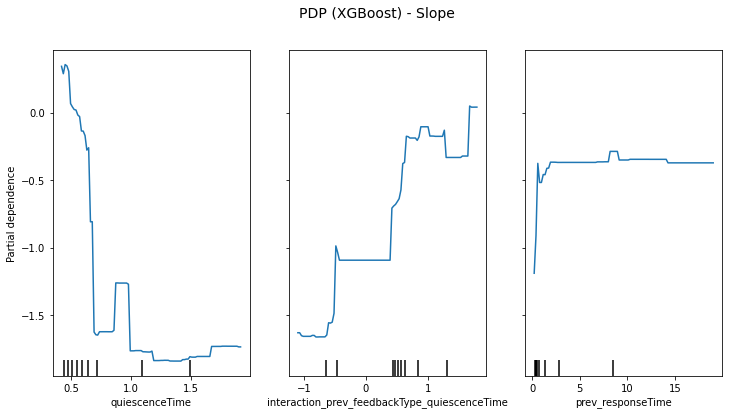

=== NeuralNet ===
R²: -0.313 | RMSE: 3.0487 | MAE: 2.3237


===== ALL RESULTS =====

Target: Mean
LinearRegression: R²=-0.110, RMSE=0.6963, MAE=0.5568
LassoCV: R²=-0.046, RMSE=0.6757, MAE=0.5414
ElasticNetCV: R²=-0.044, RMSE=0.6752, MAE=0.5413
SVR: R²=-0.031, RMSE=0.6708, MAE=0.5336
RandomForest: R²=0.097, RMSE=0.6279, MAE=0.5040
GradientBoosting: R²=0.035, RMSE=0.6492, MAE=0.5175
XGBoost: R²=-0.030, RMSE=0.6706, MAE=0.5323
NeuralNet: R²=-0.561, RMSE=0.8254, MAE=0.6620

Target: Min
LinearRegression: R²=-0.117, RMSE=0.6089, MAE=0.4804
LassoCV: R²=-0.040, RMSE=0.5875, MAE=0.4635
ElasticNetCV: R²=-0.039, RMSE=0.5872, MAE=0.4632
SVR: R²=-0.107, RMSE=0.6062, MAE=0.4809
RandomForest: R²=0.045, RMSE=0.5628, MAE=0.4531
GradientBoosting: R²=-0.111, RMSE=0.6073, MAE=0.4919
XGBoost: R²=-0.256, RMSE=0.6456, MAE=0.5251
NeuralNet: R²=-1.004, RMSE=0.8154, MAE=0.6363

Target: Slope
LinearRegression: R²=-0.046, RMSE=2.7214, MAE=2.0718
LassoCV: R²=0.002, RMSE=2.6578, MAE=2.0368
ElasticNetCV: R²=0.001, R

In [219]:
"""
21-August-2025 - EDITED, complete
Prediction of zdFF drop before stimOnTrigger_times
mean min slope
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LassoCV, ElasticNetCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.neural_network import MLPRegressor


import shap
from sklearn.inspection import PartialDependenceDisplay
import xgboost as xgb

# ==========================================================
# 1. COMPUTE TARGETS (zdFF drop features per trial)
# ==========================================================

pre_window = [-0.5, 0]  # seconds relative to stim

means, mins, slopes = [], [], []

for _, trial in df_trials.iterrows():
    stim_time = trial['stimOnTrigger_times']
    start, end = stim_time + pre_window[0], stim_time + pre_window[1]
    mask = (df_nph['times'] >= start) & (df_nph['times'] < end)
    segment = df_nph.loc[mask, 'zdFF']

    if segment.empty:
        means.append(np.nan)
        mins.append(np.nan)
        slopes.append(np.nan)
    else:
        means.append(segment.mean())
        mins.append(segment.min())
        # slope = linear regression on time vs zdFF
        t = df_nph.loc[mask, 'times'].values.reshape(-1, 1)
        from sklearn.linear_model import LinearRegression
        lr = LinearRegression().fit(t, segment.values)
        slopes.append(lr.coef_[0])

df_trials['zdff_drop_pre_stim_mean'] = means
df_trials['zdff_drop_pre_stim_min'] = mins
df_trials['zdff_drop_pre_stim_slope'] = slopes


# ==========================================================
# 2. FEATURE ENGINEERING
# ==========================================================

# ---- Current trial (A)
df_trials['quiescencePeriod'] = df_trials['quiescencePeriod']
df_trials['quiescenceTime']   = df_trials['quiescenceTime']
df_trials['trialTime']        = df_trials['trialTime']

# ---- Previous trial (B)
for col in ['quiescenceTime', 'trialTime', 'feedbackType', 'choice',
            'allContrasts', 'allSContrasts', 'reactionTime',
            'probabilityLeft', 'responseTime',
            'zdff_drop_pre_stim_mean', 'zdff_drop_pre_stim_min', 'zdff_drop_pre_stim_slope']:
    df_trials[f'prev_{col}'] = df_trials[col].shift(1)

# ---- Sequential (C)
df_trials['correct'] = (df_trials['feedbackType'] == 1).astype(int)
# Consecutive correct
consec_correct, consec_incorrect = [], []
count_c, count_i = 0, 0
for fb in df_trials['feedbackType']:
    consec_correct.append(count_c)
    consec_incorrect.append(count_i)
    if fb == 1:
        count_c += 1
        count_i = 0
    elif fb == -1:
        count_i += 1
        count_c = 0
    else:
        count_c = count_i = 0

df_trials['consecutive_correct'] = consec_correct
df_trials['consecutive_incorrect'] = consec_incorrect

# ---- Interactions (D)
df_trials['interaction_quiescence_correct'] = df_trials['quiescenceTime'] * df_trials['correct']
df_trials['interaction_reaction_correct'] = df_trials['reactionTime'] * df_trials['correct']
df_trials['interaction_prev_trialTime_quiescenceTime'] = df_trials['prev_trialTime'] * df_trials['quiescenceTime']
df_trials['interaction_prev_feedbackType_quiescenceTime'] = df_trials['prev_feedbackType'] * df_trials['quiescenceTime']



# ==========================================================
# 3. SELECT FINAL FEATURE SET
# ==========================================================

feature_cols = [
    # Current trial
    'quiescencePeriod', 'quiescenceTime', 'trialTime',
    # Previous trial
    'prev_quiescenceTime', 'prev_trialTime', 'prev_feedbackType',
    'prev_choice', 'prev_allContrasts', 'prev_allSContrasts',
    'prev_reactionTime', 'prev_probabilityLeft', 'prev_responseTime',
    'prev_zdff_drop_pre_stim_mean', 'prev_zdff_drop_pre_stim_min', 'prev_zdff_drop_pre_stim_slope',
    # Sequential
    'consecutive_correct', 'consecutive_incorrect',
    # Interactions
    'interaction_quiescence_correct', 'interaction_reaction_correct',
    'interaction_prev_trialTime_quiescenceTime', 'interaction_prev_feedbackType_quiescenceTime'
]

# # fewer features 
# feature_cols = [
#     # Current trial
#     'quiescenceTime',
#     # Previous trial
#     'prev_feedbackType',
#     'prev_choice', 'prev_allSContrasts',
#     'prev_zdff_drop_pre_stim_mean', 'prev_zdff_drop_pre_stim_min', 'prev_zdff_drop_pre_stim_slope',
#     # Sequential
#     'consecutive_correct', 'consecutive_incorrect',
#     # Interactions
#     # 'interaction_quiescence_correct', 'interaction_reaction_correct',
#     # 'interaction_prev_trialTime_quiescenceTime', 'interaction_prev_feedbackType_quiescenceTime'
# ]

# Keep only numeric features
X = df_trials[feature_cols].select_dtypes(include=[np.number]).fillna(0)

targets = {
    "Mean": df_trials['zdff_drop_pre_stim_mean'],
    "Min": df_trials['zdff_drop_pre_stim_min'],
    "Slope": df_trials['zdff_drop_pre_stim_slope'],
}

# ==========================================================
# 4. TRAINING LOOP FOR MULTIPLE TARGETS
# ==========================================================

models = {
    "LinearRegression": LinearRegression(),
    "LassoCV": LassoCV(cv=5, random_state=42),
    "ElasticNetCV": ElasticNetCV(cv=5, random_state=42),
    "SVR": SVR(kernel='rbf'),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42),
    "GradientBoosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=300, random_state=42),
    "NeuralNet": MLPRegressor(
        hidden_layer_sizes=(128, 64, 32),
        activation='relu', solver='adam',
        learning_rate_init=0.001,
        max_iter=500, random_state=42
    )
}

all_results = {}

for target_name, y in targets.items():
    print(f"\n==================== Target: {target_name} ====================")

    mask = y.notna()
    X_target, y_target = X[mask], y[mask]

    X_train, X_test, y_train, y_test = train_test_split(
        X_target, y_target, test_size=0.2, random_state=42
    )

    # Scale
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    results = {}

    for name, model in models.items():
        if name in ["LinearRegression", "LassoCV", "ElasticNetCV", "SVR"]:
            model.fit(X_train_scaled, y_train)
            y_pred = model.predict(X_test_scaled)
        else:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)

        results[name] = {"R2": r2, "RMSE": rmse, "MAE": mae}
        print(f"=== {name} ===")
        print(f"R²: {r2:.3f} | RMSE: {rmse:.4f} | MAE: {mae:.4f}\n")

        # Feature importance (tree models only)
        if hasattr(model, "feature_importances_"):
            importances = pd.Series(model.feature_importances_, index=X.columns)
            importances = importances.sort_values(ascending=False)
            plt.figure(figsize=(8, 6))
            sns.barplot(x=importances, y=importances.index, color="skyblue")
            plt.title(f"Feature Importances ({name}) - {target_name}")
            plt.tight_layout()
            plt.show()

            # SHAP for tree models
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X_train)
            shap.summary_plot(shap_values, X_train, feature_names=X.columns, show=False)
            plt.title(f"SHAP Summary - {name} ({target_name})")
            plt.show()

            # PDP for top 3 features
            top_features = importances.index[:3].tolist()
            fig, ax = plt.subplots(figsize=(12, 6))
            PartialDependenceDisplay.from_estimator(
                model, X_train, top_features, feature_names=X.columns, ax=ax
            )
            plt.suptitle(f"PDP ({name}) - {target_name}", fontsize=14)
            plt.show()

    all_results[target_name] = results

# Final results summary
print("\n===== ALL RESULTS =====")
for target, res in all_results.items():
    print(f"\nTarget: {target}")
    for model, metrics in res.items():
        print(f"{model}: R²={metrics['R2']:.3f}, RMSE={metrics['RMSE']:.4f}, MAE={metrics['MAE']:.4f}")

In [220]:
# ==========================================================
# 5. Select Best Model per Target
# ==========================================================

print("\n===== BEST MODELS PER TARGET =====")
best_models = {}

for target, res in all_results.items():
    # Pick model with highest R²
    best_model = max(res.items(), key=lambda x: x[1]['R2'])
    best_models[target] = best_model
    print(f"{target}: {best_model[0]} (R²={best_model[1]['R2']:.3f}, "
          f"RMSE={best_model[1]['RMSE']:.4f}, MAE={best_model[1]['MAE']:.4f})")


===== BEST MODELS PER TARGET =====
Mean: RandomForest (R²=0.097, RMSE=0.6279, MAE=0.5040)
Min: RandomForest (R²=0.045, RMSE=0.5628, MAE=0.4531)
Slope: RandomForest (R²=0.098, RMSE=2.5278, MAE=1.8526)


prev_trialTime                                 -1.341071
prev_responseTime                               1.250137
quiescenceTime                                  0.093289
consecutive_incorrect                           0.079801
quiescencePeriod                               -0.070702
prev_quiescenceTime                             0.067863
interaction_prev_trialTime_quiescenceTime       0.066366
prev_probabilityLeft                           -0.065184
prev_feedbackType                              -0.053876
prev_zdff_drop_pre_stim_mean                   -0.048777
prev_zdff_drop_pre_stim_min                     0.044802
trialTime                                       0.038025
prev_allSContrasts                              0.031820
prev_choice                                     0.030863
prev_allContrasts                              -0.026619
prev_reactionTime                               0.024124
interaction_quiescence_correct                  0.022201
interaction_reaction_correct   

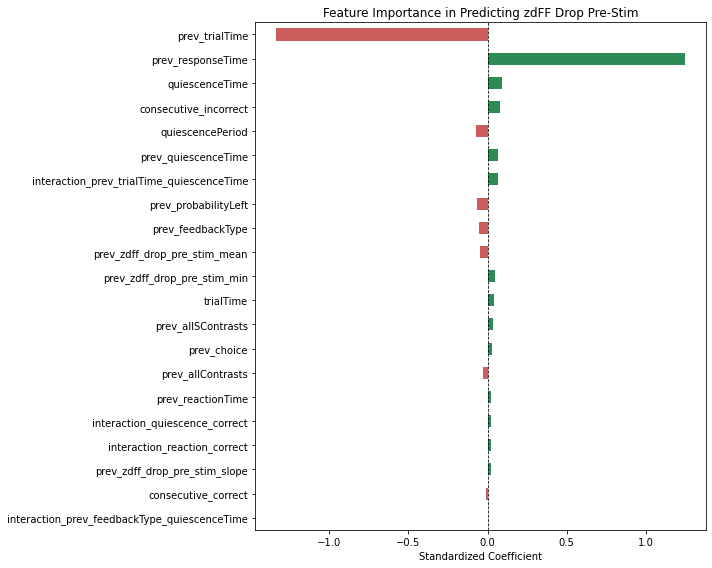

In [221]:
""" 
Feature Importance - double-check! 
"""

feature_cols
X = df_trials[feature_cols].select_dtypes(include=[np.number]).fillna(0)
X = X.fillna(0)  # fill NaNs (first trial, etc.)
y = df_trials['zdff_drop_pre_stim_mean']


X = X[mask]
y = y[mask]

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = LinearRegression()
model.fit(X_scaled, y)

import pandas as pd
coeffs = pd.Series(model.coef_, index=X.columns)
print(coeffs.sort_values(key=abs, ascending=False))


import matplotlib.pyplot as plt

# Sort by absolute value
sorted_coeffs = coeffs.sort_values(key=abs, ascending=True)

plt.figure(figsize=(10, 8))
sorted_coeffs.plot(kind='barh', color=(sorted_coeffs > 0).map({True: 'seagreen', False: 'indianred'}))
plt.xlabel("Standardized Coefficient")
plt.title("Feature Importance in Predicting zdFF Drop Pre-Stim")
plt.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
plt.tight_layout()
plt.show()

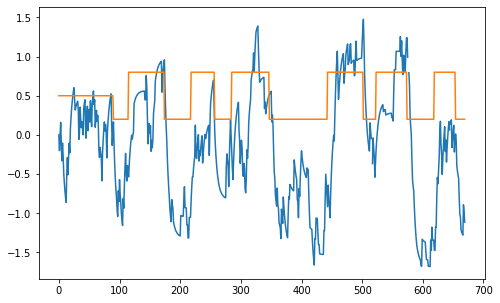

In [222]:
#KB TO EXPLORE
alpha, gamma = 0.2, 0.9  # learning rate, discount factor
q_values, reward_preds = [], []
Q = {0:0, 1:0}  # left=0, right=1

for _, row in df_trials.iterrows():
    choice_raw = row['choice']
    reward = row['feedbackType']
    
    # Map choices: -1 → 0 (left), +1 → 1 (right)
    if choice_raw == -1:
        choice = 0
    elif choice_raw == 1:
        choice = 1
    else:
        # If NaN or invalid choice, skip with default value
        q_values.append(np.nan)
        reward_preds.append(np.nan)
        continue
    
    # Append current values
    q_values.append(Q[choice])
    reward_preds.append(Q[1] - Q[0])  # relative bias
    
    # Q-learning update
    pe = reward - Q[choice]
    Q[choice] += alpha * pe

df_trials['q_value'] = q_values
df_trials['q_bias'] = reward_preds
plt.plot(df_trials.q_bias)
plt.plot(df_trials.probabilityLeft) 

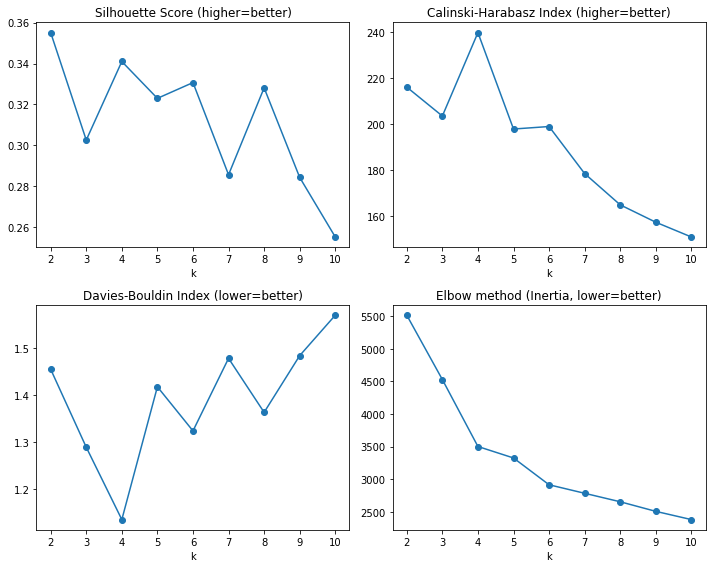

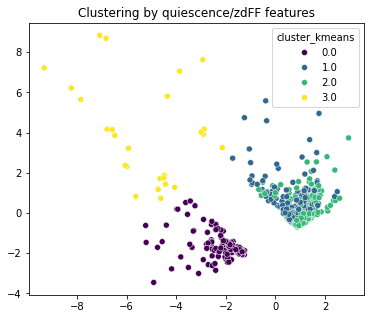

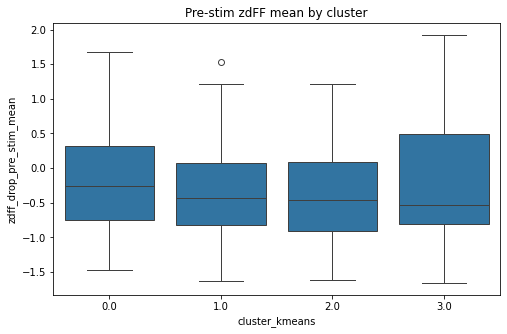

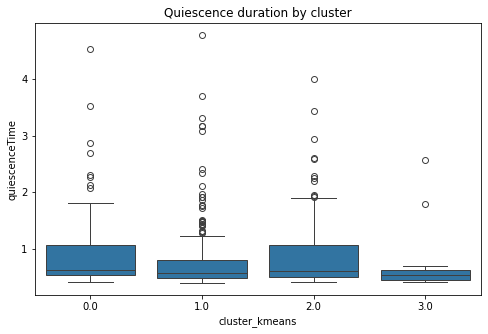

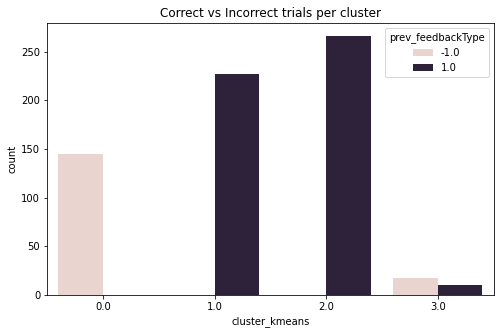

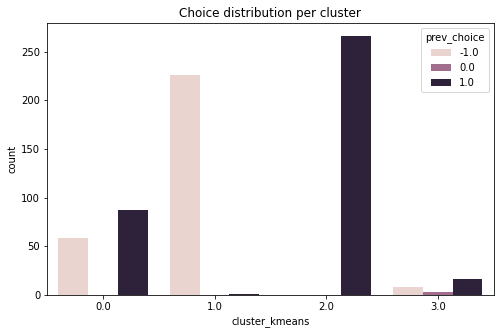

In [223]:
""" 
ADDING UNSUPERVISED MODELS 
21-August-2025
"""

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# Choose features for clustering
feature_cols = [
    # Current trial
    'quiescenceTime',
    'prev_trialTime', 'prev_feedbackType',
    'prev_choice', 'prev_allSContrasts',
    'prev_reactionTime', 'prev_probabilityLeft', 
    # Sequential
    'consecutive_correct', 'consecutive_incorrect',
    # Interactions
    'interaction_prev_trialTime_quiescenceTime', 'interaction_prev_feedbackType_quiescenceTime'
]
cluster_features = df_trials[feature_cols].dropna()

# Scale
scaler = StandardScaler()
X_cluster = scaler.fit_transform(cluster_features)



from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Candidate k values
K = range(2, 11)
sil_scores, ch_scores, db_scores, inertias = [], [], [], []

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X_cluster)
    labels = kmeans.labels_
    
    sil_scores.append(silhouette_score(X_cluster, labels))
    ch_scores.append(calinski_harabasz_score(X_cluster, labels))
    db_scores.append(davies_bouldin_score(X_cluster, labels))
    inertias.append(kmeans.inertia_)

# --- Plot results ---
fig, axs = plt.subplots(2, 2, figsize=(10,8))

axs[0,0].plot(K, sil_scores, 'o-')
axs[0,0].set_title("Silhouette Score (higher=better)")
axs[0,0].set_xlabel("k")

axs[0,1].plot(K, ch_scores, 'o-')
axs[0,1].set_title("Calinski-Harabasz Index (higher=better)")
axs[0,1].set_xlabel("k")

axs[1,0].plot(K, db_scores, 'o-')
axs[1,0].set_title("Davies-Bouldin Index (lower=better)")
axs[1,0].set_xlabel("k")

axs[1,1].plot(K, inertias, 'o-')
axs[1,1].set_title("Elbow method (Inertia, lower=better)")
axs[1,1].set_xlabel("k")

plt.tight_layout()
plt.show()

"""
Silhouette: pick the peak.

Calinski–Harabasz: also peak.

Davies–Bouldin: look for the dip.

Inertia: look for the “elbow” where extra clusters stop helping much.
"""


""" BEST CLUSTER NUMBER = 4 """

# Try k-means
kmeans = KMeans(n_clusters=4, random_state=42)
df_trials.loc[cluster_features.index, "cluster_kmeans"] = kmeans.fit_predict(X_cluster)

# Try Gaussian Mixture
gmm = GaussianMixture(n_components=4, random_state=42)
df_trials.loc[cluster_features.index, "cluster_gmm"] = gmm.fit_predict(X_cluster)

# Quick visualization (PCA)
X_pca = PCA(n_components=2).fit_transform(X_cluster)
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=df_trials.loc[cluster_features.index,"cluster_kmeans"],
                palette="viridis")
plt.title("Clustering by quiescence/zdFF features")
plt.show()

# Compare zdFF across clusters
sns.boxplot(x="cluster_kmeans", y="zdff_drop_pre_stim_mean", data=df_trials)
plt.title("Pre-stim zdFF mean by cluster")
plt.show()


sns.boxplot(x="cluster_kmeans", y="quiescenceTime", data=df_trials)
plt.title("Quiescence duration by cluster")
plt.show()

sns.countplot(x="cluster_kmeans", hue="prev_feedbackType", data=df_trials)
plt.title("Correct vs Incorrect trials per cluster")
plt.show()

sns.countplot(x="cluster_kmeans", hue="prev_choice", data=df_trials)
plt.title("Choice distribution per cluster")
plt.show()

In [224]:
import numpy as np
# Step 1: shift so that value at t=0 = 0
# (assuming zdff_drop_pre_stim_mean is already computed relative to t=0 baseline,
# but if not, you can subtract the value at t=0)
df["zdff_drop_norm_mean"] = df["zdff_drop_pre_stim_mean"] - df["zdff_drop_pre_stim_mean"].iloc[0]
df["zdff_drop_norm_min"] = df["zdff_drop_pre_stim_min"] - df["zdff_drop_pre_stim_min"].iloc[0]
df["zdff_drop_norm_slope"] = df["zdff_drop_pre_stim_slope"] - df["zdff_drop_pre_stim_slope"].iloc[0]

# Step 2: shift upwards so all values ≥ 0
df["zdff_drop_norm_mean"] = df["zdff_drop_norm_mean"] - df["zdff_drop_norm_mean"].min()

# Do the same for min and slope
df["zdff_drop_norm_min"] = df["zdff_drop_pre_stim_min"] - df["zdff_drop_pre_stim_min"].min()
df["zdff_drop_norm_slope"] = df["zdff_drop_pre_stim_slope"] - df["zdff_drop_pre_stim_slope"].min()

NameError: name 'df' is not defined

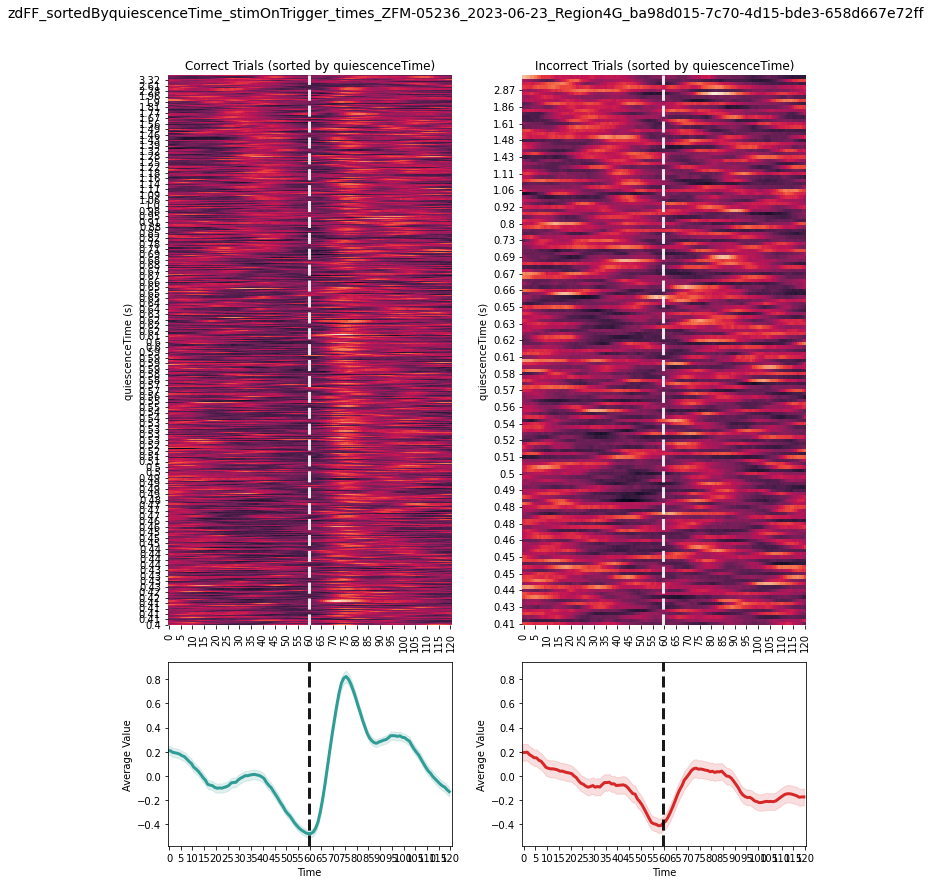

In [225]:
"""
Plot the same, but all the code to choose the event and plot the heatmap 
to change: 
EVENT
responseTime
""" 
""" SELECT THE EVENT AND WHAT INTERVAL TO PLOT IN THE PSTH """ 
EVENT = "stimOnTrigger_times" 
time_bef = -2
time_aft = 2
PERIEVENT_WINDOW = [time_bef,time_aft]
SAMPLING_RATE = int(1/np.mean(np.diff(df_nph.times))) 

array_timestamps = np.array(df_nph.times) #pick the nph timestamps transformed to bpod clock 
event_test = np.array(df_trials.intervals_0) #pick the intervals_0 timestamps 
idx_event = np.searchsorted(array_timestamps, event_test) #check idx where they would be included, in a sorted way 
""" create a column with the trial number in the nph df """
df_nph["trial_number"] = 0 #create a new column for the trial_number 
df_nph.loc[idx_event,"trial_number"]=1
df_nph["trial_number"] = df_nph.trial_number.cumsum() #sum the [i-1] to i in order to get the trial number 

sample_window = np.arange(PERIEVENT_WINDOW[0] * SAMPLING_RATE, PERIEVENT_WINDOW[1] * SAMPLING_RATE + 1)
n_trials = df_trials.shape[0]

psth_idx = np.tile(sample_window[:,np.newaxis], (1, n_trials)) 

event_times = np.array(df_trials[EVENT]) #pick the feedback timestamps 

event_idx = np.searchsorted(array_timestamps, event_times) #check idx where they would be included, in a sorted way 

psth_idx += event_idx


import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def plot_heatmap_psth_sorted_by_rt(preprocessingtype=df_nph.zdFF, column_sort='reactionTime'):
    # Boolean masks
    mask_correct = df_trials.feedbackType == 1
    mask_incorrect = df_trials.feedbackType == -1

    # PSTHs (n_timepoints × n_trials)
    psth_good = preprocessingtype.values[psth_idx[:, mask_correct]]
    psth_error = preprocessingtype.values[psth_idx[:, mask_incorrect]]

    # Reaction times and sort indices
    reaction_times_correct = df_trials.loc[mask_correct, column_sort].values
    sort_idx_correct = np.argsort(reaction_times_correct)
    psth_good_sorted = psth_good.T[sort_idx_correct]  # transpose → trials × time
    reaction_times_correct_sorted = reaction_times_correct[sort_idx_correct]

    reaction_times_incorrect = df_trials.loc[mask_incorrect, column_sort].values
    sort_idx_incorrect = np.argsort(reaction_times_incorrect)
    psth_error_sorted = psth_error.T[sort_idx_incorrect]
    reaction_times_incorrect_sorted = reaction_times_incorrect[sort_idx_incorrect]

    # Round for tick display
    rt_correct_rounded = np.round(reaction_times_correct_sorted, 2)
    rt_incorrect_rounded = np.round(reaction_times_incorrect_sorted, 2)

    # Average and SEM
    psth_good_avg = psth_good.mean(axis=1)
    sem_good = psth_good.std(axis=1) / np.sqrt(psth_good.shape[1])
    psth_error_avg = psth_error.mean(axis=1)
    sem_error = psth_error.std(axis=1) / np.sqrt(psth_error.shape[1])

    # Plot
    fig = plt.figure(figsize=(10, 12))
    gs = fig.add_gridspec(2, 2, height_ratios=[3, 1])

    # === Correct trials heatmap ===
    ax1 = fig.add_subplot(gs[0, 0])
    sns.heatmap(psth_good_sorted, cbar=False, ax=ax1)
    ax1.invert_yaxis()
    ax1.axvline(x=60, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax1.set_title(f'Correct Trials (sorted by {column_sort})')

    # Set y-ticks with RT labels
    step = 5  # label every 5th trial
    tick_locs = np.arange(0, len(rt_correct_rounded), step)
    ax1.set_yticks(tick_locs + 0.5)
    ax1.set_yticklabels(rt_correct_rounded[tick_locs])
    ax1.set_ylabel(f"{column_sort} (s)")

    # === Correct average plot ===
    ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
    ax2.plot(psth_good_avg, color='#2f9c95', linewidth=3)
    ax2.fill_between(range(len(psth_good_avg)), psth_good_avg - sem_good, psth_good_avg + sem_good, color='#2f9c95', alpha=0.15)
    ax2.axvline(x=60, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax2.set_ylabel('Average Value')
    ax2.set_xlabel('Time')

    # === Incorrect trials heatmap ===
    ax3 = fig.add_subplot(gs[0, 1], sharex=ax1)
    sns.heatmap(psth_error_sorted, cbar=False, ax=ax3)
    ax3.invert_yaxis()
    ax3.axvline(x=60, color="white", alpha=0.9, linewidth=3, linestyle="dashed") 
    ax3.set_title(f'Incorrect Trials (sorted by {column_sort})')

    tick_locs_err = np.arange(0, len(rt_incorrect_rounded), step)
    ax3.set_yticks(tick_locs_err + 0.5)
    ax3.set_yticklabels(rt_incorrect_rounded[tick_locs_err])
    ax3.set_ylabel(f"{column_sort} (s)")

    # === Incorrect average plot ===
    ax4 = fig.add_subplot(gs[1, 1], sharex=ax3, sharey=ax2)
    ax4.plot(psth_error_avg, color='#d62828', linewidth=3)
    ax4.fill_between(range(len(psth_error_avg)), psth_error_avg - sem_error, psth_error_avg + sem_error, color='#d62828', alpha=0.15)
    ax4.axvline(x=60, color="black", alpha=0.9, linewidth=3, linestyle="dashed")
    ax4.set_ylabel('Average Value')
    ax4.set_xlabel('Time')

    fig.suptitle(f'zdFF_sortedBy{column_sort}_{EVENT}_{subject}_{session_date}_{region}_{eid}', y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()

plot_heatmap_psth_sorted_by_rt(df_nph.zdFF, column_sort='quiescenceTime')

In [226]:
pre_window = [0, 0.5]  # in seconds


Model coefficients:
 reactionTime          -0.077418
prev_trialTime         0.065668
correct                0.055104
quiescenceTime        -0.050164
consecutive_correct    0.030023
prev_quiescenceTime    0.025590
dtype: float64


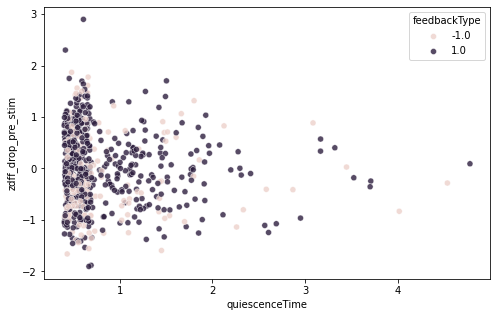

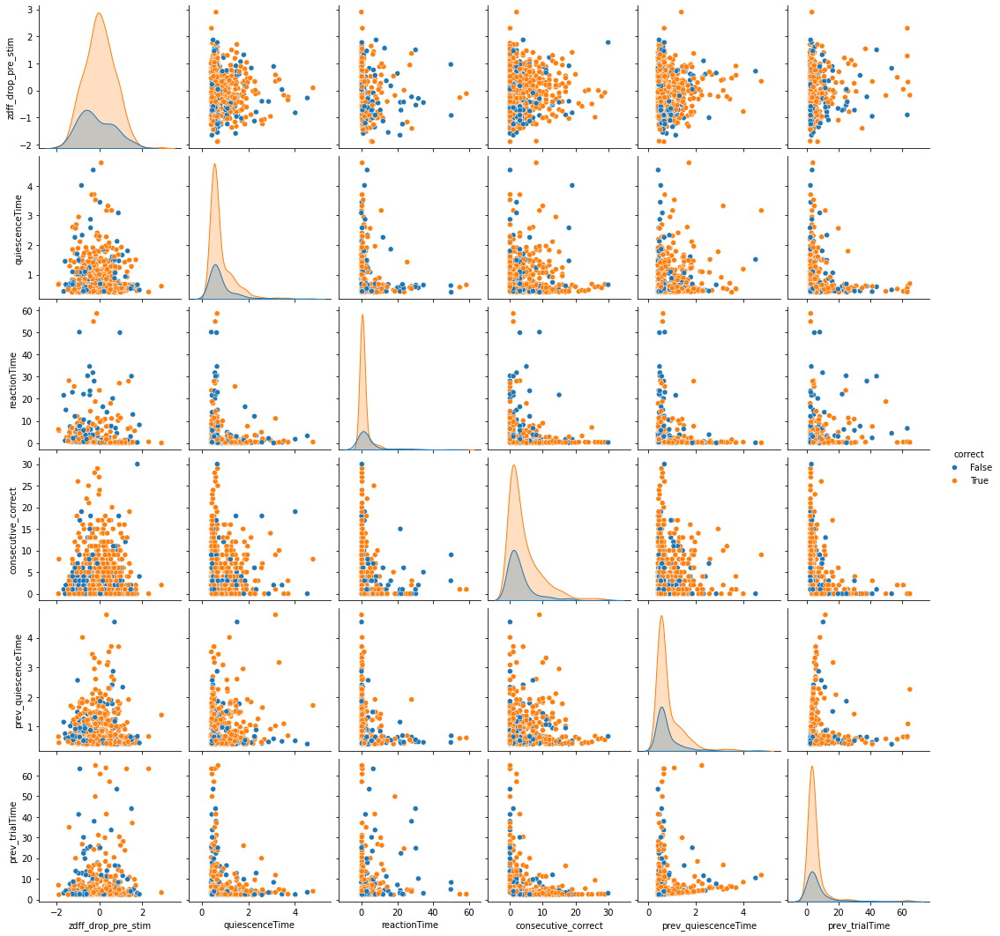

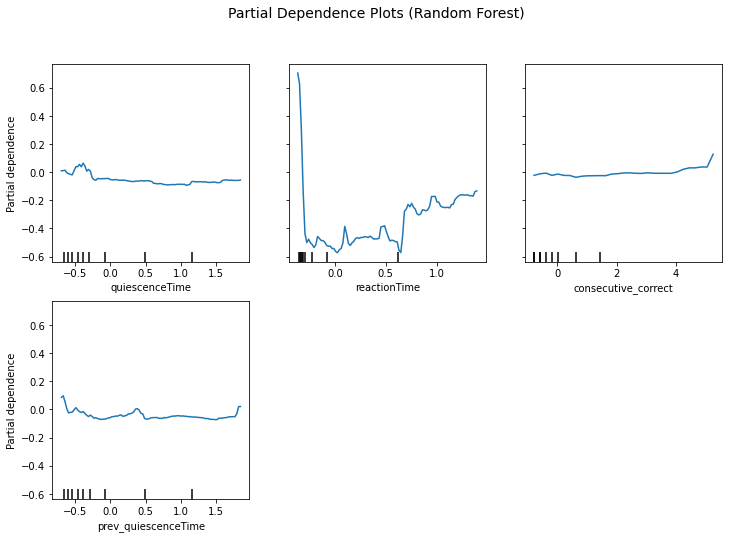

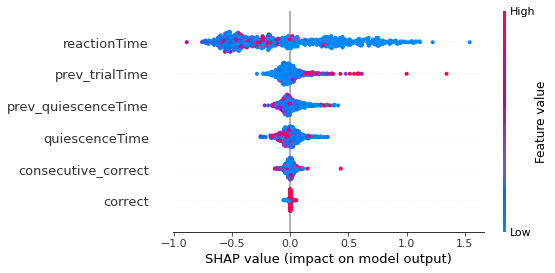

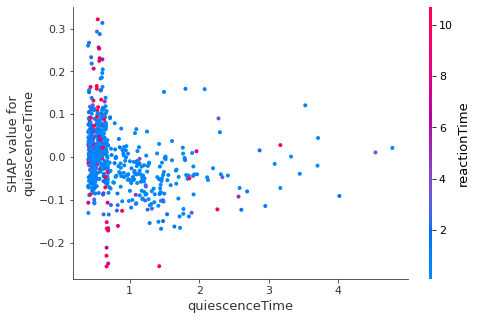

In [227]:
# Create empty list for signal drops
zdff_drops = []

for _, trial in df_trials.iterrows():
   stim_time = trial['stimOnTrigger_times']
  
   # Define time window for this trial
   start = stim_time + pre_window[0]
   end = stim_time + pre_window[1]

   # Mask for that time window
   mask = (df_nph['times'] >= start) & (df_nph['times'] < end)

   # Extract zdFF segment
   segment = df_nph.loc[mask, 'zdFF']

   # Measure "drop" — e.g., min value or average
   drop = segment.mean() if not segment.empty else np.nan
   zdff_drops.append(drop)

# Add to df_trials
df_trials['zdff_drop_pre_stim'] = zdff_drops

df_trials['correct'] = df_trials['feedbackType'] == 1
# df_trials['consecutive_correct'] = df_trials['correct'].astype(int).rolling(window=2).sum().fillna(0)

# Counter for consecutive corrects before current trial
consec = []
count = 0
for c in df_trials['correct']:
    consec.append(count)  # store count BEFORE updating
    if c:
        count += 1
    else:
        count = 0

df_trials['consecutive_correct'] = consec

# Add previous trial's quiescence time
df_trials['prev_quiescenceTime'] = df_trials['quiescenceTime'].shift(1)

# Add previous trial's full trial time
df_trials['prev_trialTime'] = df_trials['trialTime'].shift(1)

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Choose predictors
X = df_trials[['quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime']]
X = X.fillna(0)  # handle NaNs

# Add correctness as binary
X['correct'] = (df_trials['feedbackType'] == 1).astype(int)

# Target
y = df_trials['zdff_drop_pre_stim']

# Drop NaNs
mask = y.notna()
X = X[mask]
y = y[mask]

# Scale X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit model
model = LinearRegression()
model.fit(X_scaled, y)

# Print coefficients
coeffs = pd.Series(model.coef_, index=X.columns)
print("Model coefficients:\n", coeffs.sort_values(key=abs, ascending=False))

import seaborn as sns
sns.scatterplot(data=df_trials, x='quiescenceTime', y='zdff_drop_pre_stim', hue='feedbackType', alpha=0.8)

sns.pairplot(df_trials, vars=['zdff_drop_pre_stim', 'quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime'], hue='correct')


from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Fit Random Forest again
rf = RandomForestRegressor(random_state=42, n_estimators=300)
rf.fit(X_scaled, y)

# Plot PDP for all features
fig, ax = plt.subplots(figsize=(12, 8))
PartialDependenceDisplay.from_estimator(rf, X_scaled, [0, 1, 2, 3],
                                        feature_names=X.columns, ax=ax)
plt.suptitle("Partial Dependence Plots (Random Forest)", fontsize=14)
plt.show()


import shap

# Create SHAP explainer
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_scaled)

# Summary plot (global importance + direction of effect)
shap.summary_plot(shap_values, X, feature_names=X.columns)

# Dependence plot (feature vs its SHAP value)
shap.dependence_plot("quiescenceTime", shap_values, X, feature_names=X.columns)

In [ ]:
1

1

In [228]:

# Create empty list for signal drops
zdff_drops = []

for _, trial in df_trials.iterrows():
   stim_time = trial['feedback_time']
  
   # Define time window for this trial
   start = stim_time + pre_window[0]
   end = stim_time + pre_window[1]

   # Mask for that time window
   mask = (df_nph['times'] >= start) & (df_nph['times'] < end)

   # Extract zdFF segment
   segment = df_nph.loc[mask, 'zdFF']

   # Measure "drop" — e.g., min value or average
   drop = segment.mean() if not segment.empty else np.nan
   zdff_drops.append(drop)

# Add to df_trials
df_trials['zdff_drop_pre_stim'] = zdff_drops

df_trials['correct'] = df_trials['feedbackType'] == 1
# df_trials['consecutive_correct'] = df_trials['correct'].astype(int).rolling(window=2).sum().fillna(0)

# Counter for consecutive corrects before current trial
consec = []
count = 0
for c in df_trials['correct']:
    consec.append(count)  # store count BEFORE updating
    if c:
        count += 1
    else:
        count = 0

df_trials['consecutive_correct'] = consec

# Add previous trial's quiescence time
df_trials['prev_quiescenceTime'] = df_trials['quiescenceTime'].shift(1)

# Add previous trial's full trial time
df_trials['prev_trialTime'] = df_trials['trialTime'].shift(1)

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Choose predictors
X = df_trials[['quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime', 'feedbackType', 'choice']]
X = X.fillna(0)  # handle NaNs

# Add correctness as binary
X['correct'] = (df_trials['feedbackType'] == 1).astype(int)

# Target
y = df_trials['zdff_drop_pre_stim']

# Drop NaNs
mask = y.notna()
X = X[mask]
y = y[mask]

# Scale X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit model
model = LinearRegression()
model.fit(X_scaled, y)

# Print coefficients
coeffs = pd.Series(model.coef_, index=X.columns)
print("Model coefficients:\n", coeffs.sort_values(key=abs, ascending=False))

import seaborn as sns
sns.scatterplot(data=df_trials, x='reactionTime', y='zdff_drop_pre_stim', hue='feedbackType', alpha=0.8)

sns.pairplot(df_trials, vars=['zdff_drop_pre_stim', 'quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime', 'feedbackType', 'choice'], hue='correct')


from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Fit Random Forest again
rf = RandomForestRegressor(random_state=42, n_estimators=300)
rf.fit(X_scaled, y)

# Plot PDP for all features
fig, ax = plt.subplots(figsize=(12, 8))
PartialDependenceDisplay.from_estimator(rf, X_scaled, [0, 1, 2, 3],
                                        feature_names=X.columns, ax=ax)
plt.suptitle("Partial Dependence Plots (Random Forest)", fontsize=14)
plt.show()


import shap

# Create SHAP explainer
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_scaled)

# Summary plot (global importance + direction of effect)
shap.summary_plot(shap_values, X, feature_names=X.columns)

# Dependence plot (feature vs its SHAP value)
shap.dependence_plot("feedbackType", shap_values, X, feature_names=X.columns)



KeyError: 'feedback_time'

Model coefficients:
 feedbackType           0.075058
correct                0.075058
consecutive_correct   -0.072455
choice                -0.059013
prev_trialTime         0.043183
prev_quiescenceTime    0.009365
quiescenceTime         0.005667
reactionTime          -0.004373
dtype: float64


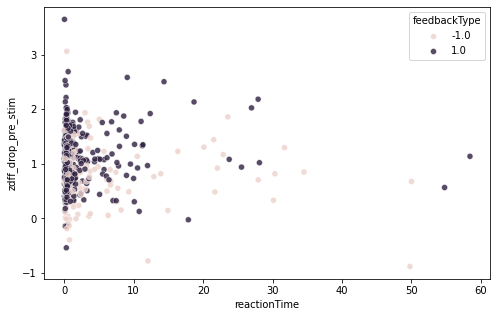

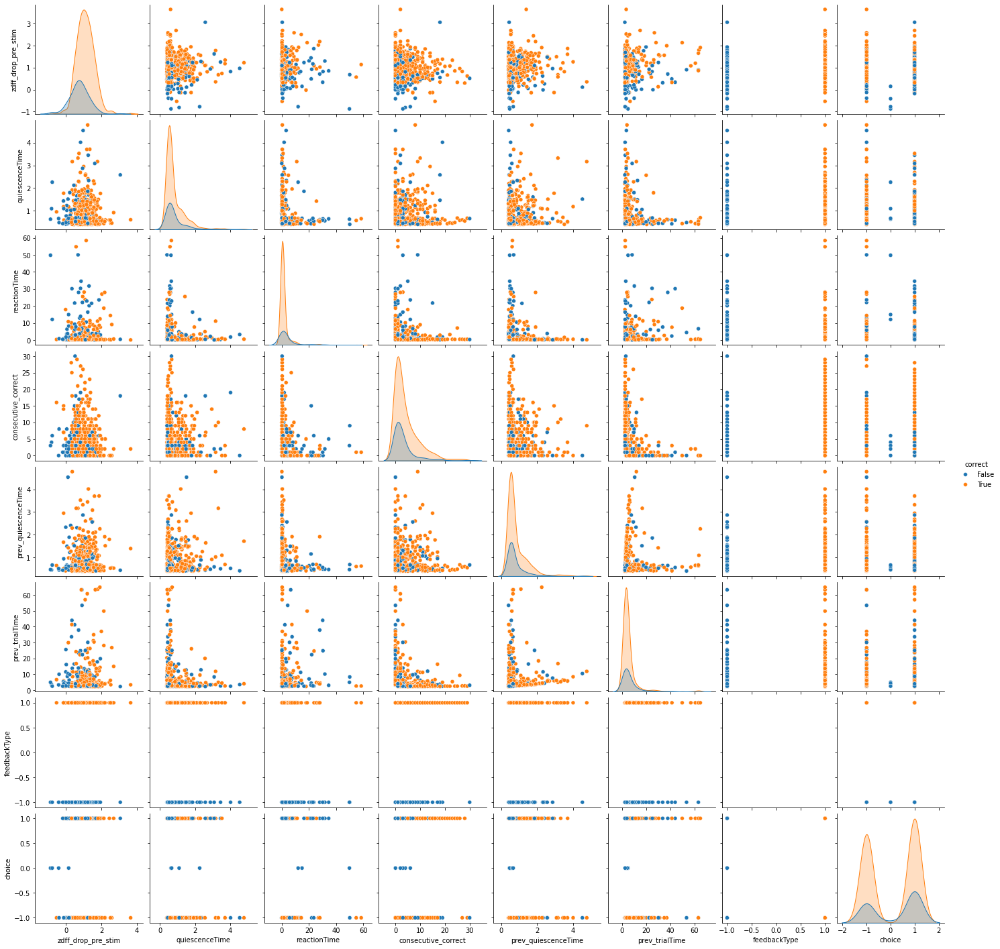

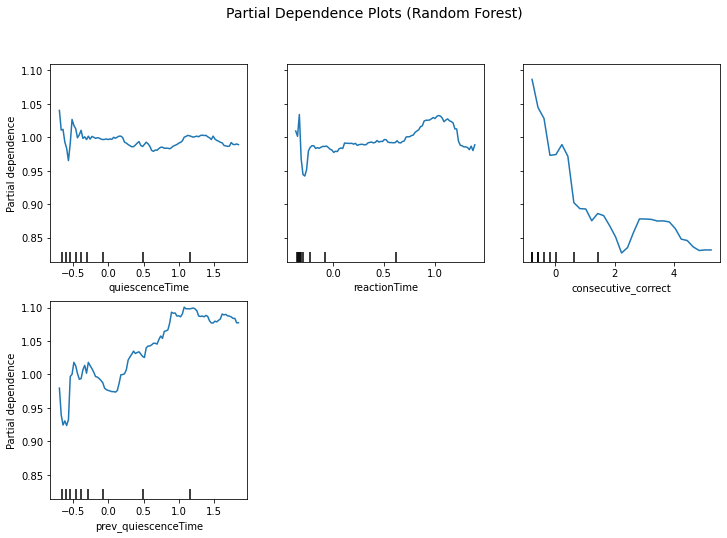

KeyboardInterrupt: 

In [229]:

# Create empty list for signal drops
zdff_drops = []

for _, trial in df_trials.iterrows():
   stim_time = trial['feedback_times']
  
   # Define time window for this trial
   start = stim_time + pre_window[0]
   end = stim_time + pre_window[1]

   # Mask for that time window
   mask = (df_nph['times'] >= start) & (df_nph['times'] < end)

   # Extract zdFF segment
   segment = df_nph.loc[mask, 'zdFF']

   # Measure "drop" — e.g., min value or average
   drop = segment.mean() if not segment.empty else np.nan
   zdff_drops.append(drop)

# Add to df_trials
df_trials['zdff_drop_pre_stim'] = zdff_drops

df_trials['correct'] = df_trials['feedbackType'] == 1
# df_trials['consecutive_correct'] = df_trials['correct'].astype(int).rolling(window=2).sum().fillna(0)

# Counter for consecutive corrects before current trial
consec = []
count = 0
for c in df_trials['correct']:
    consec.append(count)  # store count BEFORE updating
    if c:
        count += 1
    else:
        count = 0

df_trials['consecutive_correct'] = consec

# Add previous trial's quiescence time
df_trials['prev_quiescenceTime'] = df_trials['quiescenceTime'].shift(1)

# Add previous trial's full trial time
df_trials['prev_trialTime'] = df_trials['trialTime'].shift(1)

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Choose predictors
X = df_trials[['quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime', 'feedbackType', 'choice']]
X = X.fillna(0)  # handle NaNs

# Add correctness as binary
X['correct'] = (df_trials['feedbackType'] == 1).astype(int)

# Target
y = df_trials['zdff_drop_pre_stim']

# Drop NaNs
mask = y.notna()
X = X[mask]
y = y[mask]

# Scale X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit model
model = LinearRegression()
model.fit(X_scaled, y)

# Print coefficients
coeffs = pd.Series(model.coef_, index=X.columns)
print("Model coefficients:\n", coeffs.sort_values(key=abs, ascending=False))

import seaborn as sns
sns.scatterplot(data=df_trials, x='reactionTime', y='zdff_drop_pre_stim', hue='feedbackType', alpha=0.8)

sns.pairplot(df_trials, vars=['zdff_drop_pre_stim', 'quiescenceTime', 'reactionTime', 'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime', 'feedbackType', 'choice'], hue='correct')


from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Fit Random Forest again
rf = RandomForestRegressor(random_state=42, n_estimators=300)
rf.fit(X_scaled, y)

# Plot PDP for all features
fig, ax = plt.subplots(figsize=(12, 8))
PartialDependenceDisplay.from_estimator(rf, X_scaled, [0, 1, 2, 3],
                                        feature_names=X.columns, ax=ax)
plt.suptitle("Partial Dependence Plots (Random Forest)", fontsize=14)
plt.show()


import shap

# Create SHAP explainer
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_scaled)

# Summary plot (global importance + direction of effect)
shap.summary_plot(shap_values, X, feature_names=X.columns)

# Dependence plot (feature vs its SHAP value)
shap.dependence_plot("feedbackType", shap_values, X, feature_names=X.columns)



In [230]:

means, mins, slopes = [], [], []

for _, trial in df_trials.iterrows():
    stim_time = trial['feedback_times']
    start, end = stim_time + pre_window[0], stim_time + pre_window[1]
    mask = (df_nph['times'] >= start) & (df_nph['times'] < end)
    segment = df_nph.loc[mask, 'zdFF']

    if segment.empty:
        means.append(np.nan)
        mins.append(np.nan)
        slopes.append(np.nan)
    else:
        means.append(segment.mean())
        mins.append(segment.min())
        # slope = linear regression on time vs zdFF
        t = df_nph.loc[mask, 'times'].values.reshape(-1, 1)
        from sklearn.linear_model import LinearRegression
        lr = LinearRegression().fit(t, segment.values)
        slopes.append(lr.coef_[0])

df_trials['zdff_drop_pre_stim_mean'] = means
df_trials['zdff_drop_pre_stim_min'] = mins
df_trials['zdff_drop_pre_stim_slope'] = slopes



==================== Target: Mean ====================
=== LinearRegression ===
R²: 0.064 | RMSE: 0.5512 | MAE: 0.4093

=== LassoCV ===
R²: 0.077 | RMSE: 0.5473 | MAE: 0.4051



/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.057e-02, tolerance: 1.051e-02
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.506e-02, tolerance: 1.051e-02
  model = cd_fast.enet_coordinate_descent_gram(
/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increas

=== ElasticNetCV ===
R²: 0.078 | RMSE: 0.5471 | MAE: 0.4049

=== SVR ===
R²: 0.060 | RMSE: 0.5523 | MAE: 0.4205

=== RandomForest ===
R²: 0.096 | RMSE: 0.5416 | MAE: 0.4071



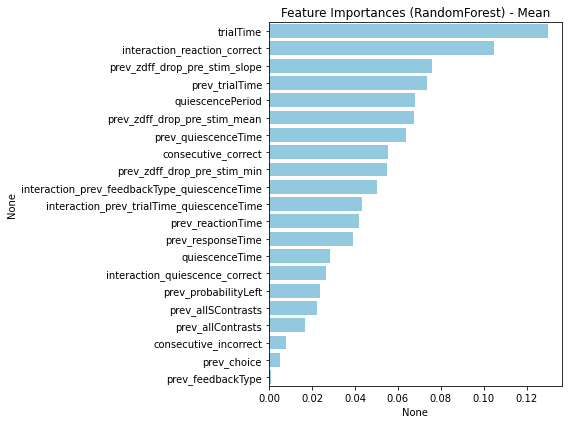

KeyboardInterrupt: 

In [231]:
# ---- Current trial (A)
df_trials['quiescencePeriod'] = df_trials['quiescencePeriod']
df_trials['quiescenceTime']   = df_trials['quiescenceTime']
df_trials['trialTime']        = df_trials['trialTime']

# ---- Previous trial (B)
for col in ['quiescenceTime', 'trialTime', 'feedbackType', 'choice',
            'allContrasts', 'allSContrasts', 'reactionTime',
            'probabilityLeft', 'responseTime',
            'zdff_drop_pre_stim_mean', 'zdff_drop_pre_stim_min', 'zdff_drop_pre_stim_slope']:
    df_trials[f'prev_{col}'] = df_trials[col].shift(1)

# ---- Sequential (C)
df_trials['correct'] = (df_trials['feedbackType'] == 1).astype(int)
# Consecutive correct
consec_correct, consec_incorrect = [], []
count_c, count_i = 0, 0
for fb in df_trials['feedbackType']:
    consec_correct.append(count_c)
    consec_incorrect.append(count_i)
    if fb == 1:
        count_c += 1
        count_i = 0
    elif fb == -1:
        count_i += 1
        count_c = 0
    else:
        count_c = count_i = 0

df_trials['consecutive_correct'] = consec_correct
df_trials['consecutive_incorrect'] = consec_incorrect

# ---- Interactions (D)
df_trials['interaction_quiescence_correct'] = df_trials['quiescenceTime'] * df_trials['correct']
df_trials['interaction_reaction_correct'] = df_trials['reactionTime'] * df_trials['correct']
df_trials['interaction_prev_trialTime_quiescenceTime'] = df_trials['prev_trialTime'] * df_trials['quiescenceTime']
df_trials['interaction_prev_feedbackType_quiescenceTime'] = df_trials['prev_feedbackType'] * df_trials['quiescenceTime']



# ==========================================================
# 3. SELECT FINAL FEATURE SET
# ==========================================================

feature_cols = [
    # Current trial
    'quiescencePeriod', 'quiescenceTime', 'trialTime',
    # Previous trial
    'prev_quiescenceTime', 'prev_trialTime', 'prev_feedbackType',
    'prev_choice', 'prev_allContrasts', 'prev_allSContrasts',
    'prev_reactionTime', 'prev_probabilityLeft', 'prev_responseTime',
    'prev_zdff_drop_pre_stim_mean', 'prev_zdff_drop_pre_stim_min', 'prev_zdff_drop_pre_stim_slope',
    # Sequential
    'consecutive_correct', 'consecutive_incorrect',
    # Interactions
    'interaction_quiescence_correct', 'interaction_reaction_correct',
    'interaction_prev_trialTime_quiescenceTime', 'interaction_prev_feedbackType_quiescenceTime'
]

# # fewer features 
# feature_cols = [
#     # Current trial
#     'quiescenceTime',
#     # Previous trial
#     'prev_feedbackType',
#     'prev_choice', 'prev_allSContrasts',
#     'prev_zdff_drop_pre_stim_mean', 'prev_zdff_drop_pre_stim_min', 'prev_zdff_drop_pre_stim_slope',
#     # Sequential
#     'consecutive_correct', 'consecutive_incorrect',
#     # Interactions
#     # 'interaction_quiescence_correct', 'interaction_reaction_correct',
#     # 'interaction_prev_trialTime_quiescenceTime', 'interaction_prev_feedbackType_quiescenceTime'
# ]

# Keep only numeric features
X = df_trials[feature_cols].select_dtypes(include=[np.number]).fillna(0)

targets = {
    "Mean": df_trials['zdff_drop_pre_stim_mean'],
    "Min": df_trials['zdff_drop_pre_stim_min'],
    "Slope": df_trials['zdff_drop_pre_stim_slope'],
}

# ==========================================================
# 4. TRAINING LOOP FOR MULTIPLE TARGETS
# ==========================================================

models = {
    "LinearRegression": LinearRegression(),
    "LassoCV": LassoCV(cv=5, random_state=42),
    "ElasticNetCV": ElasticNetCV(cv=5, random_state=42),
    "SVR": SVR(kernel='rbf'),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42),
    "GradientBoosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=300, random_state=42),
    "NeuralNet": MLPRegressor(
        hidden_layer_sizes=(128, 64, 32),
        activation='relu', solver='adam',
        learning_rate_init=0.001,
        max_iter=500, random_state=42
    )
}

all_results = {}

for target_name, y in targets.items():
    print(f"\n==================== Target: {target_name} ====================")

    mask = y.notna()
    X_target, y_target = X[mask], y[mask]

    X_train, X_test, y_train, y_test = train_test_split(
        X_target, y_target, test_size=0.2, random_state=42
    )

    # Scale
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    results = {}

    for name, model in models.items():
        if name in ["LinearRegression", "LassoCV", "ElasticNetCV", "SVR"]:
            model.fit(X_train_scaled, y_train)
            y_pred = model.predict(X_test_scaled)
        else:
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)

        results[name] = {"R2": r2, "RMSE": rmse, "MAE": mae}
        print(f"=== {name} ===")
        print(f"R²: {r2:.3f} | RMSE: {rmse:.4f} | MAE: {mae:.4f}\n")

        # Feature importance (tree models only)
        if hasattr(model, "feature_importances_"):
            importances = pd.Series(model.feature_importances_, index=X.columns)
            importances = importances.sort_values(ascending=False)
            plt.figure(figsize=(8, 6))
            sns.barplot(x=importances, y=importances.index, color="skyblue")
            plt.title(f"Feature Importances ({name}) - {target_name}")
            plt.tight_layout()
            plt.show()

            # SHAP for tree models
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X_train)
            shap.summary_plot(shap_values, X_train, feature_names=X.columns, show=False)
            plt.title(f"SHAP Summary - {name} ({target_name})")
            plt.show()

            # PDP for top 3 features
            top_features = importances.index[:3].tolist()
            fig, ax = plt.subplots(figsize=(12, 6))
            PartialDependenceDisplay.from_estimator(
                model, X_train, top_features, feature_names=X.columns, ax=ax
            )
            plt.suptitle(f"PDP ({name}) - {target_name}", fontsize=14)
            plt.show()

    all_results[target_name] = results

# Final results summary
print("\n===== ALL RESULTS =====")
for target, res in all_results.items():
    print(f"\nTarget: {target}")
    for model, metrics in res.items():
        print(f"{model}: R²={metrics['R2']:.3f}, RMSE={metrics['RMSE']:.4f}, MAE={metrics['MAE']:.4f}")

prev_trialTime                                 -3.446872
prev_responseTime                               3.392929
prev_quiescenceTime                             0.850872
interaction_quiescence_correct                 -0.498271
prev_feedbackType                              -0.287529
quiescenceTime                                  0.284361
prev_zdff_drop_pre_stim_mean                    0.133304
interaction_reaction_correct                    0.128860
quiescencePeriod                                0.084046
prev_allContrasts                              -0.059853
prev_probabilityLeft                           -0.048956
prev_zdff_drop_pre_stim_slope                   0.046602
trialTime                                       0.046275
interaction_prev_trialTime_quiescenceTime      -0.041722
interaction_prev_feedbackType_quiescenceTime    0.034294
consecutive_correct                             0.026191
prev_allSContrasts                             -0.022330
prev_choice                    

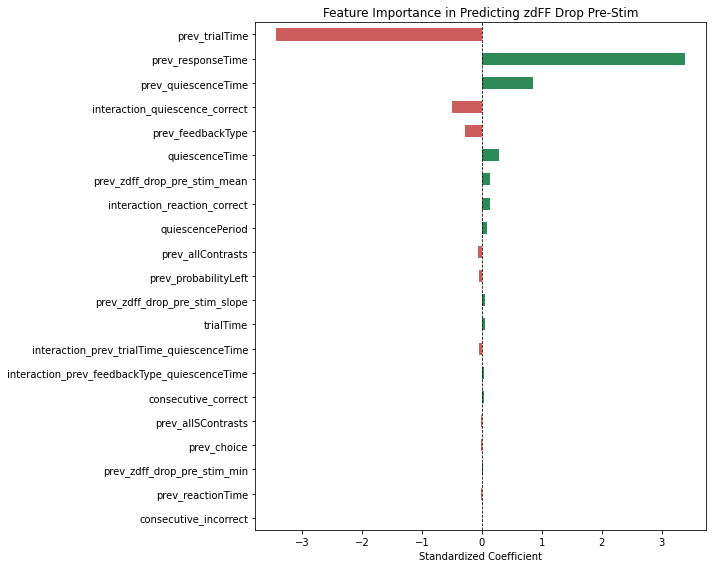

In [ ]:
""" 
Feature Importance - double-check! 
"""

feature_cols
X = df_trials[feature_cols].select_dtypes(include=[np.number]).fillna(0)
X = X.fillna(0)  # fill NaNs (first trial, etc.)
y = df_trials['zdff_drop_pre_stim_mean']


X = X[mask]
y = y[mask]

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = LinearRegression()
model.fit(X_scaled, y)

import pandas as pd
coeffs = pd.Series(model.coef_, index=X.columns)
print(coeffs.sort_values(key=abs, ascending=False))


import matplotlib.pyplot as plt

# Sort by absolute value
sorted_coeffs = coeffs.sort_values(key=abs, ascending=True)

plt.figure(figsize=(10, 8))
sorted_coeffs.plot(kind='barh', color=(sorted_coeffs > 0).map({True: 'seagreen', False: 'indianred'}))
plt.xlabel("Standardized Coefficient")
plt.title("Feature Importance in Predicting zdFF Drop Pre-Stim")
plt.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
plt.tight_layout()
plt.show()

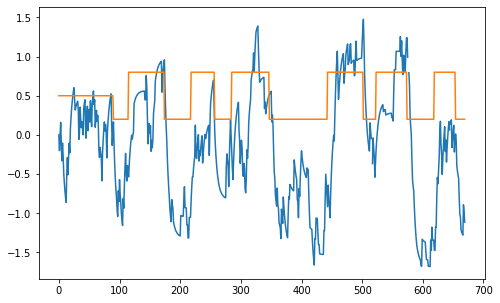

In [232]:
#KB TO EXPLORE
alpha, gamma = 0.2, 0.9  # learning rate, discount factor
q_values, reward_preds = [], []
Q = {0:0, 1:0}  # left=0, right=1

for _, row in df_trials.iterrows():
    choice_raw = row['choice']
    reward = row['feedbackType']
    
    # Map choices: -1 → 0 (left), +1 → 1 (right)
    if choice_raw == -1:
        choice = 0
    elif choice_raw == 1:
        choice = 1
    else:
        # If NaN or invalid choice, skip with default value
        q_values.append(np.nan)
        reward_preds.append(np.nan)
        continue
    
    # Append current values
    q_values.append(Q[choice])
    reward_preds.append(Q[1] - Q[0])  # relative bias
    
    # Q-learning update
    pe = reward - Q[choice]
    Q[choice] += alpha * pe

df_trials['q_value'] = q_values
df_trials['q_bias'] = reward_preds
plt.plot(df_trials.q_bias)
plt.plot(df_trials.probabilityLeft) 

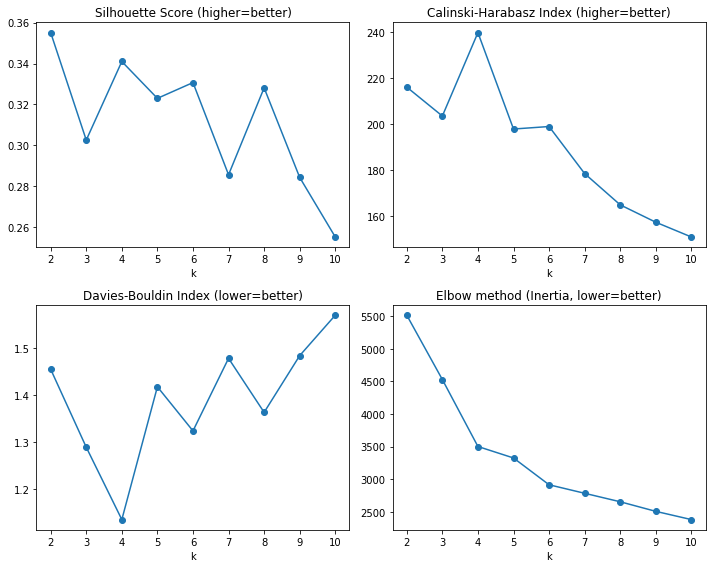

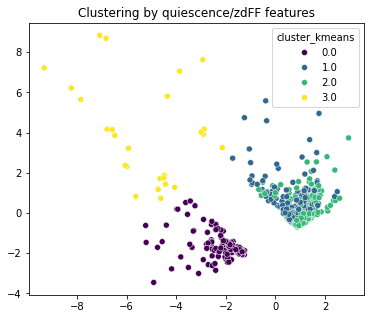

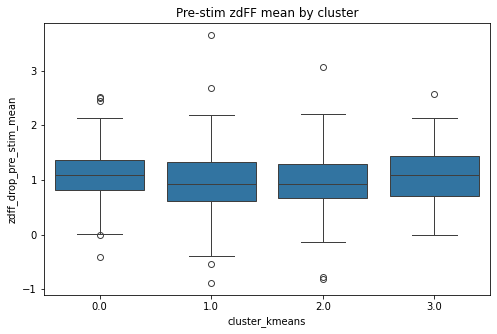

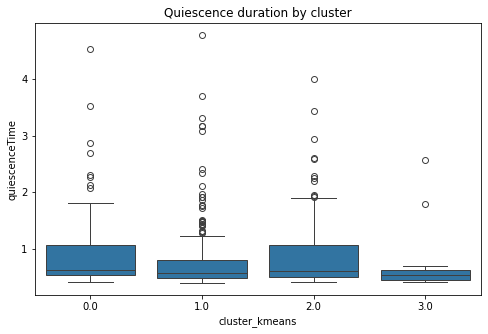

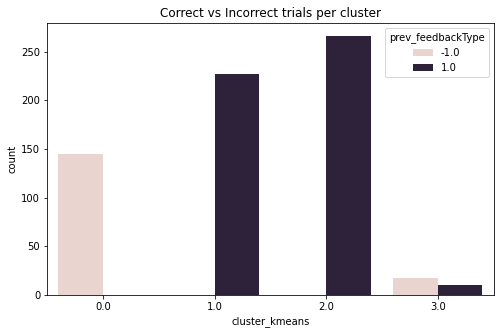

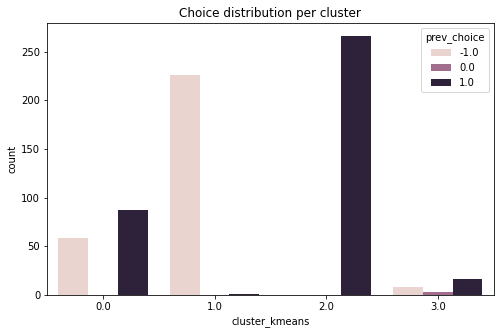

In [233]:
""" 
ADDING UNSUPERVISED MODELS 
21-August-2025
"""

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# Choose features for clustering
feature_cols = [
    # Current trial
    'quiescenceTime',
    'prev_trialTime', 'prev_feedbackType',
    'prev_choice', 'prev_allSContrasts',
    'prev_reactionTime', 'prev_probabilityLeft', 
    # Sequential
    'consecutive_correct', 'consecutive_incorrect',
    # Interactions
    'interaction_prev_trialTime_quiescenceTime', 'interaction_prev_feedbackType_quiescenceTime'
]
cluster_features = df_trials[feature_cols].dropna()

# Scale
scaler = StandardScaler()
X_cluster = scaler.fit_transform(cluster_features)



from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Candidate k values
K = range(2, 11)
sil_scores, ch_scores, db_scores, inertias = [], [], [], []

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X_cluster)
    labels = kmeans.labels_
    
    sil_scores.append(silhouette_score(X_cluster, labels))
    ch_scores.append(calinski_harabasz_score(X_cluster, labels))
    db_scores.append(davies_bouldin_score(X_cluster, labels))
    inertias.append(kmeans.inertia_)

# --- Plot results ---
fig, axs = plt.subplots(2, 2, figsize=(10,8))

axs[0,0].plot(K, sil_scores, 'o-')
axs[0,0].set_title("Silhouette Score (higher=better)")
axs[0,0].set_xlabel("k")

axs[0,1].plot(K, ch_scores, 'o-')
axs[0,1].set_title("Calinski-Harabasz Index (higher=better)")
axs[0,1].set_xlabel("k")

axs[1,0].plot(K, db_scores, 'o-')
axs[1,0].set_title("Davies-Bouldin Index (lower=better)")
axs[1,0].set_xlabel("k")

axs[1,1].plot(K, inertias, 'o-')
axs[1,1].set_title("Elbow method (Inertia, lower=better)")
axs[1,1].set_xlabel("k")

plt.tight_layout()
plt.show()

"""
Silhouette: pick the peak.

Calinski–Harabasz: also peak.

Davies–Bouldin: look for the dip.

Inertia: look for the “elbow” where extra clusters stop helping much.
"""


""" BEST CLUSTER NUMBER = 4 """

# Try k-means
kmeans = KMeans(n_clusters=4, random_state=42)
df_trials.loc[cluster_features.index, "cluster_kmeans"] = kmeans.fit_predict(X_cluster)

# Try Gaussian Mixture
gmm = GaussianMixture(n_components=4, random_state=42)
df_trials.loc[cluster_features.index, "cluster_gmm"] = gmm.fit_predict(X_cluster)

# Quick visualization (PCA)
X_pca = PCA(n_components=2).fit_transform(X_cluster)
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=df_trials.loc[cluster_features.index,"cluster_kmeans"],
                palette="viridis")
plt.title("Clustering by quiescence/zdFF features")
plt.show()

# Compare zdFF across clusters
sns.boxplot(x="cluster_kmeans", y="zdff_drop_pre_stim_mean", data=df_trials)
plt.title("Pre-stim zdFF mean by cluster")
plt.show()


sns.boxplot(x="cluster_kmeans", y="quiescenceTime", data=df_trials)
plt.title("Quiescence duration by cluster")
plt.show()

sns.countplot(x="cluster_kmeans", hue="prev_feedbackType", data=df_trials)
plt.title("Correct vs Incorrect trials per cluster")
plt.show()

sns.countplot(x="cluster_kmeans", hue="prev_choice", data=df_trials)
plt.title("Choice distribution per cluster")
plt.show()

In [234]:
# Align to feedback_times instead of stimOnTrigger_times
EVENT = "feedback_times" 
event_times = np.array(df_trials[EVENT])
event_idx = np.searchsorted(array_timestamps, event_times)
psth_idx = np.tile(sample_window[:, np.newaxis], (1, n_trials))
psth_idx += event_idx

# Extract aligned signals: shape (n_trials, n_timepoints)
Y = df_nph.zdFF.values[psth_idx].T


In [235]:
X = df_trials[[
    "quiescenceTime", "reactionTime", "trialTime",
    "allContrasts", "feedbackType", "choice", "probabilityLeft"
]].fillna(0)

# Add lagged features if you like (prev trial, consec_correct, etc.)


In [236]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Reduce dimension of traces
pca = PCA(n_components=5)
Y_pca = pca.fit_transform(Y)  # shape: (n_trials, 5)

# Train-test split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_pca, test_size=0.2, random_state=42)

# Fit regression model
reg = LinearRegression().fit(X_train, Y_train)

# Predict on test
Y_pred_pca = reg.predict(X_test)

# Reconstruct signals
Y_pred = pca.inverse_transform(Y_pred_pca)  # shape: (n_trials_test, n_timepoints)


In [237]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor

model = MultiOutputRegressor(RandomForestRegressor(n_estimators=300, random_state=42))
model.fit(X_train, Y_train)  # here Y_train is full traces (no PCA)
Y_pred = model.predict(X_test)


In [238]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(hidden_layer_sizes=(128,64), max_iter=500, random_state=42)
mlp.fit(X_train, Y_train)
Y_pred = mlp.predict(X_test)


/home/kceniabougrova/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:780: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


<Axes: xlabel='trace_cluster', ylabel='quiescenceTime'>

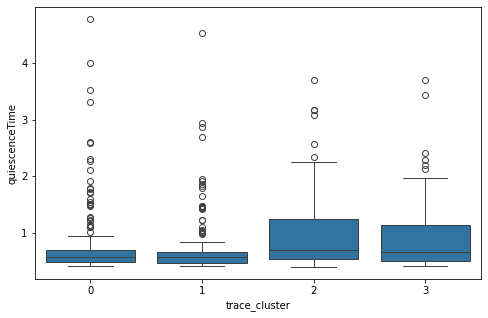

In [239]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import seaborn as sns

Y_pca = PCA(n_components=10).fit_transform(Y)  # reduce traces
clusters = KMeans(n_clusters=4, random_state=42).fit_predict(Y_pca)

df_trials["trace_cluster"] = clusters
sns.boxplot(x="trace_cluster", y="quiescenceTime", data=df_trials)


In [240]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# =====================================================
# 1. Align traces to feedback_times
# =====================================================
EVENT = "feedback_times"
event_times = np.array(df_trials[EVENT])
event_idx = np.searchsorted(array_timestamps, event_times)
psth_idx = np.tile(sample_window[:, np.newaxis], (1, n_trials))
psth_idx += event_idx

# Trial-aligned signals (n_trials × n_timepoints)
Y = df_nph.zdFF.values[psth_idx].T

# =====================================================
# 2. Features (predictors)
# =====================================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "feedbackType", "choice", "probabilityLeft"]
X = df_trials[features].fillna(0)

# =====================================================
# 3. PCA on trial traces
# =====================================================
pca = PCA(n_components=5)   # keep 5 PCs (adjust as needed)
Y_pca = pca.fit_transform(Y)

print(f"PCA explained variance: {np.sum(pca.explained_variance_ratio_):.2%}")

# =====================================================
# 4. Train-test split
# =====================================================
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_pca, test_size=0.2, random_state=42)

# =====================================================
# 5. Fit models
# =====================================================
models = {
    "Linear": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42)
}

results, preds = {}, {}

for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred_pca = model.predict(X_test)
    Y_pred = pca.inverse_transform(Y_pred_pca)  # reconstruct traces
    
    # Store
    preds[name] = (Y_pred, Y_test)
    
    # Metrics
    Y_true = pca.inverse_transform(Y_test)
    r2 = r2_score(Y_true, Y_pred, multioutput="variance_weighted")
    rmse = mean_squared_error(Y_true.flatten(), Y_pred.flatten(), squared=False)
    results[name] = {"R2": r2, "RMSE": rmse}

print("=== Model performance ===")
for name, m in results.items():
    print(f"{name}: R²={m['R2']:.3f}, RMSE={m['RMSE']:.4f}")

# =====================================================
# 6. Visualization: predicted vs actual traces
# =====================================================
n_show = 5  # number of example trials to plot
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])

fig, axes = plt.subplots(n_show, len(models), figsize=(12, 2*n_show), sharex=True, sharey=True)

for i, (name, (Y_pred, Y_test)) in enumerate(preds.items()):
    Y_true = pca.inverse_transform(Y_test)
    idx = np.random.choice(range(len(Y_true)), n_show, replace=False)
    
    for j, trial in enumerate(idx):
        ax = axes[j, i] if n_show > 1 else axes[i]
        ax.plot(time_axis, Y_true[trial], color="black", lw=2, label="Actual")
        ax.plot(time_axis, Y_pred[trial], color="red", lw=2, alpha=0.7, label="Predicted")
        if j == 0:
            ax.set_title(name)
        if i == 0:
            ax.set_ylabel(f"Trial {trial}")
        if j == n_show-1:
            ax.set_xlabel("Time (s)")

plt.suptitle("Predicted vs Actual Photometry Traces (aligned to feedback)", fontsize=14)
plt.tight_layout()
plt.show()


PCA explained variance: 73.42%


TypeError: got an unexpected keyword argument 'squared'

PCA explained variance: 73.42%
=== Model performance ===
Linear: R²=0.090, RMSE=0.6839
RandomForest: R²=0.072, RMSE=0.6909


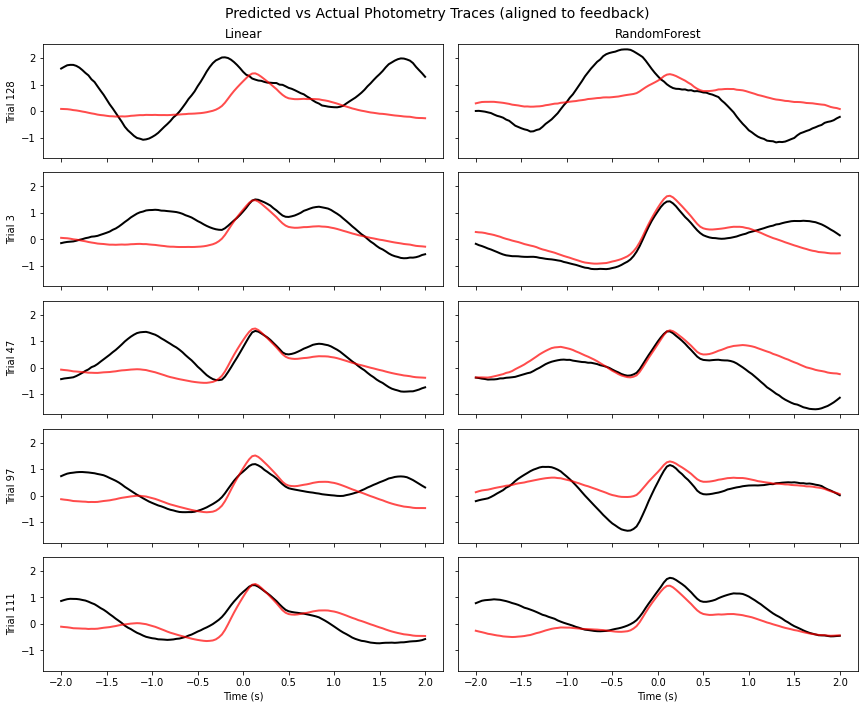

In [241]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# =====================================================
# 1. Align traces to feedback_times
# =====================================================
EVENT = "feedback_times"
event_times = np.array(df_trials[EVENT])
event_idx = np.searchsorted(array_timestamps, event_times)
psth_idx = np.tile(sample_window[:, np.newaxis], (1, n_trials))
psth_idx += event_idx

# Trial-aligned signals (n_trials × n_timepoints)
Y = df_nph.zdFF.values[psth_idx].T

# =====================================================
# 2. Features (predictors)
# =====================================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "feedbackType", "choice", "probabilityLeft"]
X = df_trials[features].fillna(0)

# =====================================================
# 3. PCA on trial traces
# =====================================================
pca = PCA(n_components=5)   # keep 5 PCs (adjust as needed)
Y_pca = pca.fit_transform(Y)

print(f"PCA explained variance: {np.sum(pca.explained_variance_ratio_):.2%}")

# =====================================================
# 4. Train-test split
# =====================================================
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_pca, test_size=0.2, random_state=42)

# =====================================================
# 5. Fit models
# =====================================================
models = {
    "Linear": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42)
}

results, preds = {}, {}

for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred_pca = model.predict(X_test)
    Y_pred = pca.inverse_transform(Y_pred_pca)  # reconstruct traces
    
    # Store
    preds[name] = (Y_pred, Y_test)
    
    
    # Metrics
    Y_true = pca.inverse_transform(Y_test)
    r2 = r2_score(Y_true, Y_pred, multioutput="variance_weighted")
    rmse = np.sqrt(mean_squared_error(Y_true.flatten(), Y_pred.flatten()))
    results[name] = {"R2": r2, "RMSE": rmse}


print("=== Model performance ===")
for name, m in results.items():
    print(f"{name}: R²={m['R2']:.3f}, RMSE={m['RMSE']:.4f}")

# =====================================================
# 6. Visualization: predicted vs actual traces
# =====================================================
n_show = 5  # number of example trials to plot
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])

fig, axes = plt.subplots(n_show, len(models), figsize=(12, 2*n_show), sharex=True, sharey=True)

for i, (name, (Y_pred, Y_test)) in enumerate(preds.items()):
    Y_true = pca.inverse_transform(Y_test)
    idx = np.random.choice(range(len(Y_true)), n_show, replace=False)
    
    for j, trial in enumerate(idx):
        ax = axes[j, i] if n_show > 1 else axes[i]
        ax.plot(time_axis, Y_true[trial], color="black", lw=2, label="Actual")
        ax.plot(time_axis, Y_pred[trial], color="red", lw=2, alpha=0.7, label="Predicted")
        if j == 0:
            ax.set_title(name)
        if i == 0:
            ax.set_ylabel(f"Trial {trial}")
        if j == n_show-1:
            ax.set_xlabel("Time (s)")

plt.suptitle("Predicted vs Actual Photometry Traces (aligned to feedback)", fontsize=14)
plt.tight_layout()
plt.show()


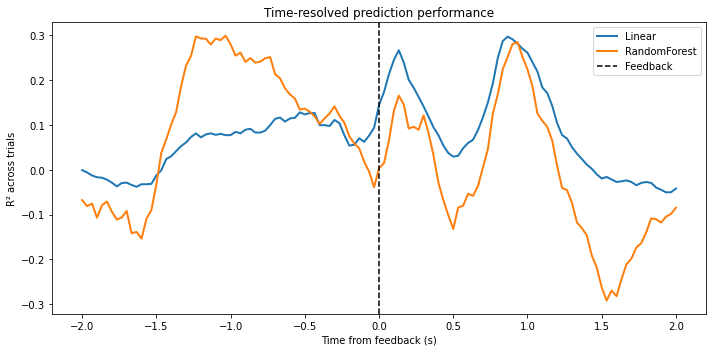

In [242]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# =====================================================
# Time-resolved R² across the trial
# =====================================================
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])

models = {
    "Linear": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42)
}

r2_curves = {}

for name, model in models.items():
    r2_tp = []
    for t in range(Y.shape[1]):  # loop over timepoints
        y_t = Y[:, t]  # signal at this timepoint across trials
        mask = ~np.isnan(y_t)
        if mask.sum() < 10:
            r2_tp.append(np.nan)
            continue
        
        X_masked = X.loc[mask]
        y_t = y_t[mask]

        # Train/test split per timepoint
        X_train, X_test, y_train, y_test = train_test_split(
            X_masked, y_t, test_size=0.2, random_state=42
        )
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2_tp.append(r2_score(y_test, y_pred))
    
    r2_curves[name] = np.array(r2_tp)

# =====================================================
# Visualization
# =====================================================
plt.figure(figsize=(10, 5))
for name, r2_vals in r2_curves.items():
    plt.plot(time_axis, r2_vals, label=f"{name}", lw=2)

plt.axvline(0, color="black", linestyle="--", label="Feedback")
plt.xlabel("Time from feedback (s)")
plt.ylabel("R² across trials")
plt.title("Time-resolved prediction performance")
plt.legend()
plt.tight_layout()
plt.show()


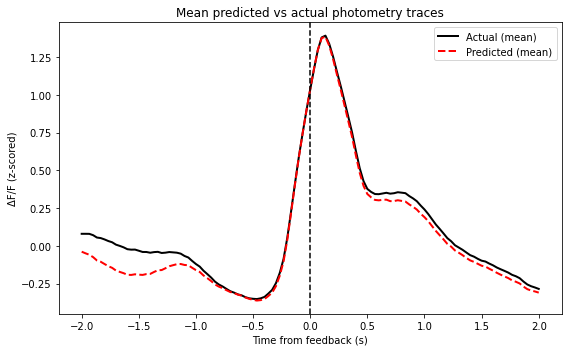

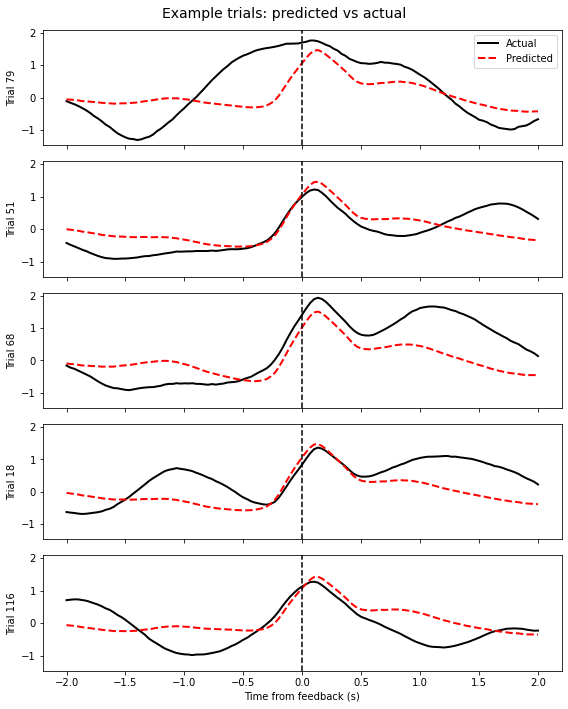

In [243]:
# Take best model from before (Linear here)
model = LinearRegression()
model.fit(X_train, Y_train)  # predicting PCA weights

# Predict PCA weights and reconstruct traces
Y_pred_pca = model.predict(X_test)
Y_pred = pca.inverse_transform(Y_pred_pca)   # predicted trial traces
Y_true = pca.inverse_transform(Y_test)       # actual trial traces

# Average across trials
mean_pred = Y_pred.mean(axis=0)
mean_true = Y_true.mean(axis=0)

time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])

# =====================================================
# Plot average predicted vs actual trace
# =====================================================
plt.figure(figsize=(8,5))
plt.plot(time_axis, mean_true, color="black", lw=2, label="Actual (mean)")
plt.plot(time_axis, mean_pred, color="red", lw=2, linestyle="--", label="Predicted (mean)")
plt.axvline(0, color="k", linestyle="--")
plt.xlabel("Time from feedback (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.title("Mean predicted vs actual photometry traces")
plt.legend()
plt.tight_layout()
plt.show()

# =====================================================
# Plot a few single trials
# =====================================================
n_show = 5
idx = np.random.choice(range(len(Y_true)), n_show, replace=False)

fig, axes = plt.subplots(n_show, 1, figsize=(8, 2*n_show), sharex=True, sharey=True)
for j, trial in enumerate(idx):
    axes[j].plot(time_axis, Y_true[trial], color="black", lw=2, label="Actual")
    axes[j].plot(time_axis, Y_pred[trial], color="red", lw=2, linestyle="--", label="Predicted")
    axes[j].axvline(0, color="k", linestyle="--")
    axes[j].set_ylabel(f"Trial {trial}")
    if j == 0:
        axes[j].legend()

axes[-1].set_xlabel("Time from feedback (s)")
plt.suptitle("Example trials: predicted vs actual", fontsize=14)
plt.tight_layout()
plt.show()


In [244]:
model = LinearRegression().fit(X_train, Y_train)
coeffs = pd.DataFrame(model.coef_, columns=X.columns)
print(coeffs.T)  # one column per PCA component



                        0         1         2         3         4
quiescenceTime   1.046925  0.610113  0.242969 -0.586051 -0.188684
reactionTime     0.084039 -0.004816  0.026125  0.064205  0.058750
trialTime        0.046432 -0.011212  0.005228 -0.011592  0.023485
allContrasts     0.882374  0.623704  0.250781 -1.116218  0.213015
feedbackType     0.847479  0.175311 -0.646660 -0.963648  0.787289
choice          -0.182404  0.112349 -0.514372 -0.296440 -0.398408
probabilityLeft  0.331716 -0.317101  0.425895 -0.637003  0.291942


In [245]:
rf = RandomForestRegressor(n_estimators=300, random_state=42)
rf.fit(X_train, Y_train)
importances = pd.Series(rf.feature_importances_, index=X.columns)
print(importances.sort_values(ascending=False))


quiescenceTime     0.270628
reactionTime       0.269526
trialTime          0.245602
allContrasts       0.088654
probabilityLeft    0.048585
feedbackType       0.040986
choice             0.036019
dtype: float64


PCA explained variance: 73.42%
=== Model performance ===
Linear: R²=0.088, RMSE=0.6847
RandomForest: R²=0.076, RMSE=0.6895


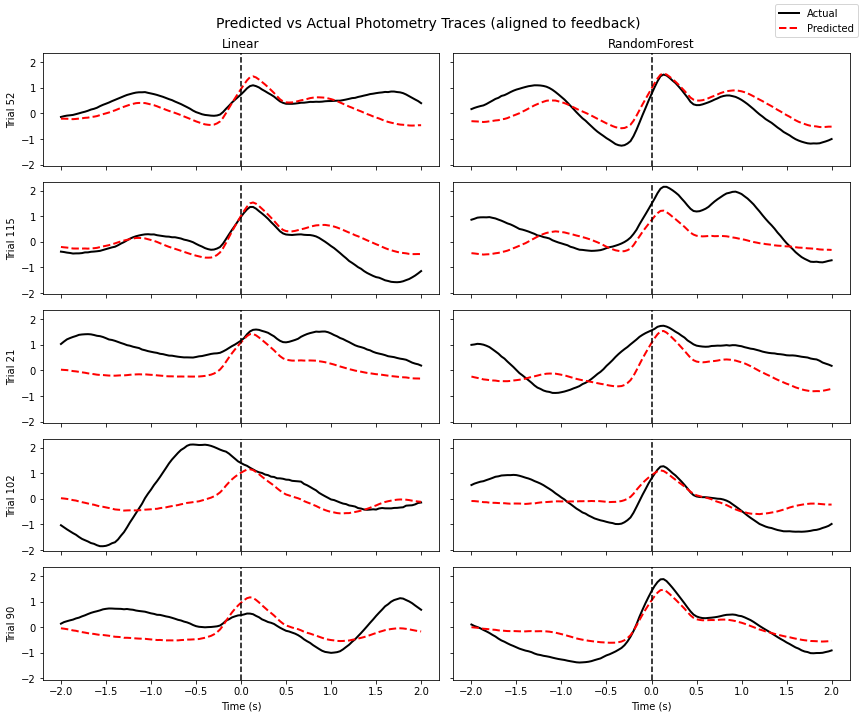

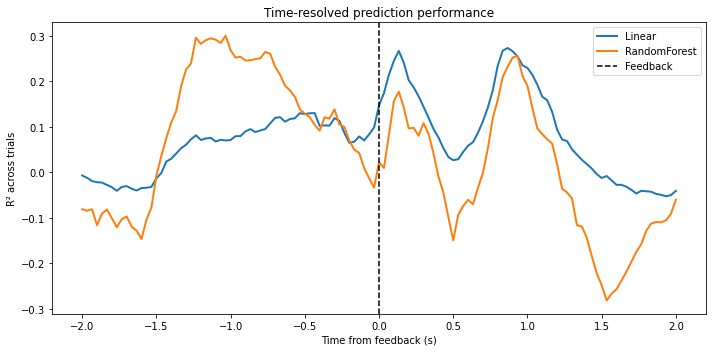

In [246]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# =====================================================
# 1. Align traces to feedback_times
# =====================================================
EVENT = "feedback_times"
event_times = np.array(df_trials[EVENT])
event_idx = np.searchsorted(array_timestamps, event_times)
psth_idx = np.tile(sample_window[:, np.newaxis], (1, n_trials))
psth_idx += event_idx

# Trial-aligned signals (n_trials × n_timepoints)
Y = df_nph.zdFF.values[psth_idx].T

# =====================================================
# 2. Define predictors (include allContrasts + allSContrasts)
# =====================================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft"]

X = df_trials[features].fillna(0)

# =====================================================
# 3. PCA on trial traces
# =====================================================
pca = PCA(n_components=5)   # adjust number of PCs if needed
Y_pca = pca.fit_transform(Y)

print(f"PCA explained variance: {np.sum(pca.explained_variance_ratio_):.2%}")

# =====================================================
# 4. Train-test split
# =====================================================
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_pca, test_size=0.2, random_state=42)

# =====================================================
# 5. Fit models
# =====================================================
models = {
    "Linear": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42)
}

results, preds = {}, {}

for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred_pca = model.predict(X_test)
    Y_pred = pca.inverse_transform(Y_pred_pca)  # reconstruct traces
    
    # Store predictions
    preds[name] = (Y_pred, Y_test)
    
    # Metrics
    Y_true = pca.inverse_transform(Y_test)
    r2 = r2_score(Y_true, Y_pred, multioutput="variance_weighted")
    rmse = np.sqrt(mean_squared_error(Y_true.flatten(), Y_pred.flatten()))
    results[name] = {"R2": r2, "RMSE": rmse}

print("=== Model performance ===")
for name, m in results.items():
    print(f"{name}: R²={m['R2']:.3f}, RMSE={m['RMSE']:.4f}")

# =====================================================
# 6. Visualization: predicted vs actual traces
# =====================================================
n_show = 5  # number of example trials to plot
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])

fig, axes = plt.subplots(n_show, len(models), figsize=(12, 2*n_show), sharex=True, sharey=True)

for i, (name, (Y_pred, Y_test)) in enumerate(preds.items()):
    Y_true = pca.inverse_transform(Y_test)
    idx = np.random.choice(range(len(Y_true)), n_show, replace=False)
    
    for j, trial in enumerate(idx):
        ax = axes[j, i] if n_show > 1 else axes[i]
        ax.plot(time_axis, Y_true[trial], color="black", lw=2, label="Actual")
        ax.plot(time_axis, Y_pred[trial], color="red", lw=2, linestyle="--", label="Predicted")
        ax.axvline(0, color="k", linestyle="--")
        if j == 0:
            ax.set_title(name)
        if i == 0:
            ax.set_ylabel(f"Trial {trial}")
        if j == n_show-1:
            ax.set_xlabel("Time (s)")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")
plt.suptitle("Predicted vs Actual Photometry Traces (aligned to feedback)", fontsize=14)
plt.tight_layout()
plt.show()

# =====================================================
# 7. Time-resolved R² across the trial
# =====================================================
r2_curves = {}

for name, model in models.items():
    r2_tp = []
    for t in range(Y.shape[1]):  # loop over timepoints
        y_t = Y[:, t]  # signal at this timepoint across trials
        mask = ~np.isnan(y_t)
        if mask.sum() < 10:
            r2_tp.append(np.nan)
            continue
        
        X_masked = X.loc[mask]
        y_t = y_t[mask]

        # Train/test split per timepoint
        X_train, X_test, y_train, y_test = train_test_split(
            X_masked, y_t, test_size=0.2, random_state=42
        )
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2_tp.append(r2_score(y_test, y_pred))
    
    r2_curves[name] = np.array(r2_tp)

plt.figure(figsize=(10, 5))
for name, r2_vals in r2_curves.items():
    plt.plot(time_axis, r2_vals, label=f"{name}", lw=2)

plt.axvline(0, color="black", linestyle="--", label="Feedback")
plt.xlabel("Time from feedback (s)")
plt.ylabel("R² across trials")
plt.title("Time-resolved prediction performance")
plt.legend()
plt.tight_layout()
plt.show()


PCA explained variance: 73.42%
=== Model performance ===
Linear: R²=0.088, RMSE=0.6847
RandomForest: R²=0.073, RMSE=0.6904


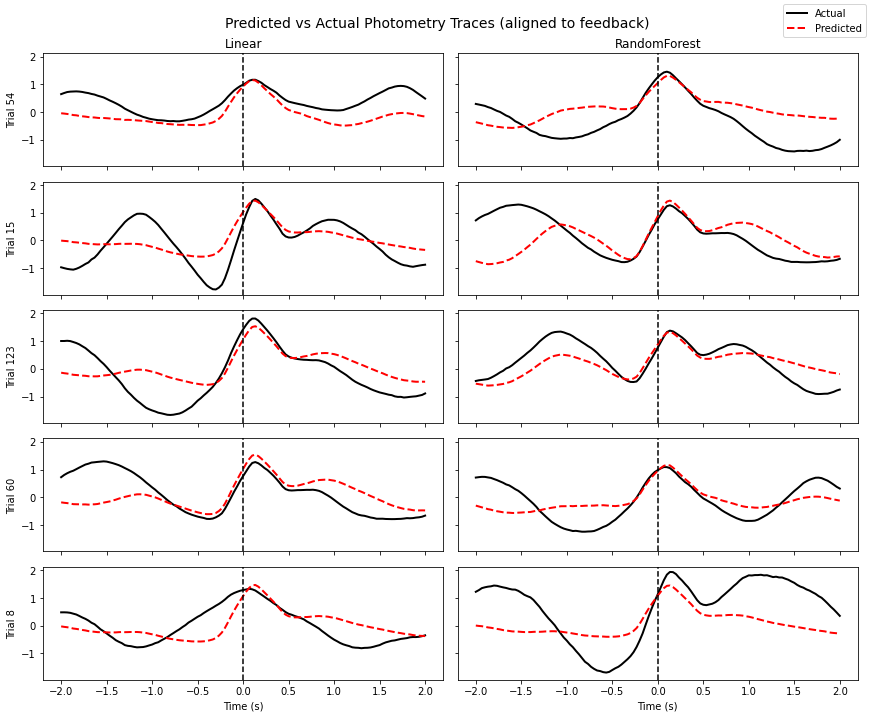

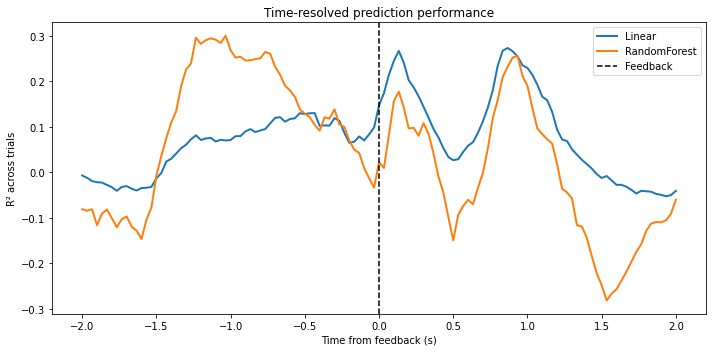

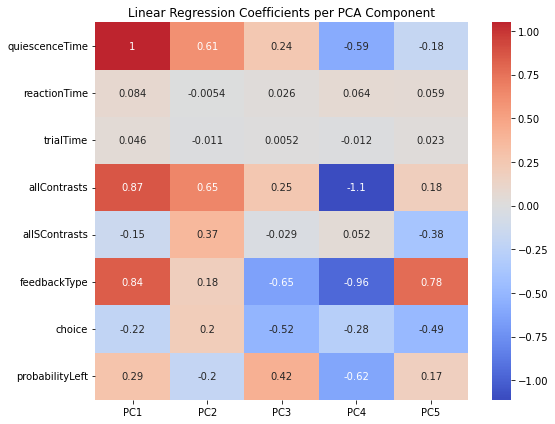

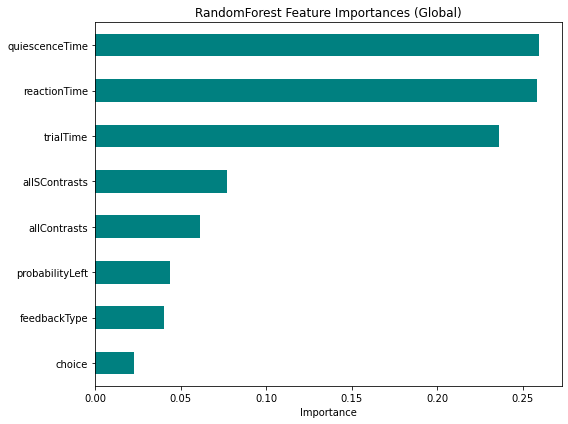

In [247]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# =====================================================
# 1. Align traces to feedback_times
# =====================================================
EVENT = "feedback_times"
event_times = np.array(df_trials[EVENT])
event_idx = np.searchsorted(array_timestamps, event_times)
psth_idx = np.tile(sample_window[:, np.newaxis], (1, n_trials))
psth_idx += event_idx

# Trial-aligned signals (n_trials × n_timepoints)
Y = df_nph.zdFF.values[psth_idx].T

# =====================================================
# 2. Define predictors (include both contrasts + feedbackType + choice)
# =====================================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft"]

X = df_trials[features].fillna(0)

# =====================================================
# 3. PCA on trial traces
# =====================================================
pca = PCA(n_components=5)   # adjust PCs if needed
Y_pca = pca.fit_transform(Y)

print(f"PCA explained variance: {np.sum(pca.explained_variance_ratio_):.2%}")

# =====================================================
# 4. Train-test split
# =====================================================
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_pca, test_size=0.2, random_state=42)

# =====================================================
# 5. Fit models
# =====================================================
models = {
    "Linear": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=300, random_state=42)
}

results, preds = {}, {}

for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred_pca = model.predict(X_test)
    Y_pred = pca.inverse_transform(Y_pred_pca)  # reconstruct traces
    
    # Store predictions
    preds[name] = (Y_pred, Y_test)
    
    # Metrics
    Y_true = pca.inverse_transform(Y_test)
    r2 = r2_score(Y_true, Y_pred, multioutput="variance_weighted")
    rmse = np.sqrt(mean_squared_error(Y_true.flatten(), Y_pred.flatten()))
    results[name] = {"R2": r2, "RMSE": rmse}

print("=== Model performance ===")
for name, m in results.items():
    print(f"{name}: R²={m['R2']:.3f}, RMSE={m['RMSE']:.4f}")

# =====================================================
# 6. Visualization: predicted vs actual traces
# =====================================================
n_show = 5
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])

fig, axes = plt.subplots(n_show, len(models), figsize=(12, 2*n_show), sharex=True, sharey=True)

for i, (name, (Y_pred, Y_test)) in enumerate(preds.items()):
    Y_true = pca.inverse_transform(Y_test)
    idx = np.random.choice(range(len(Y_true)), n_show, replace=False)
    
    for j, trial in enumerate(idx):
        ax = axes[j, i] if n_show > 1 else axes[i]
        ax.plot(time_axis, Y_true[trial], color="black", lw=2, label="Actual")
        ax.plot(time_axis, Y_pred[trial], color="red", lw=2, linestyle="--", label="Predicted")
        ax.axvline(0, color="k", linestyle="--")
        if j == 0:
            ax.set_title(name)
        if i == 0:
            ax.set_ylabel(f"Trial {trial}")
        if j == n_show-1:
            ax.set_xlabel("Time (s)")

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")
plt.suptitle("Predicted vs Actual Photometry Traces (aligned to feedback)", fontsize=14)
plt.tight_layout()
plt.show()

# =====================================================
# 7. Time-resolved R² across the trial
# =====================================================
r2_curves = {}

for name, model in models.items():
    r2_tp = []
    for t in range(Y.shape[1]):  # loop over timepoints
        y_t = Y[:, t]
        mask = ~np.isnan(y_t)
        if mask.sum() < 10:
            r2_tp.append(np.nan)
            continue
        
        X_masked = X.loc[mask]
        y_t = y_t[mask]

        X_train, X_test, y_train, y_test = train_test_split(
            X_masked, y_t, test_size=0.2, random_state=42
        )
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2_tp.append(r2_score(y_test, y_pred))
    
    r2_curves[name] = np.array(r2_tp)

plt.figure(figsize=(10, 5))
for name, r2_vals in r2_curves.items():
    plt.plot(time_axis, r2_vals, label=f"{name}", lw=2)

plt.axvline(0, color="black", linestyle="--", label="Feedback")
plt.xlabel("Time from feedback (s)")
plt.ylabel("R² across trials")
plt.title("Time-resolved prediction performance")
plt.legend()
plt.tight_layout()
plt.show()

# =====================================================
# 8. Feature importance analysis
# =====================================================

## --- Linear model coefficients (per PCA component)
lin_model = LinearRegression().fit(X_train, Y_train)
coef_df = pd.DataFrame(lin_model.coef_.T, index=X.columns, columns=[f"PC{i+1}" for i in range(Y_train.shape[1])])

plt.figure(figsize=(8,6))
sns.heatmap(coef_df, annot=True, cmap="coolwarm", center=0)
plt.title("Linear Regression Coefficients per PCA Component")
plt.tight_layout()
plt.show()

## --- RandomForest feature importances
rf_model = RandomForestRegressor(n_estimators=300, random_state=42).fit(X_train, Y_train)
importances = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=True)

plt.figure(figsize=(8,6))
importances.plot(kind="barh", color="teal")
plt.title("RandomForest Feature Importances (Global)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


In [248]:
1

1

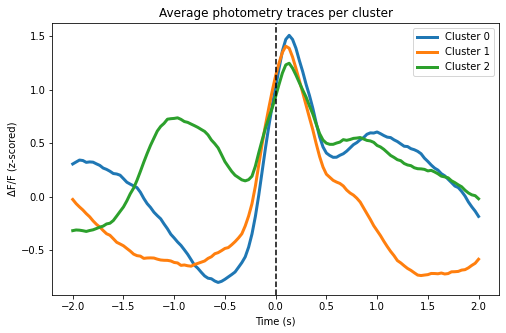

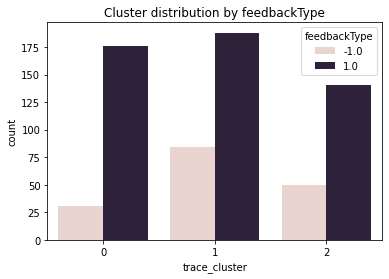

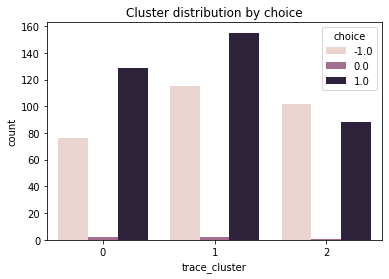

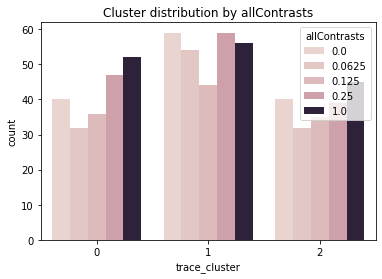

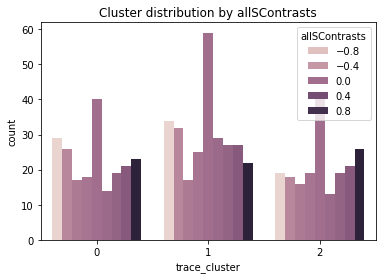

In [249]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce traces
pca_clust = PCA(n_components=10).fit_transform(Y)

# Cluster trial shapes
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(pca_clust)
df_trials["trace_cluster"] = clusters

# Plot average trace per cluster
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])
plt.figure(figsize=(8,5))
for c in np.unique(clusters):
    mean_trace = Y[clusters==c].mean(axis=0)
    plt.plot(time_axis, mean_trace, lw=3, label=f"Cluster {c}")
plt.axvline(0, color="k", linestyle="--")
plt.legend()
plt.title("Average photometry traces per cluster")
plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.show()

# Inspect how trial features explain clusters
for col in ["feedbackType", "choice", "allContrasts", "allSContrasts"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x="trace_cluster", hue=col, data=df_trials)
    plt.title(f"Cluster distribution by {col}")
    plt.show()


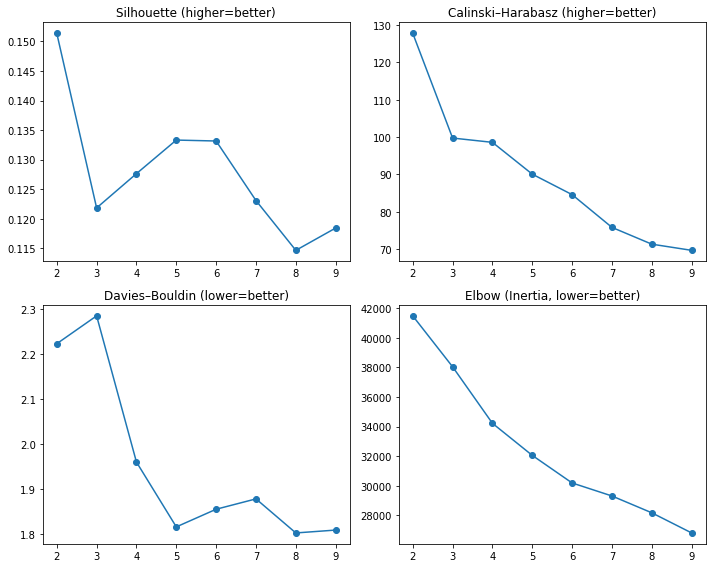

In [250]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

K = range(2, 10)  # try 2–9 clusters
sil_scores, ch_scores, db_scores, inertias = [], [], [], []

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(pca_clust)
    labels = kmeans.labels_
    
    sil_scores.append(silhouette_score(pca_clust, labels))
    ch_scores.append(calinski_harabasz_score(pca_clust, labels))
    db_scores.append(davies_bouldin_score(pca_clust, labels))
    inertias.append(kmeans.inertia_)

# Plot evaluation metrics
fig, axs = plt.subplots(2, 2, figsize=(10,8))

axs[0,0].plot(K, sil_scores, 'o-')
axs[0,0].set_title("Silhouette (higher=better)")

axs[0,1].plot(K, ch_scores, 'o-')
axs[0,1].set_title("Calinski–Harabasz (higher=better)")

axs[1,0].plot(K, db_scores, 'o-')
axs[1,0].set_title("Davies–Bouldin (lower=better)")

axs[1,1].plot(K, inertias, 'o-')
axs[1,1].set_title("Elbow (Inertia, lower=better)")

plt.tight_layout()
plt.show()


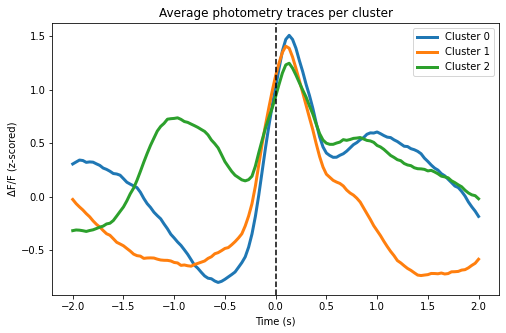

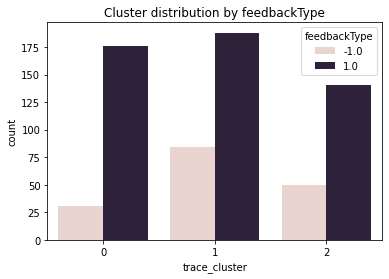

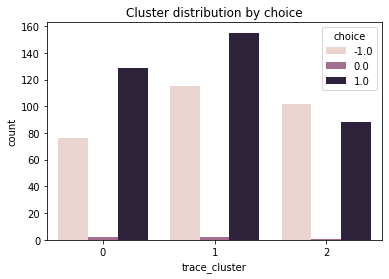

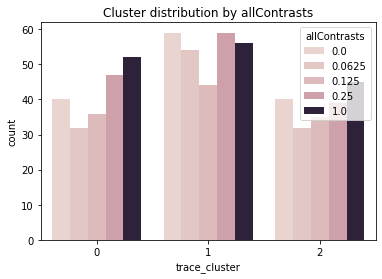

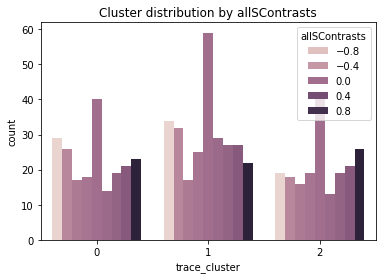

In [251]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce traces
pca_clust = PCA(n_components=10).fit_transform(Y)

# Cluster trial shapes
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(pca_clust)
df_trials["trace_cluster"] = clusters

# Plot average trace per cluster
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])
plt.figure(figsize=(8,5))
for c in np.unique(clusters):
    mean_trace = Y[clusters==c].mean(axis=0)
    plt.plot(time_axis, mean_trace, lw=3, label=f"Cluster {c}")
plt.axvline(0, color="k", linestyle="--")
plt.legend()
plt.title("Average photometry traces per cluster")
plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.show()

# Inspect how trial features explain clusters
for col in ["feedbackType", "choice", "allContrasts", "allSContrasts"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x="trace_cluster", hue=col, data=df_trials)
    plt.title(f"Cluster distribution by {col}")
    plt.show()


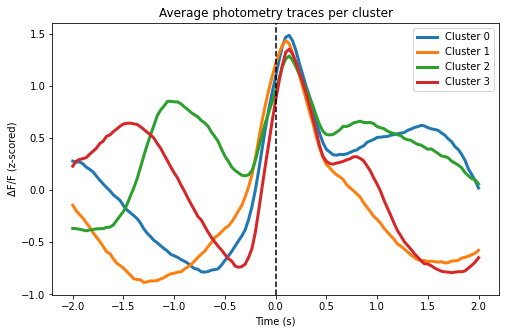

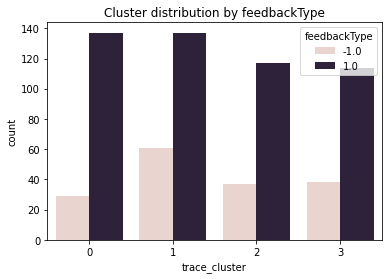

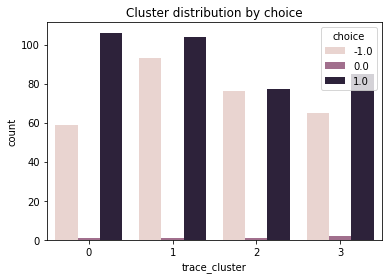

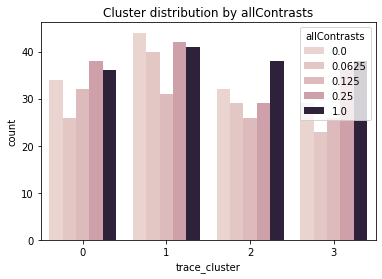

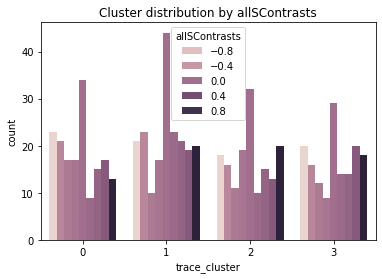

In [252]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce traces
pca_clust = PCA(n_components=10).fit_transform(Y)

# Cluster trial shapes
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(pca_clust)
df_trials["trace_cluster"] = clusters

# Plot average trace per cluster
time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], Y.shape[1])
plt.figure(figsize=(8,5))
for c in np.unique(clusters):
    mean_trace = Y[clusters==c].mean(axis=0)
    plt.plot(time_axis, mean_trace, lw=3, label=f"Cluster {c}")
plt.axvline(0, color="k", linestyle="--")
plt.legend()
plt.title("Average photometry traces per cluster")
plt.xlabel("Time (s)")
plt.ylabel("ΔF/F (z-scored)")
plt.show()

# Inspect how trial features explain clusters
for col in ["feedbackType", "choice", "allContrasts", "allSContrasts"]:
    plt.figure(figsize=(6,4))
    sns.countplot(x="trace_cluster", hue=col, data=df_trials)
    plt.title(f"Cluster distribution by {col}")
    plt.show()


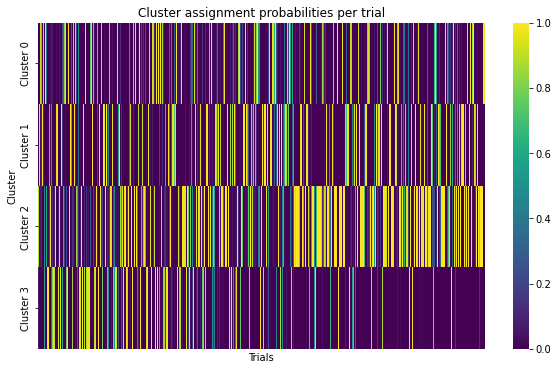

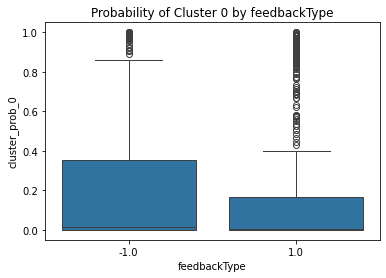

In [253]:
from sklearn.mixture import GaussianMixture

# Use the same PCA-reduced traces (pca_clust) you built earlier
n_clusters = 4
gmm = GaussianMixture(n_components=n_clusters, covariance_type="full", random_state=42)
gmm.fit(pca_clust)

# Probabilities per trial
probs = gmm.predict_proba(pca_clust)   # shape (n_trials, n_clusters)
assignments = gmm.predict(pca_clust)   # hard cluster labels

df_trials["gmm_cluster"] = assignments
for k in range(n_clusters):
    df_trials[f"cluster_prob_{k}"] = probs[:, k]

# =====================================================
# Visualization 1: probability heatmap per trial
# =====================================================
import seaborn as sns
plt.figure(figsize=(10,6))
sns.heatmap(probs.T, cmap="viridis", cbar=True, xticklabels=False, yticklabels=[f"Cluster {i}" for i in range(n_clusters)])
plt.xlabel("Trials")
plt.ylabel("Cluster")
plt.title("Cluster assignment probabilities per trial")
plt.show()

# =====================================================
# Visualization 2: scatter of trial features vs cluster
# Example: feedbackType vs cluster probability
# =====================================================
plt.figure(figsize=(6,4))
sns.boxplot(x="feedbackType", y="cluster_prob_0", data=df_trials)
plt.title("Probability of Cluster 0 by feedbackType")
plt.show()


In [254]:
df_trials

,goCueTrigger_times,stimOnTrigger_times,allContrasts,allSContrasts,stimOffTrigger_times,stimOff_times,quiescencePeriod,included,goCue_times,response_times,...,q_value,q_bias,cluster_kmeans,cluster_gmm,trace_cluster,gmm_cluster,cluster_prob_0,cluster_prob_1,cluster_prob_2,cluster_prob_3
0,3.808500,3.708400,0.0625,0.0625,5.261800,5.313200,0.522661,True,3.827400,4.261700,...,0.000000,0.000000,NaN,NaN,2,2,1.447028e-06,4.440893e-10,0.900727,9.927186e-02
1,7.115400,7.050000,0.2500,-0.2500,8.476000,8.531800,0.502361,True,7.144800,7.475900,...,0.000000,-0.200000,1.0,1.0,0,1,1.727088e-03,9.749392e-01,0.023269,6.430825e-05
2,10.246199,10.178199,1.0000,-1.0000,11.563299,11.629799,0.422579,True,10.274199,10.563199,...,0.200000,0.000000,2.0,2.0,3,3,5.291952e-04,5.236305e-07,0.006345,9.931251e-01
3,14.381799,14.327599,0.0000,0.0000,18.144499,18.215199,0.579127,True,14.411699,16.144399,...,0.360000,0.160000,2.0,2.0,0,0,9.034097e-01,4.387262e-02,0.052718,2.177908e-09
4,20.296199,20.257299,0.0000,0.0000,23.152499,23.195899,0.646554,True,20.326399,21.152399,...,0.088000,-0.112000,0.0,0.0,1,0,7.572736e-01,1.112732e-01,0.131453,2.017862e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,4420.072798,4420.012398,0.0000,0.0000,4449.010798,4449.070198,0.527323,False,4420.100998,4448.010698,...,0.911747,-1.259989,1.0,1.0,2,2,1.597352e-05,4.059439e-26,0.999981,3.443498e-06
666,4450.788898,4450.716198,0.1250,-0.1250,4459.317998,4459.388498,0.446729,False,4450.817798,4457.317898,...,0.929398,-1.277640,3.0,3.0,3,2,1.949735e-12,2.220497e-09,0.999898,1.020114e-04
667,4461.270198,4461.202798,1.0000,1.0000,4463.938698,4464.005198,0.654796,False,4461.297098,4462.938598,...,0.543518,-0.891760,0.0,0.0,1,1,3.417486e-04,9.994903e-01,0.000168,1.336525e-07
668,4465.769999,4465.703399,0.0625,0.0625,4470.759199,4470.819499,0.529351,False,4465.798599,4468.759099,...,-0.348242,-0.983056,1.0,1.0,1,0,9.768808e-01,1.558315e-02,0.007536,3.105203e-20


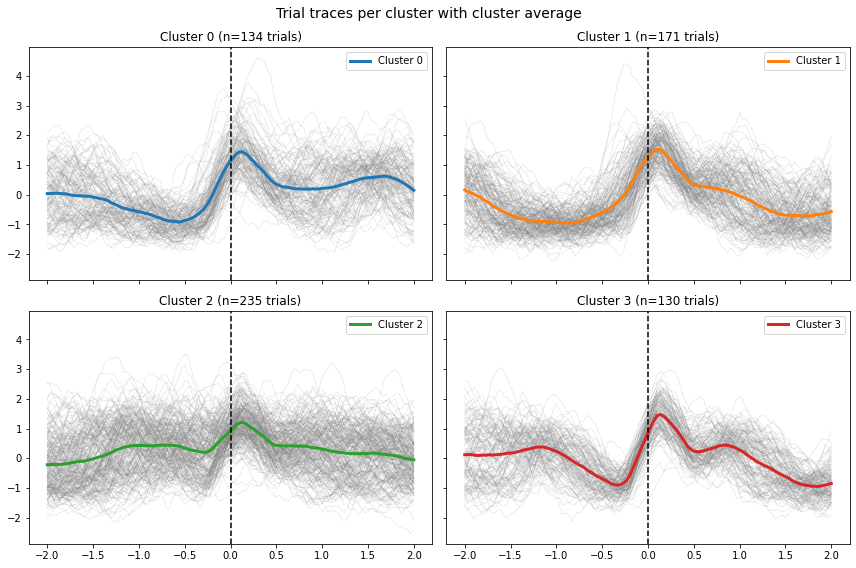

In [255]:
# Assume:
# - Y: trial-aligned traces (n_trials × n_timepoints)
# - assignments: hard cluster labels from KMeans or GMM
# - time_axis: np.linspace(...) already defined
# - n_clusters: number of clusters (4 here)

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)

for k, ax in enumerate(axes.flatten()):
    mask = assignments == k
    if mask.sum() == 0:
        continue
    
    # Plot all trial traces in cluster k
    ax.plot(time_axis, Y[mask].T, color="gray", alpha=0.2, lw=0.7)
    
    # Plot cluster average trace
    mean_trace = Y[mask].mean(axis=0)
    ax.plot(time_axis, mean_trace, color=colors[k], lw=3, label=f"Cluster {k}")
    
    # Vertical line at feedback
    ax.axvline(0, color="k", linestyle="--")
    
    ax.set_title(f"Cluster {k} (n={mask.sum()} trials)")
    ax.legend()

fig.suptitle("Trial traces per cluster with cluster average", fontsize=14)
plt.tight_layout()
plt.show()


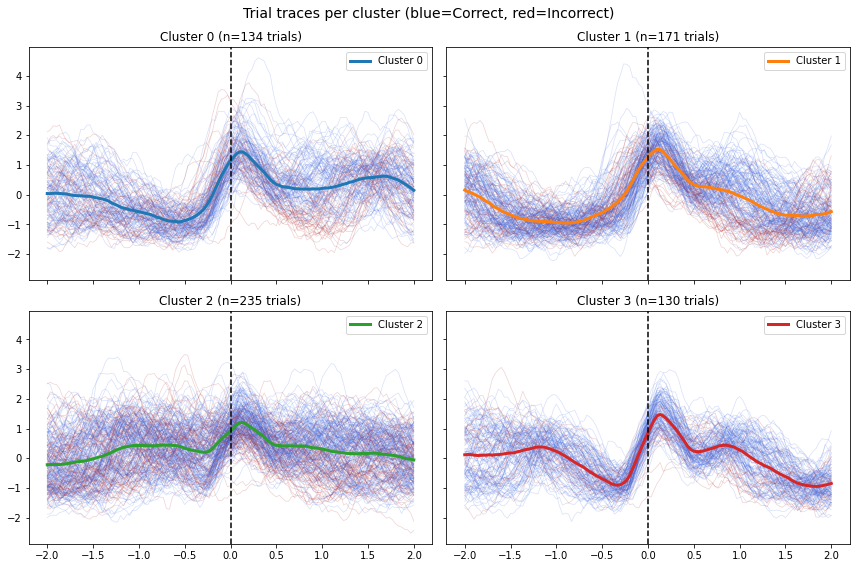

In [256]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
trial_colors = {1: "royalblue", -1: "firebrick"}  # correct vs incorrect

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)

for k, ax in enumerate(axes.flatten()):
    mask = assignments == k
    if mask.sum() == 0:
        continue
    
    # Plot all trial traces in cluster k, colored by feedbackType
    for i, trial_idx in enumerate(np.where(mask)[0]):
        fb = df_trials.iloc[trial_idx]["feedbackType"]
        color = trial_colors.get(fb, "gray")  # fallback = gray if NaN
        ax.plot(time_axis, Y[trial_idx], color=color, alpha=0.2, lw=0.7)
    
    # Cluster average
    mean_trace = Y[mask].mean(axis=0)
    ax.plot(time_axis, mean_trace, color=colors[k], lw=3, label=f"Cluster {k}")
    
    ax.axvline(0, color="k", linestyle="--")
    ax.set_title(f"Cluster {k} (n={mask.sum()} trials)")
    ax.legend()

fig.suptitle("Trial traces per cluster (blue=Correct, red=Incorrect)", fontsize=14)
plt.tight_layout()
plt.show()


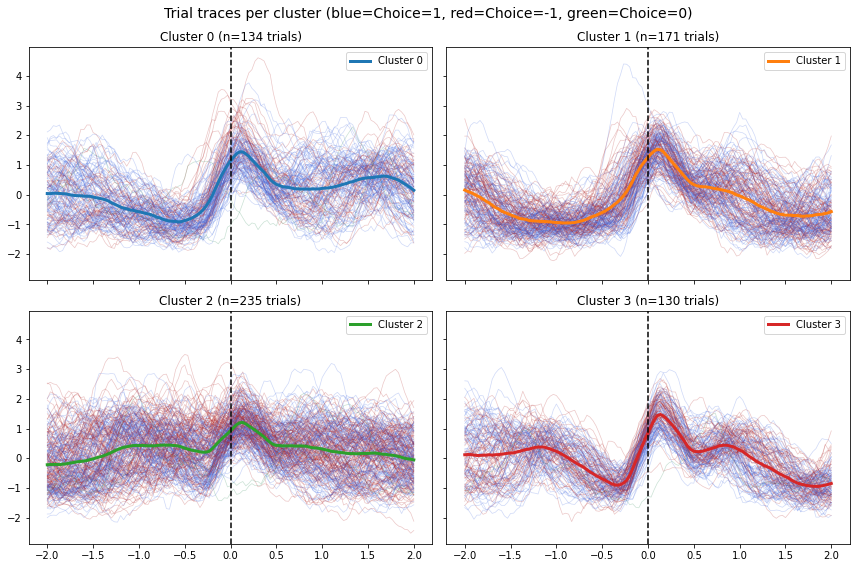

In [257]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

# Choice color mapping
choice_colors = {1: "royalblue", -1: "firebrick", 0: "seagreen"}

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)

for k, ax in enumerate(axes.flatten()):
    mask = assignments == k
    if mask.sum() == 0:
        continue
    
    # Plot all trial traces in cluster k, colored by choice
    for trial_idx in np.where(mask)[0]:
        choice_val = df_trials.iloc[trial_idx]["choice"]
        color = choice_colors.get(choice_val, "gray")  # fallback if NaN
        ax.plot(time_axis, Y[trial_idx], color=color, alpha=0.25, lw=0.7)
    
    # Cluster average trace
    mean_trace = Y[mask].mean(axis=0)
    ax.plot(time_axis, mean_trace, color=colors[k], lw=3, label=f"Cluster {k}")
    
    ax.axvline(0, color="k", linestyle="--")
    ax.set_title(f"Cluster {k} (n={mask.sum()} trials)")
    ax.legend()

fig.suptitle("Trial traces per cluster (blue=Choice=1, red=Choice=-1, green=Choice=0)", fontsize=14)
plt.tight_layout()
plt.show()


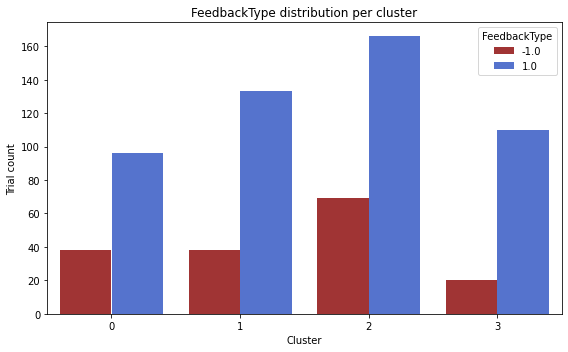

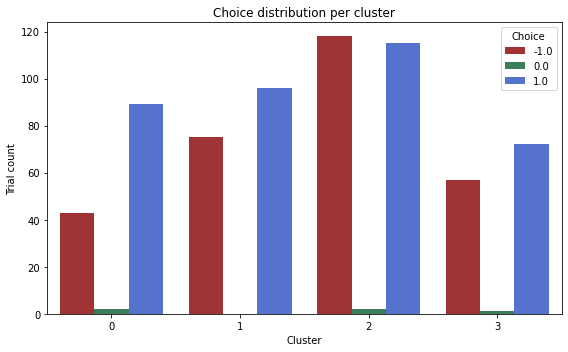

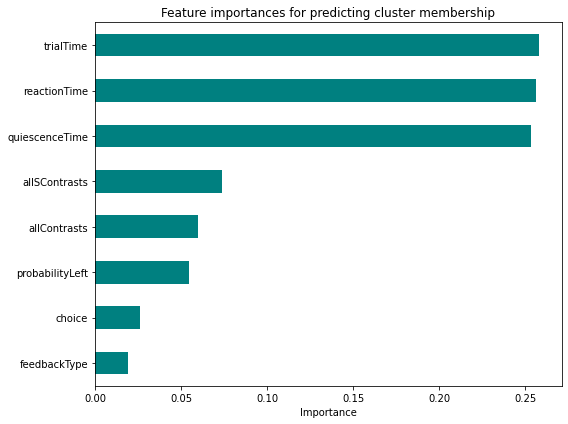

In [258]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# =====================================================
# 1. Barplots of trial composition
# =====================================================
plt.figure(figsize=(8,5))
sns.countplot(x="gmm_cluster", hue="feedbackType", data=df_trials,
              palette={1:"royalblue", -1:"firebrick"})
plt.title("FeedbackType distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="FeedbackType")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8,5))
sns.countplot(x="gmm_cluster", hue="choice", data=df_trials,
              palette={1:"royalblue", -1:"firebrick", 0:"seagreen"})
plt.title("Choice distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="Choice")
plt.tight_layout()
plt.show()

# =====================================================
# 2. Feature importance for cluster membership
# =====================================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft"]

X = df_trials[features].fillna(0)
y = df_trials["gmm_cluster"]   # cluster labels from GMM

rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X, y)

importances = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=True)

plt.figure(figsize=(8,6))
importances.plot(kind="barh", color="teal")
plt.title("Feature importances for predicting cluster membership")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


In [259]:
# Create new column: feedbackType_choice
df_trials["feedback_choice"] = df_trials["feedbackType"].astype(str) + "_" + df_trials["choice"].astype(str)

# Example values: "1_1", "1_-1", "-1_1", "-1_0", etc.
print(df_trials["feedback_choice"].value_counts())


feedback_choice
1.0_1.0      273
1.0_-1.0     232
-1.0_1.0      99
-1.0_-1.0     61
-1.0_0.0       5
Name: count, dtype: int64


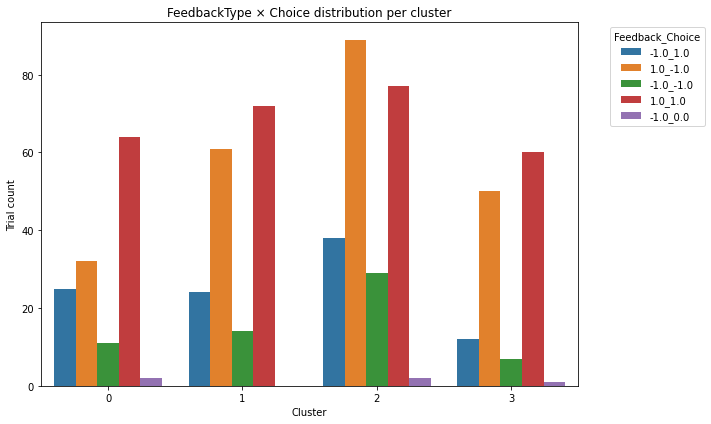

In [260]:
plt.figure(figsize=(10,6))
sns.countplot(x="gmm_cluster", hue="feedback_choice", data=df_trials, palette="tab10")
plt.title("FeedbackType × Choice distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="Feedback_Choice", bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()


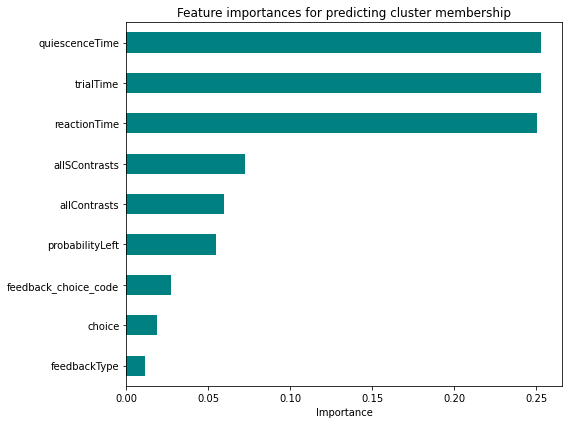

In [261]:
from sklearn.preprocessing import LabelEncoder

features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft"]

# Add combo column (encoded)
le = LabelEncoder()
df_trials["feedback_choice_code"] = le.fit_transform(df_trials["feedback_choice"])
features.append("feedback_choice_code")

X = df_trials[features].fillna(0)
y = df_trials["gmm_cluster"]

# Train classifier
rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X, y)

# Feature importances
importances = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=True)

plt.figure(figsize=(8,6))
importances.plot(kind="barh", color="teal")
plt.title("Feature importances for predicting cluster membership")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


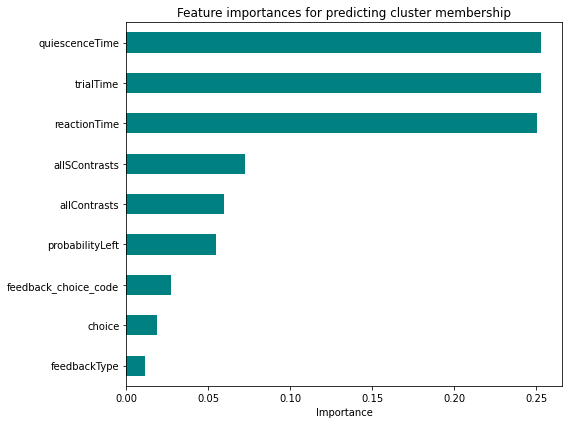

In [262]:
from sklearn.preprocessing import LabelEncoder

features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft"]

# Add combo column (encoded)
le = LabelEncoder()
df_trials["feedback_choice_code"] = le.fit_transform(df_trials["feedback_choice"])
features.append("feedback_choice_code")

X = df_trials[features].fillna(0)
y = df_trials["gmm_cluster"]

# Train classifier
rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X, y)

# Feature importances
importances = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=True)

plt.figure(figsize=(8,6))
importances.plot(kind="barh", color="teal")
plt.title("Feature importances for predicting cluster membership")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


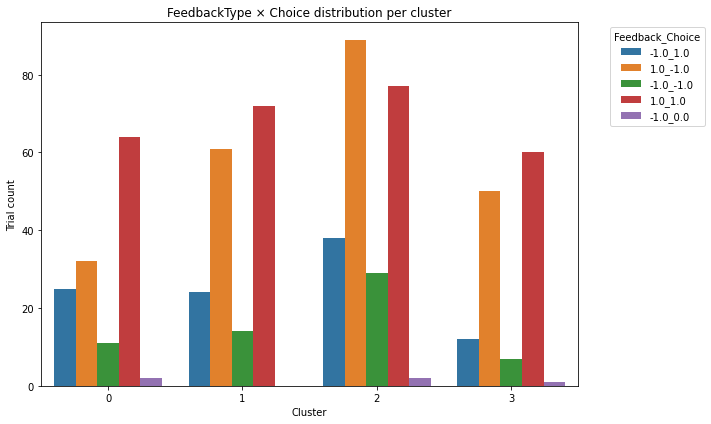

=== Trial composition by cluster (percentages) ===
feedback_choice  -1.0_-1.0  -1.0_0.0  -1.0_1.0  1.0_-1.0  1.0_1.0
gmm_cluster                                                      
0                      8.2       1.5      18.7      23.9     47.8
1                      8.2       0.0      14.0      35.7     42.1
2                     12.3       0.9      16.2      37.9     32.8
3                      5.4       0.8       9.2      38.5     46.2


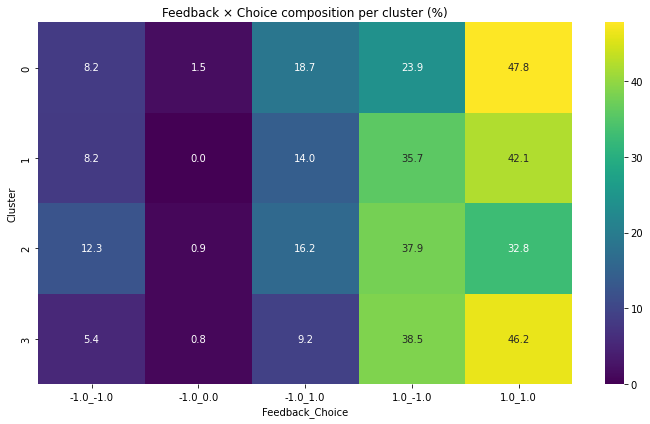

In [263]:
# =====================================================
# 1. Create combo column
# =====================================================
df_trials["feedback_choice"] = df_trials["feedbackType"].astype(str) + "_" + df_trials["choice"].astype(str)

# =====================================================
# 2. Barplot of combo distributions
# =====================================================
plt.figure(figsize=(10,6))
sns.countplot(x="gmm_cluster", hue="feedback_choice", data=df_trials, palette="tab10")
plt.title("FeedbackType × Choice distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="Feedback_Choice", bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

# =====================================================
# 3. Summary table of % composition
# =====================================================
cluster_combo_table = (
    df_trials.groupby(["gmm_cluster", "feedback_choice"])
             .size()
             .unstack(fill_value=0)
)

# Convert counts to percentages within each cluster
cluster_combo_pct = cluster_combo_table.div(cluster_combo_table.sum(axis=1), axis=0) * 100

print("=== Trial composition by cluster (percentages) ===")
print(cluster_combo_pct.round(1))

# Optional: display heatmap
plt.figure(figsize=(10,6))
sns.heatmap(cluster_combo_pct, annot=True, fmt=".1f", cmap="viridis")
plt.title("Feedback × Choice composition per cluster (%)")
plt.xlabel("Feedback_Choice")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()


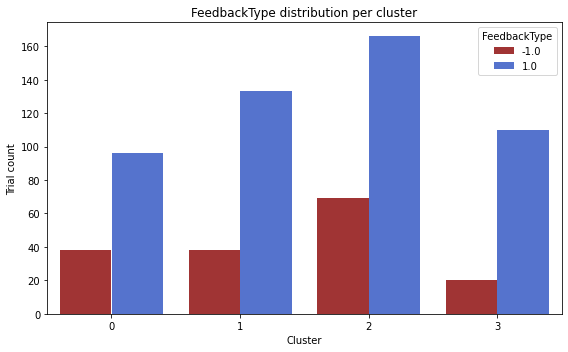

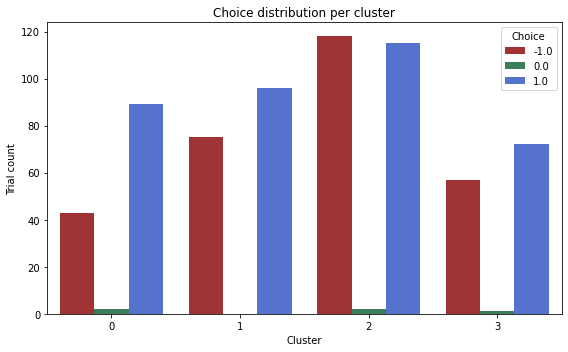

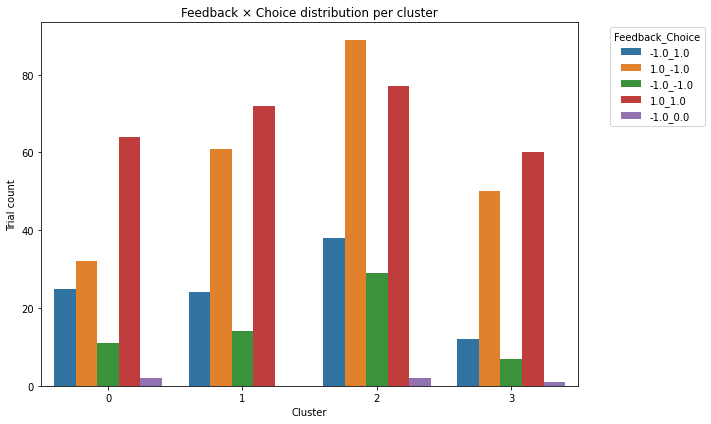

=== Trial composition by cluster (percentages) ===
feedback_choice  -1.0_-1.0  -1.0_0.0  -1.0_1.0  1.0_-1.0  1.0_1.0
gmm_cluster                                                      
0                      8.2       1.5      18.7      23.9     47.8
1                      8.2       0.0      14.0      35.7     42.1
2                     12.3       0.9      16.2      37.9     32.8
3                      5.4       0.8       9.2      38.5     46.2


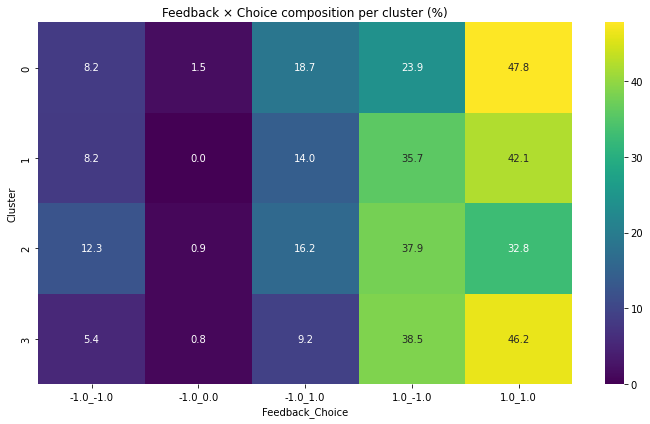

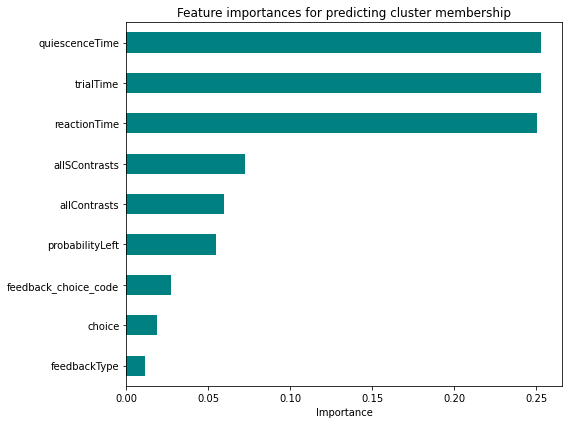

In [264]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# =====================================================
# 1. Create combo column
# =====================================================
df_trials["feedback_choice"] = df_trials["feedbackType"].astype(str) + "_" + df_trials["choice"].astype(str)

# Encode combo for ML
le = LabelEncoder()
df_trials["feedback_choice_code"] = le.fit_transform(df_trials["feedback_choice"])

# =====================================================
# 2. Barplots of trial composition per cluster
# =====================================================
# FeedbackType
plt.figure(figsize=(8,5))
sns.countplot(x="gmm_cluster", hue="feedbackType", data=df_trials,
              palette={1:"royalblue", -1:"firebrick"})
plt.title("FeedbackType distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="FeedbackType")
plt.tight_layout()
plt.show()

# Choice
plt.figure(figsize=(8,5))
sns.countplot(x="gmm_cluster", hue="choice", data=df_trials,
              palette={1:"royalblue", -1:"firebrick", 0:"seagreen"})
plt.title("Choice distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="Choice")
plt.tight_layout()
plt.show()

# Feedback × Choice combo
plt.figure(figsize=(10,6))
sns.countplot(x="gmm_cluster", hue="feedback_choice", data=df_trials, palette="tab10")
plt.title("Feedback × Choice distribution per cluster")
plt.xlabel("Cluster")
plt.ylabel("Trial count")
plt.legend(title="Feedback_Choice", bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

# =====================================================
# 3. Summary table of % composition
# =====================================================
cluster_combo_table = (
    df_trials.groupby(["gmm_cluster", "feedback_choice"])
             .size()
             .unstack(fill_value=0)
)

cluster_combo_pct = cluster_combo_table.div(cluster_combo_table.sum(axis=1), axis=0) * 100

print("=== Trial composition by cluster (percentages) ===")
print(cluster_combo_pct.round(1))

# Heatmap visualization
plt.figure(figsize=(10,6))
sns.heatmap(cluster_combo_pct, annot=True, fmt=".1f", cmap="viridis")
plt.title("Feedback × Choice composition per cluster (%)")
plt.xlabel("Feedback_Choice")
plt.ylabel("Cluster")
plt.tight_layout()
plt.show()

# =====================================================
# 4. Feature importance for cluster membership
# =====================================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft",
            "feedback_choice_code"]

X = df_trials[features].fillna(0)
y = df_trials["gmm_cluster"]

rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X, y)

importances = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=True)

plt.figure(figsize=(8,6))
importances.plot(kind="barh", color="teal")
plt.title("Feature importances for predicting cluster membership")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


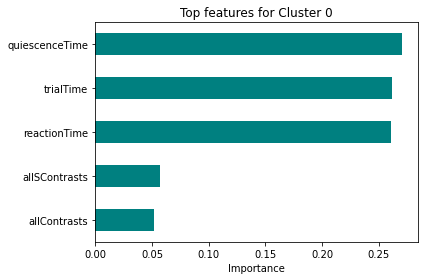

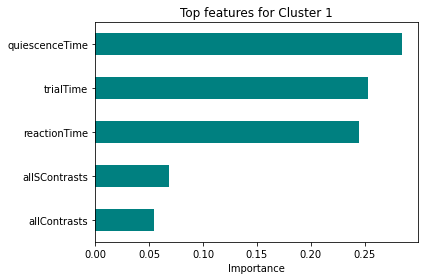

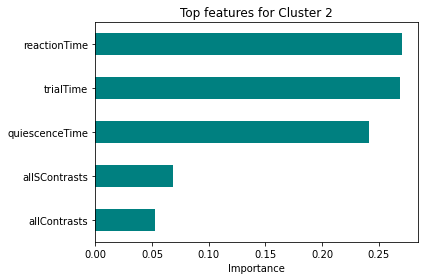

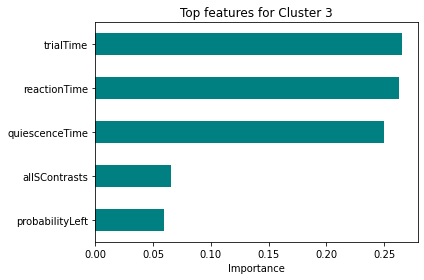

=== Top 3 features per cluster ===
                        0             1               2
Cluster 0  quiescenceTime     trialTime    reactionTime
Cluster 1  quiescenceTime     trialTime    reactionTime
Cluster 2    reactionTime     trialTime  quiescenceTime
Cluster 3       trialTime  reactionTime  quiescenceTime


In [265]:
from sklearn.ensemble import RandomForestClassifier

# Feature set
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft",
            "feedback_choice_code"]

X = df_trials[features].fillna(0)
y = df_trials["gmm_cluster"]

# Global RF (already done above)
rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X, y)

# === Per-cluster feature importances ===
per_cluster_importances = {}

for k in sorted(y.unique()):
    # Binary target: cluster k vs rest
    y_bin = (y == k).astype(int)
    
    rf = RandomForestClassifier(n_estimators=500, random_state=42)
    rf.fit(X, y_bin)
    
    importances = pd.Series(rf.feature_importances_, index=X.columns)
    importances = importances.sort_values(ascending=False)
    
    per_cluster_importances[k] = importances
    
    # Plot top 5 features
    plt.figure(figsize=(6,4))
    importances.head(5).sort_values().plot(kind="barh", color="teal")
    plt.title(f"Top features for Cluster {k}")
    plt.xlabel("Importance")
    plt.tight_layout()
    plt.show()

# === Summary table (top 3 features per cluster) ===
summary = pd.DataFrame({
    f"Cluster {k}": per_cluster_importances[k].head(3).index.tolist()
    for k in per_cluster_importances
}).T

print("=== Top 3 features per cluster ===")
print(summary)


<Axes: xlabel='gmm_cluster', ylabel='reactionTime'>

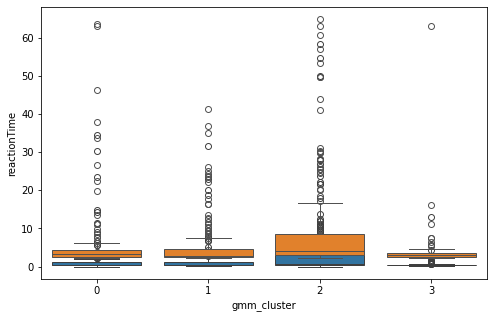

In [266]:
sns.boxplot(x="gmm_cluster", y="reactionTime", data=df_trials)
sns.boxplot(x="gmm_cluster", y="trialTime", data=df_trials)


<ipython-input-267-2c50ce45d12c>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-267-2c50ce45d12c>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


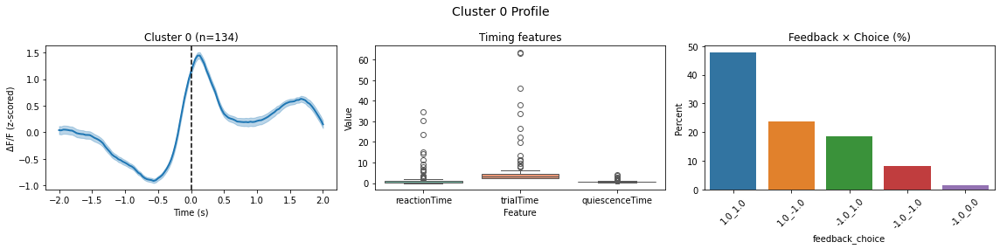

<ipython-input-267-2c50ce45d12c>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-267-2c50ce45d12c>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


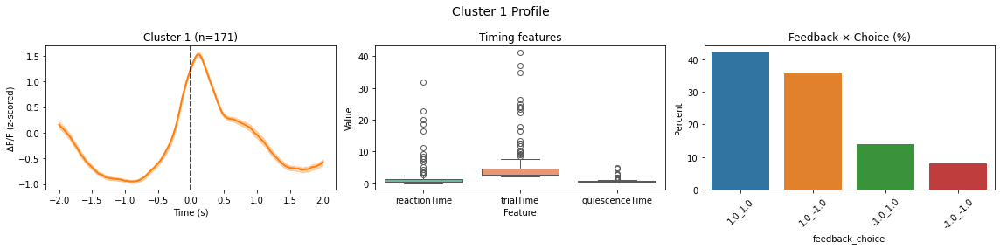

<ipython-input-267-2c50ce45d12c>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-267-2c50ce45d12c>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


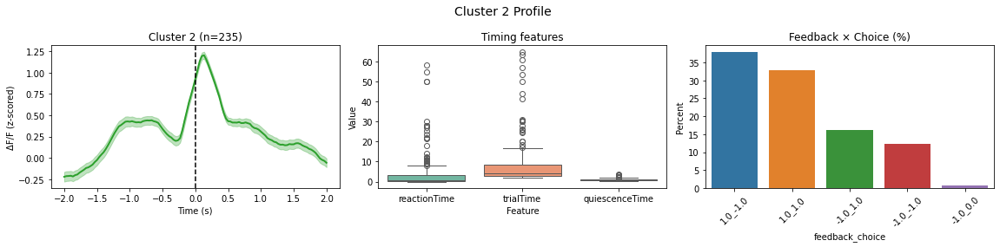

<ipython-input-267-2c50ce45d12c>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-267-2c50ce45d12c>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


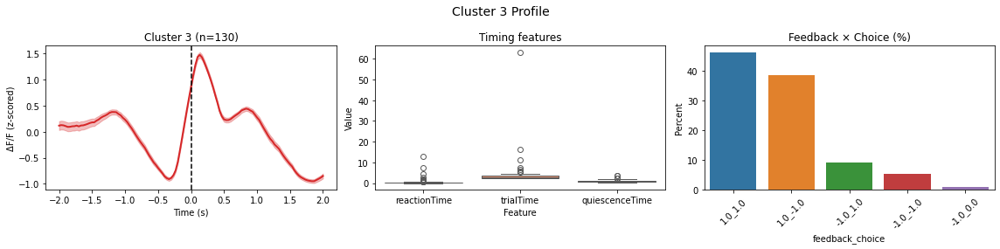

In [267]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

n_clusters = df_trials["gmm_cluster"].nunique()
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

for k in range(n_clusters):
    mask = df_trials["gmm_cluster"] == k
    n_trials = mask.sum()
    
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    
    # --- (1) Average trace with SEM ---
    cluster_traces = Y[mask]
    mean_trace = cluster_traces.mean(axis=0)
    sem_trace = cluster_traces.std(axis=0) / np.sqrt(n_trials)
    
    axes[0].plot(time_axis, mean_trace, color=colors[k], lw=2, label=f"Cluster {k}")
    axes[0].fill_between(time_axis, mean_trace - sem_trace, mean_trace + sem_trace,
                         color=colors[k], alpha=0.3)
    axes[0].axvline(0, color="k", linestyle="--")
    axes[0].set_title(f"Cluster {k} (n={n_trials})")
    axes[0].set_xlabel("Time (s)")
    axes[0].set_ylabel("ΔF/F (z-scored)")
    
    # --- (2) Boxplots for timing features ---
    timing_feats = ["reactionTime", "trialTime", "quiescenceTime"]
    sub = df_trials.loc[mask, timing_feats].melt(var_name="Feature", value_name="Value")
    sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
    axes[1].set_title("Timing features")
    
    # --- (3) Barplot for feedback × choice composition ---
    comp = df_trials.loc[mask, "feedback_choice"].value_counts(normalize=True) * 100
    sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")
    axes[2].set_title("Feedback × Choice (%)")
    axes[2].set_ylabel("Percent")
    axes[2].set_xlabel("feedback_choice")
    axes[2].tick_params(axis="x", rotation=45)
    
    plt.suptitle(f"Cluster {k} Profile", fontsize=14)
    plt.tight_layout()
    plt.show()


<ipython-input-268-eb0a96022a95>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-268-eb0a96022a95>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


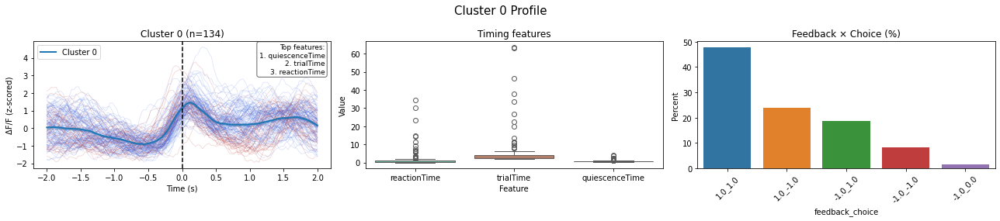

<ipython-input-268-eb0a96022a95>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-268-eb0a96022a95>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


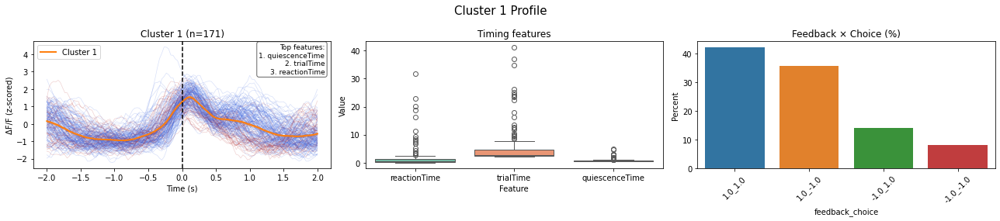

<ipython-input-268-eb0a96022a95>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-268-eb0a96022a95>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


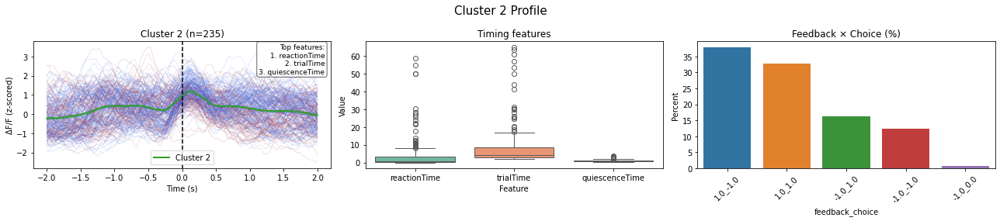

<ipython-input-268-eb0a96022a95>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-268-eb0a96022a95>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


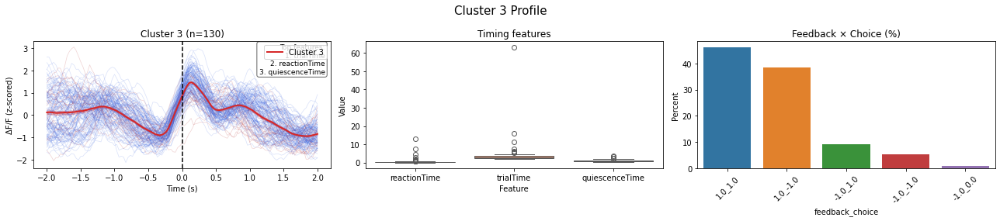

In [268]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
trial_colors = {1: "royalblue", -1: "firebrick"}

# Precompute per-cluster top 3 features
top_features_dict = {}
for k in sorted(df_trials["gmm_cluster"].unique()):
    y_bin = (df_trials["gmm_cluster"] == k).astype(int)
    rf = RandomForestClassifier(n_estimators=500, random_state=42)
    rf.fit(X, y_bin)
    importances = pd.Series(rf.feature_importances_, index=X.columns)
    top_features_dict[k] = importances.sort_values(ascending=False).head(3)

# --- Profile cards ---
for k in sorted(df_trials["gmm_cluster"].unique()):
    mask = df_trials["gmm_cluster"] == k
    n_trials = mask.sum()
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    
    # --- (1) PSTH: individual traces + mean ± SEM ---
    for trial_idx in np.where(mask)[0]:
        fb = df_trials.iloc[trial_idx]["feedbackType"]
        color = trial_colors.get(fb, "gray")
        axes[0].plot(time_axis, Y[trial_idx], color=color, alpha=0.2, lw=0.7)
    
    cluster_traces = Y[mask]
    mean_trace = cluster_traces.mean(axis=0)
    sem_trace = cluster_traces.std(axis=0) / np.sqrt(n_trials)
    
    axes[0].plot(time_axis, mean_trace, color=colors[k], lw=2, label=f"Cluster {k}")
    axes[0].fill_between(time_axis, mean_trace - sem_trace, mean_trace + sem_trace,
                         color=colors[k], alpha=0.3)
    axes[0].axvline(0, color="k", linestyle="--")
    axes[0].set_title(f"Cluster {k} (n={n_trials})")
    axes[0].set_xlabel("Time (s)")
    axes[0].set_ylabel("ΔF/F (z-scored)")
    axes[0].legend()
    
    # Annotate top 3 features
    tf = top_features_dict[k]
    feature_text = "\n".join([f"{i+1}. {f}" for i, f in enumerate(tf.index)])
    axes[0].text(0.98, 0.98, f"Top features:\n{feature_text}",
                 transform=axes[0].transAxes,
                 fontsize=9, va="top", ha="right",
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6))
    
    # --- (2) Boxplots for timing features ---
    timing_feats = ["reactionTime", "trialTime", "quiescenceTime"]
    sub = df_trials.loc[mask, timing_feats].melt(var_name="Feature", value_name="Value")
    sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
    axes[1].set_title("Timing features")
    
    # --- (3) Barplot for feedback × choice composition ---
    comp = df_trials.loc[mask, "feedback_choice"].value_counts(normalize=True) * 100
    sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")
    axes[2].set_title("Feedback × Choice (%)")
    axes[2].set_ylabel("Percent")
    axes[2].set_xlabel("feedback_choice")
    axes[2].tick_params(axis="x", rotation=45)
    
    plt.suptitle(f"Cluster {k} Profile", fontsize=15)
    plt.tight_layout()
    plt.show()


<ipython-input-269-c93f7d2c5a5f>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-269-c93f7d2c5a5f>:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


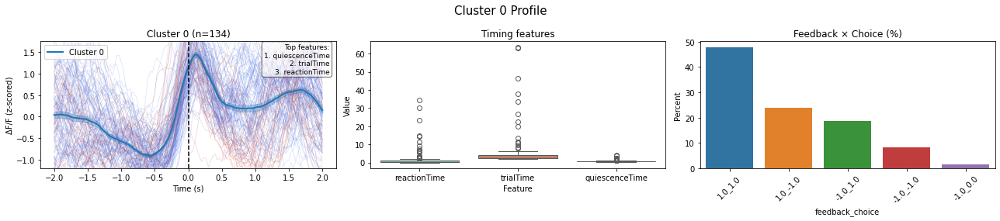

<ipython-input-269-c93f7d2c5a5f>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-269-c93f7d2c5a5f>:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


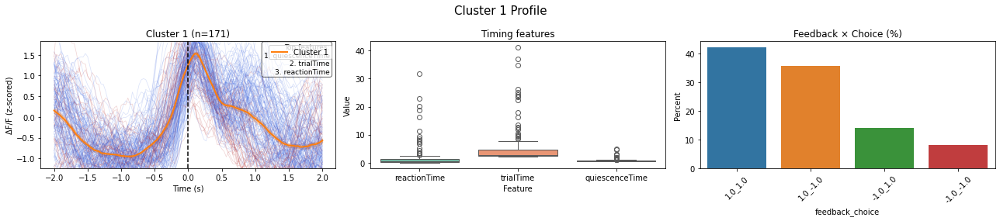

<ipython-input-269-c93f7d2c5a5f>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-269-c93f7d2c5a5f>:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


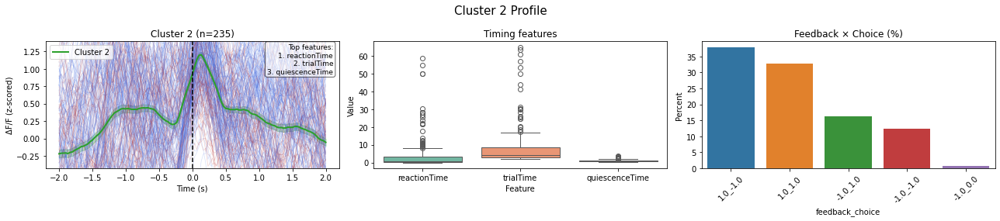

<ipython-input-269-c93f7d2c5a5f>:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-269-c93f7d2c5a5f>:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


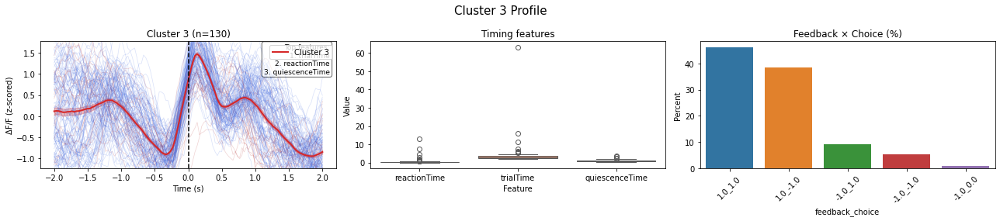

In [269]:
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
trial_colors = {1: "royalblue", -1: "firebrick"}

# Precompute per-cluster top 3 features
top_features_dict = {}
for k in sorted(df_trials["gmm_cluster"].unique()):
    y_bin = (df_trials["gmm_cluster"] == k).astype(int)
    rf = RandomForestClassifier(n_estimators=500, random_state=42)
    rf.fit(X, y_bin)
    importances = pd.Series(rf.feature_importances_, index=X.columns)
    top_features_dict[k] = importances.sort_values(ascending=False).head(3)

# --- Profile cards ---
for k in sorted(df_trials["gmm_cluster"].unique()):
    mask = df_trials["gmm_cluster"] == k
    n_trials = mask.sum()
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    
    # --- (1) PSTH: individual traces + mean ± SEM ---
        # --- (1) PSTH: individual traces + mean ± SEM ---
    for trial_idx in np.where(mask)[0]:
        fb = df_trials.iloc[trial_idx]["feedbackType"]
        color = trial_colors.get(fb, "gray")
        axes[0].plot(time_axis, Y[trial_idx], color=color, alpha=0.2, lw=0.7)
    
    cluster_traces = Y[mask]
    mean_trace = cluster_traces.mean(axis=0)
    sem_trace = cluster_traces.std(axis=0) / np.sqrt(n_trials)
    
    axes[0].plot(time_axis, mean_trace, color=colors[k], lw=2, label=f"Cluster {k}")
    axes[0].fill_between(time_axis, mean_trace - sem_trace, mean_trace + sem_trace,
                         color=colors[k], alpha=0.3)
    axes[0].axvline(0, color="k", linestyle="--")
    axes[0].set_title(f"Cluster {k} (n={n_trials})")
    axes[0].set_xlabel("Time (s)")
    axes[0].set_ylabel("ΔF/F (z-scored)")
    axes[0].legend()
    
    # NEW: set ylim around cluster mean ± SEM with margin
    ymin = (mean_trace - sem_trace).min()
    ymax = (mean_trace + sem_trace).max()
    margin = 0.1 * (ymax - ymin)
    axes[0].set_ylim(ymin - margin, ymax + margin)

    
    # Annotate top 3 features
    tf = top_features_dict[k]
    feature_text = "\n".join([f"{i+1}. {f}" for i, f in enumerate(tf.index)])
    axes[0].text(0.98, 0.98, f"Top features:\n{feature_text}",
                 transform=axes[0].transAxes,
                 fontsize=9, va="top", ha="right",
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6))
    
    # --- (2) Boxplots for timing features ---
    timing_feats = ["reactionTime", "trialTime", "quiescenceTime"]
    sub = df_trials.loc[mask, timing_feats].melt(var_name="Feature", value_name="Value")
    sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
    axes[1].set_title("Timing features")
    
    # --- (3) Barplot for feedback × choice composition ---
    comp = df_trials.loc[mask, "feedback_choice"].value_counts(normalize=True) * 100
    sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")
    axes[2].set_title("Feedback × Choice (%)")
    axes[2].set_ylabel("Percent")
    axes[2].set_xlabel("feedback_choice")
    axes[2].tick_params(axis="x", rotation=45)
    
    plt.suptitle(f"Cluster {k} Profile", fontsize=15)
    plt.tight_layout()
    plt.show()


Global feature importances:
 trialTime          0.258071
reactionTime       0.256008
quiescenceTime     0.253140
allSContrasts      0.073564
allContrasts       0.059658
probabilityLeft    0.054273
choice             0.026131
feedbackType       0.019155
dtype: float64


<ipython-input-270-c02837faac85>:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-270-c02837faac85>:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


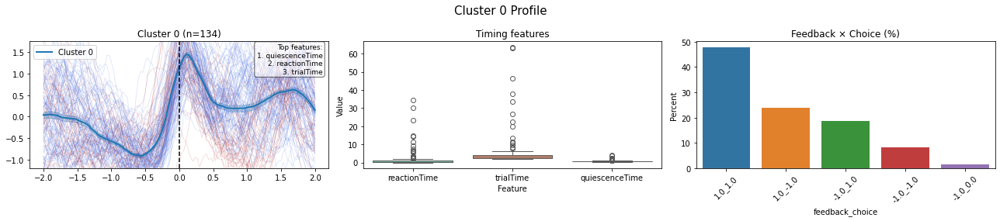

<ipython-input-270-c02837faac85>:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-270-c02837faac85>:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


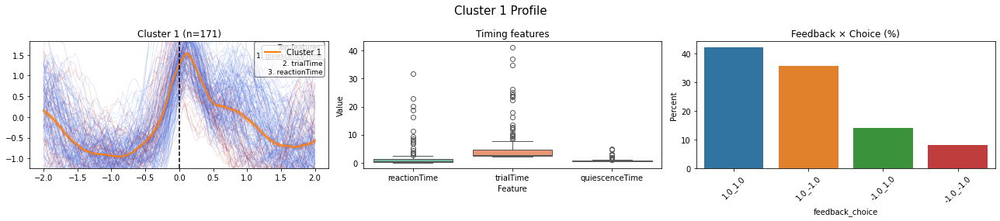

<ipython-input-270-c02837faac85>:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-270-c02837faac85>:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


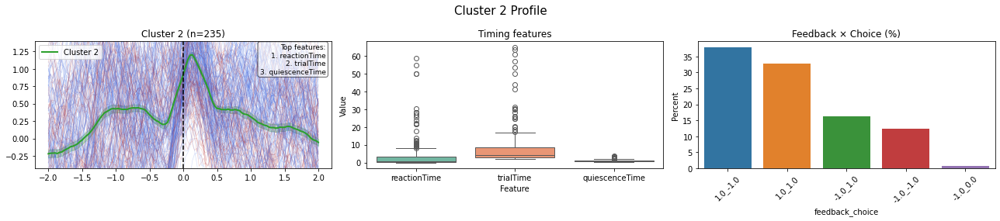

<ipython-input-270-c02837faac85>:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
<ipython-input-270-c02837faac85>:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")


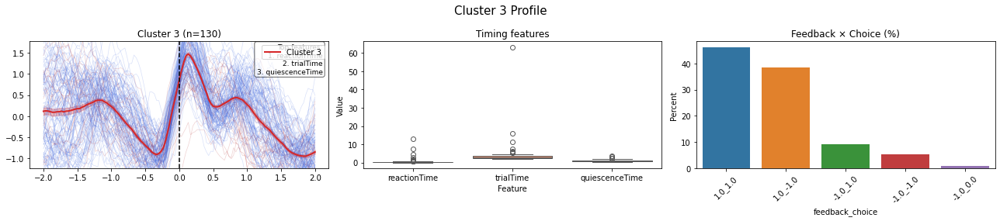

In [270]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import RandomForestClassifier

# =========================================
# 1. Dimensionality reduction + clustering
# =========================================
pca = PCA(n_components=10)
pca_clust = pca.fit_transform(Y)   # Y = trials × timepoints

gmm = GaussianMixture(n_components=4, random_state=42)
assignments = gmm.fit_predict(pca_clust)
df_trials["gmm_cluster"] = assignments

# =========================================
# 2. New feature: feedback × choice combo
# =========================================
df_trials["feedback_choice"] = df_trials["feedbackType"].astype(str) + "_" + df_trials["choice"].astype(str)

# =========================================
# 3. Global feature importance (RF)
# =========================================
features = ["quiescenceTime", "reactionTime", "trialTime",
            "allContrasts", "allSContrasts",
            "feedbackType", "choice", "probabilityLeft"]
X = df_trials[features].fillna(0)
y = df_trials["gmm_cluster"]

rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X, y)
global_importances = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("Global feature importances:\n", global_importances.head(10))

# =========================================
# 4. Per-cluster top features
# =========================================
top_features_dict = {}
for k in sorted(df_trials["gmm_cluster"].unique()):
    y_bin = (df_trials["gmm_cluster"] == k).astype(int)
    rf = RandomForestClassifier(n_estimators=500, random_state=42)
    rf.fit(X, y_bin)
    importances = pd.Series(rf.feature_importances_, index=X.columns)
    top_features_dict[k] = importances.sort_values(ascending=False).head(3)

# =========================================
# 5. Profile cards per cluster
# =========================================
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]
trial_colors = {1: "royalblue", -1: "firebrick"}  # correct vs incorrect

for k in sorted(df_trials["gmm_cluster"].unique()):
    mask = df_trials["gmm_cluster"] == k
    n_trials = mask.sum()
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    
    # --- (1) PSTH: trials (blue=correct, red=incorrect) + mean ± SEM ---
    for trial_idx in np.where(mask)[0]:
        fb = df_trials.iloc[trial_idx]["feedbackType"]
        color = trial_colors.get(fb, "gray")
        axes[0].plot(time_axis, Y[trial_idx], color=color, alpha=0.2, lw=0.7)
    
    cluster_traces = Y[mask]
    mean_trace = cluster_traces.mean(axis=0)
    sem_trace = cluster_traces.std(axis=0) / np.sqrt(n_trials)
    axes[0].plot(time_axis, mean_trace, color=colors[k], lw=2, label=f"Cluster {k}")
    axes[0].fill_between(time_axis, mean_trace - sem_trace, mean_trace + sem_trace,
                         color=colors[k], alpha=0.3)
    axes[0].axvline(0, color="k", linestyle="--")
    axes[0].set_title(f"Cluster {k} (n={n_trials})")
    axes[0].legend()
    
    # Scale ylim to mean ± SEM
    ymin, ymax = (mean_trace - sem_trace).min(), (mean_trace + sem_trace).max()
    margin = 0.1 * (ymax - ymin)
    axes[0].set_ylim(ymin - margin, ymax + margin)
    
    # Annotate top 3 features
    tf = top_features_dict[k]
    feature_text = "\n".join([f"{i+1}. {f}" for i, f in enumerate(tf.index)])
    axes[0].text(0.98, 0.98, f"Top features:\n{feature_text}",
                 transform=axes[0].transAxes, fontsize=9,
                 va="top", ha="right",
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6))
    
    # --- (2) Boxplots for timing features ---
    timing_feats = ["reactionTime", "trialTime", "quiescenceTime"]
    sub = df_trials.loc[mask, timing_feats].melt(var_name="Feature", value_name="Value")
    sns.boxplot(x="Feature", y="Value", data=sub, ax=axes[1], palette="Set2")
    axes[1].set_title("Timing features")
    
    # --- (3) Barplot of feedback × choice composition ---
    comp = df_trials.loc[mask, "feedback_choice"].value_counts(normalize=True) * 100
    sns.barplot(x=comp.index, y=comp.values, ax=axes[2], palette="tab10")
    axes[2].set_title("Feedback × Choice (%)")
    axes[2].set_ylabel("Percent")
    axes[2].tick_params(axis="x", rotation=45)
    
    plt.suptitle(f"Cluster {k} Profile", fontsize=15)
    plt.tight_layout()
    plt.show()


In [271]:
# build pre cluster behav profiles
# Accuracy per cluster
df_trials.groupby("gmm_cluster")["feedbackType"].apply(lambda x: (x==1).mean())

# Mean timing features per cluster
df_trials.groupby("gmm_cluster")[["reactionTime","trialTime","quiescenceTime"]].mean()


,reactionTime,trialTime,quiescenceTime
gmm_cluster,,,
0,1.893910,5.837356,0.760569
1,1.697329,5.190618,0.702966
2,4.009107,8.068039,0.902239
3,0.601367,3.759287,0.906955


In [272]:
import statsmodels.formula.api as smf

# Example: reactionTime ~ cluster + (1|subject)
model = smf.mixedlm("reactionTime ~ C(gmm_cluster)", 
                    df_trials, 
                    groups=df_trials["subject"])  # random intercept per subject
result = model.fit()
print(result.summary())


IndexError: index 666 is out of bounds for axis 0 with size 666

In [ ]:
# Ensure proper index alignment
df_trials = df_trials.reset_index(drop=True)

# Check subject column exists
print(df_trials.columns)

# Example model again
import statsmodels.formula.api as smf

model = smf.mixedlm("reactionTime ~ C(gmm_cluster)",
                    df_trials,
                    groups=df_trials["subject"])  # random intercept
result = model.fit()
print(result.summary())


Index(['stimOnTrigger_times', 'goCueTrigger_times', 'allContrasts',
       'allSContrasts', 'stimOff_times', 'stimOffTrigger_times', 'included',
       'quiescencePeriod', 'goCue_times', 'response_times', 'choice',
       'stimOn_times', 'contrastLeft', 'contrastRight', 'feedback_times',
       'feedbackType', 'rewardVolume', 'probabilityLeft',
       'firstMovement_times', 'intervals_0', 'intervals_1', 'subject', 'date',
       'eid', 'reactionTime', 'responseTime', 'quiescenceTime', 'trialTime',
       'probL', 'trialNumber', 'zdff_drop_pre_stim', 'correct',
       'consecutive_correct', 'prev_quiescenceTime', 'prev_trialTime',
       'zdff_drop_pre_stim_mean', 'zdff_drop_pre_stim_min',
       'zdff_drop_pre_stim_slope', 'prev_feedbackType', 'prev_choice',
       'prev_allContrasts', 'prev_allSContrasts', 'prev_reactionTime',
       'prev_probabilityLeft', 'prev_responseTime',
       'prev_zdff_drop_pre_stim_mean', 'prev_zdff_drop_pre_stim_min',
       'prev_zdff_drop_pre_stim_slope'

IndexError: index 628 is out of bounds for axis 0 with size 628

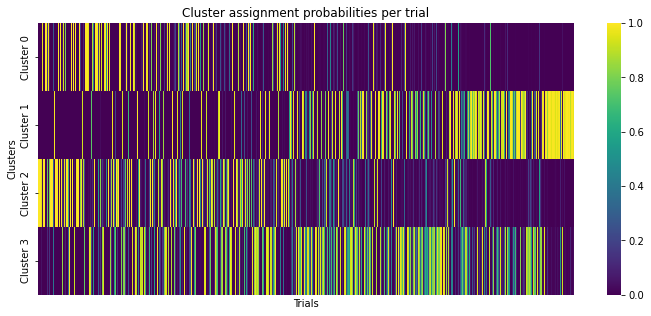

In [ ]:
# Probabilities for each trial
probs = gmm.predict_proba(pca_clust)  # shape: n_trials × n_clusters

# Heatmap
plt.figure(figsize=(12,5))
sns.heatmap(probs.T, cmap="viridis", cbar=True,
            xticklabels=False, yticklabels=[f"Cluster {i}" for i in range(probs.shape[1])])
plt.xlabel("Trials")
plt.ylabel("Clusters")
plt.title("Cluster assignment probabilities per trial")
plt.show()


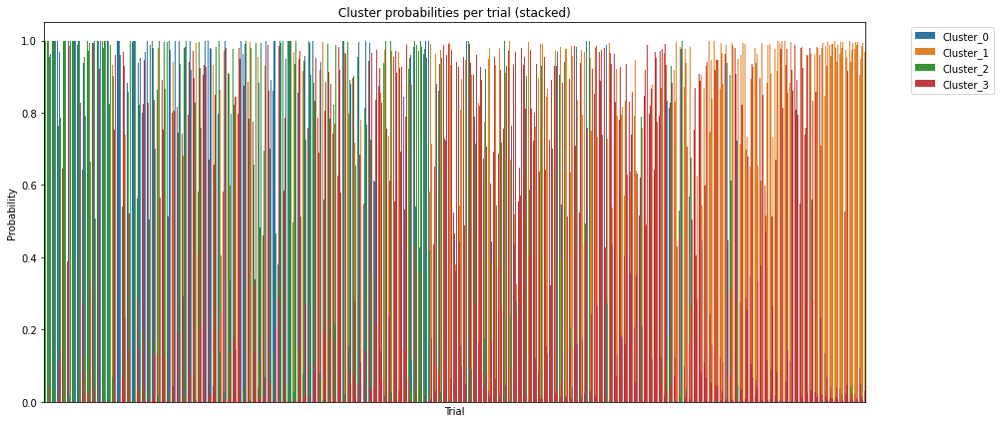

In [ ]:
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

df_probs_melt = df_probs.melt(id_vars="Trial", var_name="Cluster", value_name="Probability")

plt.figure(figsize=(14,6))
sns.barplot(x="Trial", y="Probability", hue="Cluster", data=df_probs_melt,
            palette="tab10", dodge=False)
plt.title("Cluster probabilities per trial (stacked)")
plt.xlabel("Trial")
plt.ylabel("Probability")
plt.xticks([], [])  # hide trial numbers if too many
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [ ]:
df_probs_table = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs_table["Assigned"] = assignments
df_probs_table.head(10)  # first 10 trials


,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Assigned
0,1.255949e-04,2.451632e-73,0.999874,3.546425e-24,2
1,4.658035e-05,6.332604e-89,0.999953,2.473202e-35,2
2,2.999009e-13,8.042861e-47,1.000000,5.205306e-18,2
3,7.398108e-04,8.518219e-13,0.999208,5.234587e-05,2
4,5.189829e-04,2.881823e-04,0.954988,4.420480e-02,2
5,9.634836e-01,4.011612e-14,0.036455,6.158623e-05,0
6,8.919613e-04,1.478115e-03,0.997314,3.155159e-04,2
7,2.522815e-14,6.005650e-21,0.999407,5.927230e-04,2
8,9.997823e-01,1.941757e-47,0.000218,2.189356e-29,0
9,3.549436e-05,2.846777e-30,0.999964,6.299878e-07,2


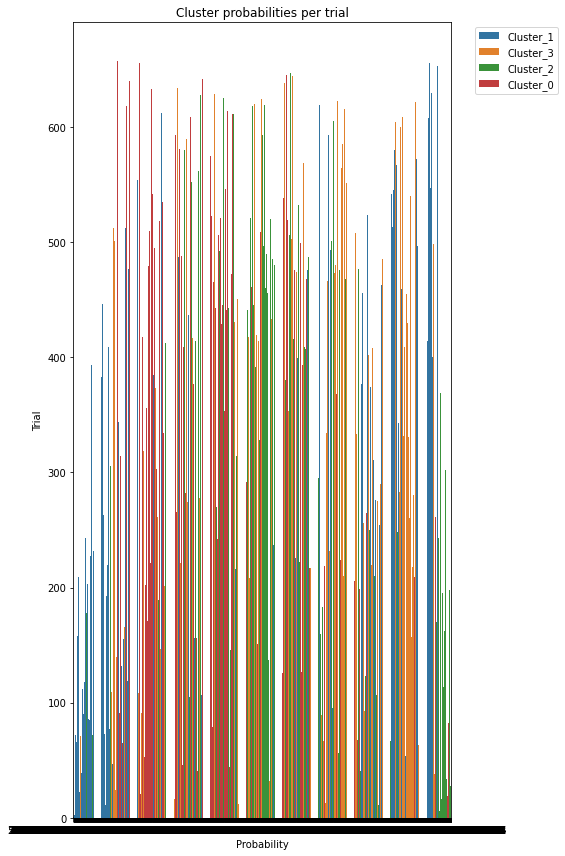

In [ ]:
# Probabilities DataFrame
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Melt into long form
df_probs_melt = df_probs.melt(id_vars="Trial", var_name="Cluster", value_name="Probability")

# Horizontal stacked barplot
plt.figure(figsize=(8,12))  # tall figure to spread out trials
sns.barplot(y="Trial", x="Probability", hue="Cluster", data=df_probs_melt,
            palette="tab10", dodge=False)

plt.title("Cluster probabilities per trial")
plt.xlabel("Probability")
plt.ylabel("Trial")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


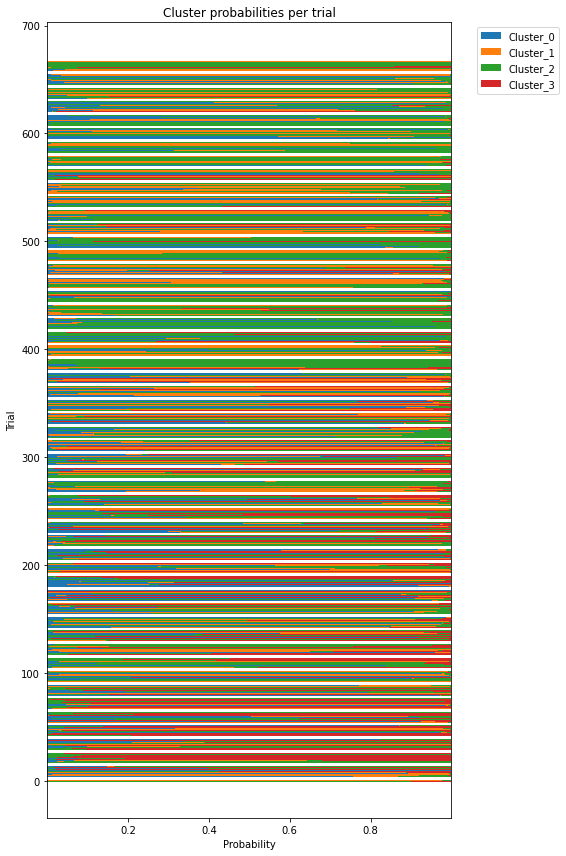

In [273]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(8, 12))
bottom = np.zeros(len(df_probs))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs["Trial"], df_probs[col], left=bottom,
            label=col, height=0.8, color=plt.cm.tab10(i))
    bottom += df_probs[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trial")
ax.set_title("Cluster probabilities per trial")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


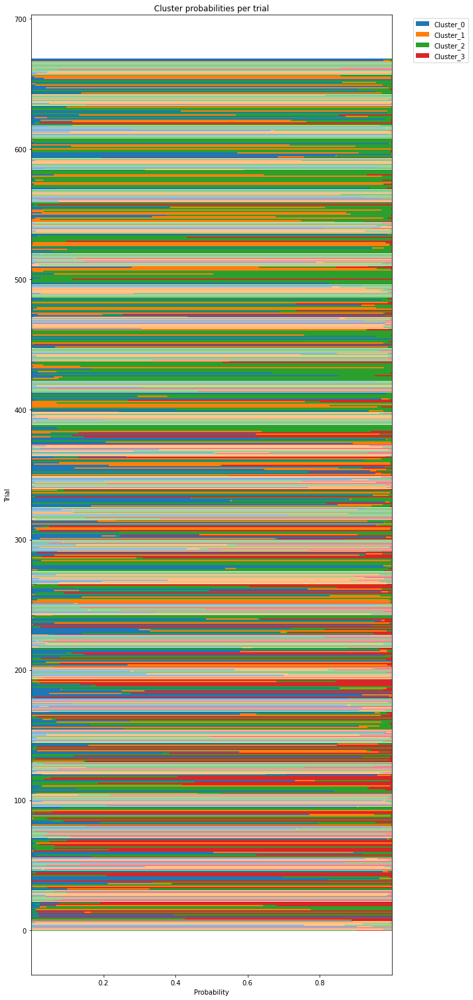

In [274]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(10, 21))
bottom = np.zeros(len(df_probs))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs["Trial"], df_probs[col], left=bottom,
            label=col, height=0.8, color=plt.cm.tab10(i))
    bottom += df_probs[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trial")
ax.set_title("Cluster probabilities per trial")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


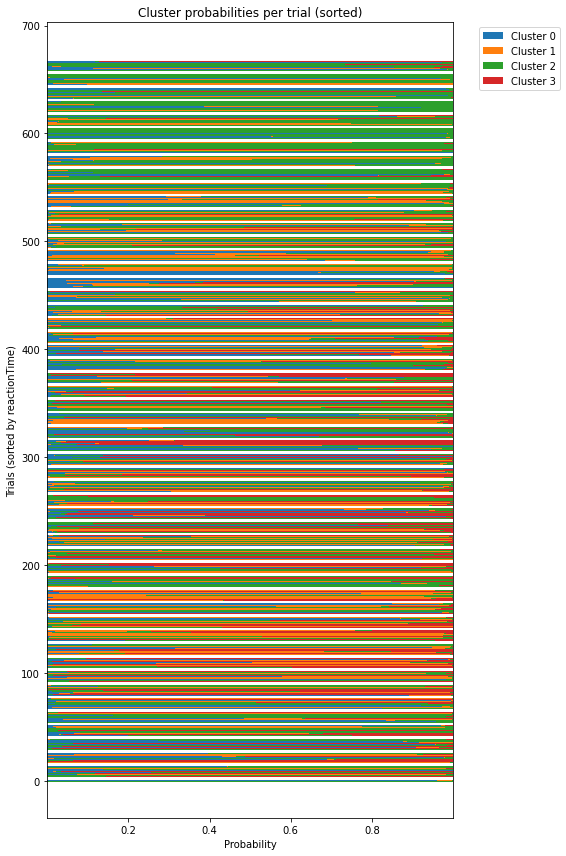

In [275]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Add behavioral feature to sort by
df_probs["reactionTime"] = df_trials["reactionTime"].values
df_probs["trialTime"] = df_trials["trialTime"].values

# Sort by reactionTime (can change to "trialTime")
df_probs_sorted = df_probs.sort_values("reactionTime").reset_index(drop=True)

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(8, 12))
bottom = np.zeros(len(df_probs_sorted))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs_sorted.index, df_probs_sorted[col],
            left=bottom, height=0.8, color=plt.cm.tab10(i), label=col if i==0 else "")
    bottom += df_probs_sorted[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trials (sorted by reactionTime)")
ax.set_title("Cluster probabilities per trial (sorted)")
ax.legend([f"Cluster {i}" for i in range(probs.shape[1])],
          bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


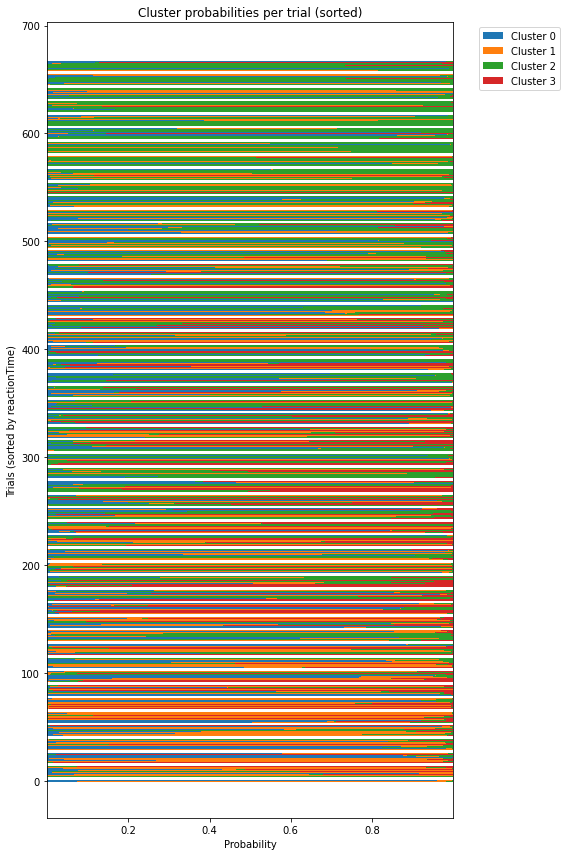

In [276]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Add behavioral feature to sort by
df_probs["reactionTime"] = df_trials["reactionTime"].values
df_probs["trialTime"] = df_trials["trialTime"].values

# Sort by reactionTime (can change to "trialTime")
df_probs_sorted = df_probs.sort_values("trialTime").reset_index(drop=True)

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(8, 12))
bottom = np.zeros(len(df_probs_sorted))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs_sorted.index, df_probs_sorted[col],
            left=bottom, height=0.8, color=plt.cm.tab10(i), label=col if i==0 else "")
    bottom += df_probs_sorted[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trials (sorted by reactionTime)")
ax.set_title("Cluster probabilities per trial (sorted)")
ax.legend([f"Cluster {i}" for i in range(probs.shape[1])],
          bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


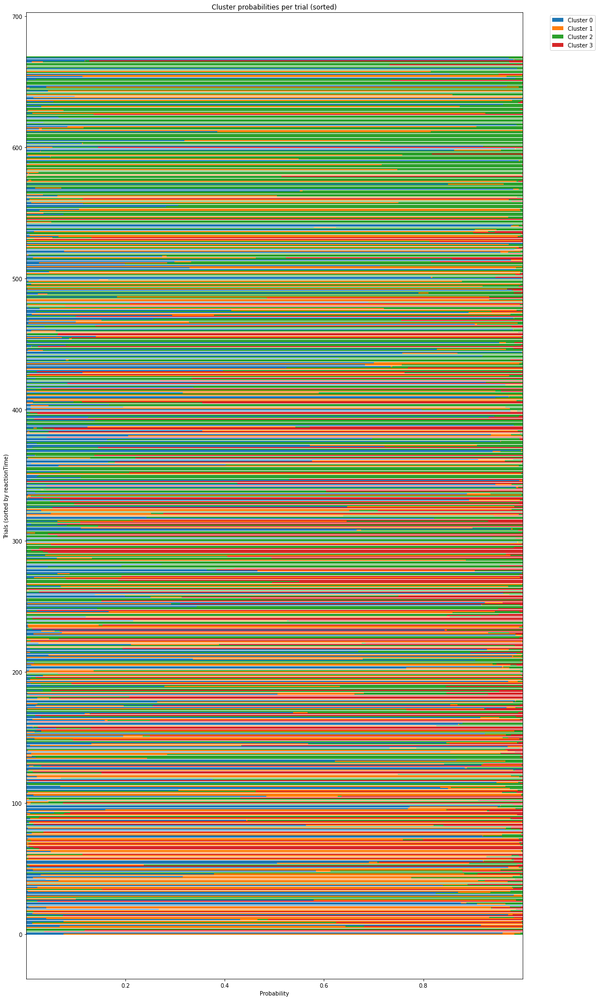

In [277]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Add behavioral feature to sort by
df_probs["reactionTime"] = df_trials["reactionTime"].values
df_probs["trialTime"] = df_trials["trialTime"].values

# Sort by reactionTime (can change to "trialTime")
df_probs_sorted = df_probs.sort_values("trialTime").reset_index(drop=True)

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(15, 25))
bottom = np.zeros(len(df_probs_sorted))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs_sorted.index, df_probs_sorted[col],
            left=bottom, height=0.8, color=plt.cm.tab10(i), label=col if i==0 else "")
    bottom += df_probs_sorted[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trials (sorted by reactionTime)")
ax.set_title("Cluster probabilities per trial (sorted)")
ax.legend([f"Cluster {i}" for i in range(probs.shape[1])],
          bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


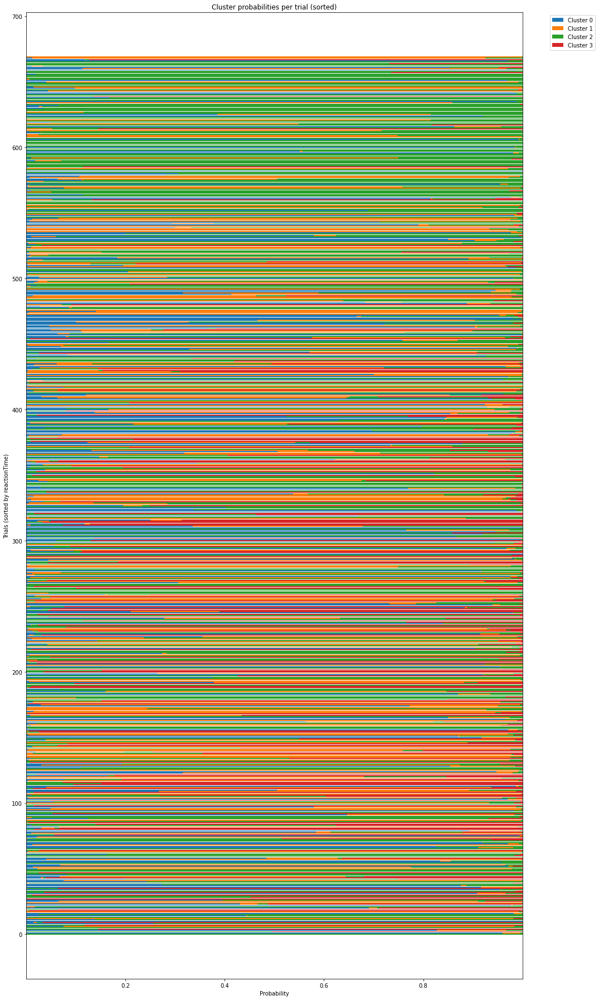

In [278]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Add behavioral feature to sort by
df_probs["reactionTime"] = df_trials["reactionTime"].values
df_probs["trialTime"] = df_trials["trialTime"].values

# Sort by reactionTime (can change to "trialTime")
df_probs_sorted = df_probs.sort_values("reactionTime").reset_index(drop=True)

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(15, 25))
bottom = np.zeros(len(df_probs_sorted))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs_sorted.index, df_probs_sorted[col],
            left=bottom, height=0.8, color=plt.cm.tab10(i), label=col if i==0 else "")
    bottom += df_probs_sorted[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trials (sorted by reactionTime)")
ax.set_title("Cluster probabilities per trial (sorted)")
ax.legend([f"Cluster {i}" for i in range(probs.shape[1])],
          bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


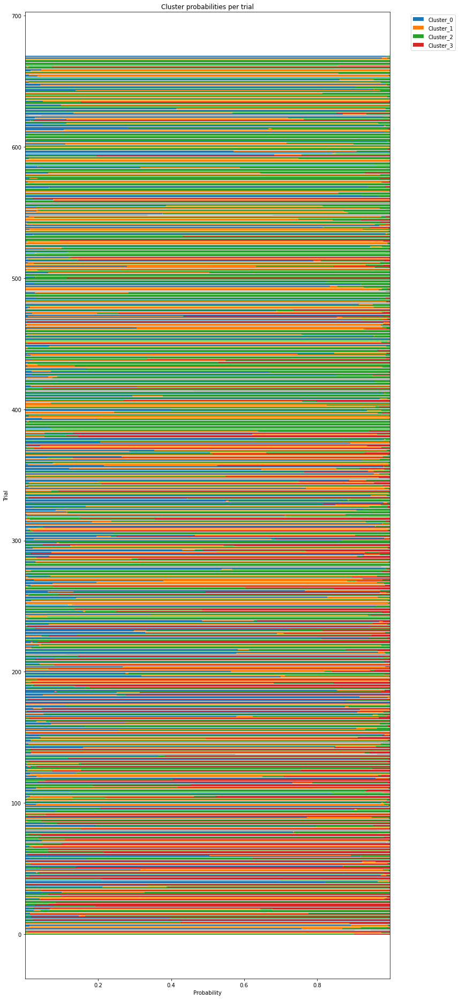

In [279]:
# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Plot as stacked horizontal bars
fig, ax = plt.subplots(figsize=(12, 26))
bottom = np.zeros(len(df_probs))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs["Trial"], df_probs[col], left=bottom,
            label=col, height=0.8, color=plt.cm.tab10(i))
    bottom += df_probs[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trial")
ax.set_title("Cluster probabilities per trial")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


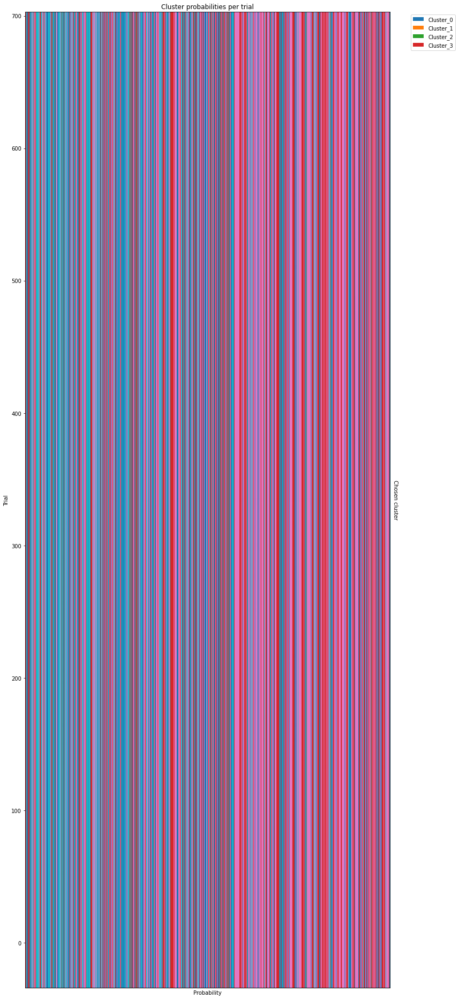

In [280]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Build dataframe of probabilities
df_probs = pd.DataFrame(probs, columns=[f"Cluster_{i}" for i in range(probs.shape[1])])
df_probs["Trial"] = np.arange(len(probs))

# Hard assignments = argmax probability
assignments = np.argmax(probs, axis=1)

# Stacked barplot
fig, ax = plt.subplots(figsize=(12, 26))
bottom = np.zeros(len(df_probs))

for i, col in enumerate([f"Cluster_{i}" for i in range(probs.shape[1])]):
    ax.barh(df_probs["Trial"], df_probs[col], left=bottom,
            label=col, height=0.8, color=plt.cm.tab10(i))
    bottom += df_probs[col]

ax.set_xlabel("Probability")
ax.set_ylabel("Trial")
ax.set_title("Cluster probabilities per trial")

# Add color strip for chosen cluster
ax2 = ax.twinx()
ax2.imshow(assignments[:, None].T, aspect="auto",
           cmap=plt.cm.tab10, extent=(1.0, 1.05, -0.5, len(assignments)-0.5))
ax2.set_yticks([])
ax2.set_xticks([])
ax2.set_ylabel("Chosen cluster", rotation=-90, labelpad=15)

ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [281]:
# Install if not yet
# !pip install tslearn

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tslearn.clustering import TimeSeriesKMeans

# =========================================
# 1. Prepare data
# =========================================
# Y: trials × timepoints (already aligned to feedback/stim)
# time_axis: corresponding time points

# tslearn requires shape (n_samples, n_timestamps, 1)
Y_dtw = Y[:, :, np.newaxis]

# =========================================
# 2. Run DTW clustering
# =========================================
n_clusters = 4  # adjust if needed
km_dtw = TimeSeriesKMeans(n_clusters=n_clusters,
                          metric="dtw", max_iter=50,
                          random_state=42, n_jobs=-1)
dtw_labels = km_dtw.fit_predict(Y_dtw)

df_trials["dtw_cluster"] = dtw_labels

# =========================================
# 3. Visualize average trace per DTW cluster
# =========================================
colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
for k, ax in enumerate(axes.flatten()):
    mask = dtw_labels == k
    if mask.sum() == 0:
        continue
    
    # Plot thin trial traces
    ax.plot(time_axis, Y[mask].T, color="gray", alpha=0.2, lw=0.7)
    
    # Plot cluster average (DTW barycenter)
    mean_trace = km_dtw.cluster_centers_[k, :, 0]
    ax.plot(time_axis, mean_trace, color=colors[k], lw=3, label=f"Cluster {k}")
    
    ax.axvline(0, color="k", linestyle="--")
    ax.set_title(f"Cluster {k} (n={mask.sum()} trials)")
    ax.legend()

fig.suptitle("DTW-based clustering of signal shapes", fontsize=15)
plt.tight_layout()
plt.show()

# =========================================
# 4. Compare with trial features (optional)
# =========================================
plt.figure(figsize=(8,5))
sns.countplot(x="dtw_cluster", hue="feedbackType", data=df_trials,
              palette={1:"royalblue", -1:"firebrick"})
plt.title("FeedbackType distribution per DTW cluster")
plt.show()

plt.figure(figsize=(8,5))
sns.countplot(x="dtw_cluster", hue="choice", data=df_trials,
              palette={1:"royalblue", -1:"firebrick", 0:"seagreen"})
plt.title("Choice distribution per DTW cluster")
plt.show()


ModuleNotFoundError: No module named 'tslearn'

In [ ]:
1+1